This is our base CNN model which has val_acc of 0.674 and nicely fitted learning curve. Our main objective was to figure out a way to improve the accuracy of the model. Our initial attempt was through using KerasTuner, as shown in 1.2

In [1]:
import os
import h5py
import librosa
import itertools
from copy import copy
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [2]:
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Add
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import PReLU
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [3]:
# For reproducibility purposes
np.random.seed(42)

# Read the data

> Helper functions to assist the process to read songs, split then and return an array of spectrograms/melspectrograms

In [4]:
"""
@description: Method to split a song into multiple songs using overlapping windows
"""
def splitsongs(X, y, window = 0.05, overlap = 0.5):
    # Empty lists to hold our results
    temp_X = []
    temp_y = []

    # Get the input song array size
    xshape = X.shape[0]
    chunk = int(xshape*window)
    offset = int(chunk*(1.-overlap))
    
    # Split the song and create new ones on windows
    spsong = [X[i:i+chunk] for i in range(0, xshape - chunk + offset, offset)]
    for s in spsong:
        if s.shape[0] != chunk:
            continue

        temp_X.append(s)
        temp_y.append(y)

    return np.array(temp_X), np.array(temp_y)

In [5]:
"""
@description: Method to convert a list of songs to a np array of melspectrograms
"""
def to_melspectrogram(songs, n_fft=1024, hop_length=256):
    # Transformation function
    melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
        hop_length=hop_length, n_mels=128)[:,:,np.newaxis]

    # map transformation of input songs to melspectrogram using log-scale
    tsongs = map(melspec, songs)
    # np.array([librosa.power_to_db(s, ref=np.max) for s in list(tsongs)])
    return np.array(list(tsongs))

In [6]:
def split_convert(X, y):
    arr_specs, arr_genres = [], []
    
    # Convert to spectrograms and split into small windows
    for fn, genre in zip(X, y):
        signal, sr = librosa.load(fn)
        signal = signal[:song_samples]

        # Convert to dataset of spectograms/melspectograms
        signals, y = splitsongs(signal, genre)

        # Convert to "spec" representation
        specs = to_melspectrogram(signals)

        # Save files
        arr_genres.extend(y)
        arr_specs.extend(specs)
    
    return np.array(arr_specs), to_categorical(arr_genres)

In [7]:
def read_data(src_dir, genres, song_samples):    
    # Empty array of dicts with the processed features from all files
    arr_fn = []
    arr_genres = []

    # Get file list from the folders
    for x,_ in genres.items():
        folder = src_dir + x
        for root, subdirs, files in os.walk(folder):
            for file in files:
                file_name = folder + "/" + file

                # Save the file name and the genre
                arr_fn.append(file_name)
                arr_genres.append(genres[x])
    
    # Split into train and test
    X_train, X_test, y_train, y_test = train_test_split(
        arr_fn, arr_genres, test_size=0.3, random_state=42, stratify=arr_genres
    )
    
    # Split into small segments and convert to spectrogram
    X_train, y_train = split_convert(X_train, y_train)
    X_test, y_test = split_convert(X_test, y_test)

    return X_train, X_test, y_train, y_test

In [8]:
# Parameters
gtzan_dir = '../data/genres/'
song_samples = 660000
genres = {'metal': 0, 'disco': 1, 'classical': 2, 'hiphop': 3, 'jazz': 4, 
          'country': 5, 'pop': 6, 'blues': 7, 'reggae': 8, 'rock': 9}

# Read the data
X_train, X_test, y_train, y_test = read_data(gtzan_dir, genres, song_samples)

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0123291  -0.0269165  -0.0670166  ...  0.11465454  0.05511475
  0.02459717] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.5009155   0.51641846  0.5246887  ... -0.37496948 -0.30233765
 -0.0994873 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1227417  -0.13146973 -0.26950073 ...  0.02819824  0.09997559
  0.15484619] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02804565 -0.00064087  0.06378174 ... -0.04589844 -0.00558472
  0.03567505] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12710571 -0.12228394 -0.10998535 ...  0.22055054  0.2809143
  0.3144226 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06277466 0.06356812 0.0458374  ... 0.24362183 0.26409912 0.27801514] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.40200806 -0.47103882 -0.548584   ...  0.30651855 -0.18164062
 -0.35437012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08847046 -0.16921997 -0.23278809 ... -0.18417358 -0.15148926
 -0.12075806] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.36965942 -0.41357422 -0.01019287 ...  0.11404419  0.06860352
  0.01629639] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15161133  0.18582153  0.07290649 ... -0.00366211 -0.02755737
  0.00463867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08441162 -0.00219727 -0.02297974 ... -0.26089478 -0.26626587
 -0.1822815 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05447388 -0.08145142 -0.09387207 ... -0.24551392 -0.26623535
 -0.25256348] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04110718 -0.04446411 -0.04376221 ... -0.04302979 -0.0463562
 -0.04980469] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09365845  0.06469727  0.04058838 ... -0.04589844 -0.052948
 -0.0519104 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05221558 -0.05703735 -0.06588745 ...  0.05856323  0.05300903
  0.05957031] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06063843 0.05477905 0.04650879 ... 0.23779297 0.21694946 0.2157898 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2803955  -0.2815857  -0.29595947 ...  0.13500977  0.16693115
  0.23849487] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21170044 0.18692017 0.19168091 ... 0.30337524 0.175354   0.21066284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18847656 -0.12289429 -0.08352661 ... -0.13421631 -0.0140686
  0.10116577] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00927734  0.01608276  0.03955078 ...  0.36328125  0.39645386
  0.38952637] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0859375  0.14483643 0.14294434 ... 0.03170776 0.02667236 0.02206421] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.33779907  0.30187988  0.236969   ... -0.03207397 -0.06997681
 -0.1333313 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00634766 0.03540039 0.06945801 ... 0.4623108  0.46881104 0.46524048] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1296997  -0.08135986 -0.0697937  ... -0.20297241 -0.26571655
 -0.28863525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3661499   0.25860596  0.16851807 ... -0.14450073 -0.14541626
 -0.09463501] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20529175 -0.17425537 -0.08529663 ... -0.0135498   0.00738525
  0.01501465] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02734375 -0.02209473 -0.07366943 ... -0.15267944 -0.20306396
 -0.24591064] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05340576 -0.05023193 -0.04803467 ...  0.01541138  0.02093506
  0.02301025] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00546265 0.01553345 0.02459717 ... 0.3191223  0.33932495 0.3499756 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02194214 0.01870728 0.00802612 ... 0.00299072 0.0201416  0.03219604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24978638  0.27142334  0.38998413 ... -0.0296936   0.30792236
 -0.0098877 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27230835  0.27859497  0.36380005 ... -0.02023315  0.00588989
  0.02532959] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08908081 -0.20562744 -0.14068604 ...  0.39968872  0.40908813
  0.39105225] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05096436 -0.05566406 -0.05947876 ... -0.07000732 -0.00534058
  0.01083374] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01828003 -0.00863647 -0.07055664 ...  0.10934448  0.11065674
  0.08227539] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03646851  0.00369263 -0.02511597 ... -0.03921509  0.00793457
 -0.00384521] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09701538  0.08001709  0.03646851 ... -0.00085449 -0.0480957
 -0.07434082] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06793213 0.09793091 0.08496094 ... 0.13967896 0.17681885 0.16955566] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05377197 -0.04016113  0.02114868 ...  0.0553894   0.05200195
  0.0524292 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0057373  -0.00631714 -0.00732422 ...  0.02276611  0.02340698
  0.02203369] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00927734  0.00848389  0.0062561  ... -0.00091553 -0.00112915
 -0.00119019] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01916504  0.01577759  0.01245117 ... -0.01879883  0.02783203
 -0.00784302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03234863 -0.03082275 -0.03042603 ...  0.00134277  0.0027771
  0.00366211] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05181885 -0.05584717 -0.04989624 ...  0.068573    0.08660889
  0.08624268] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00204468 -0.00018311 -0.00192261 ... -0.01141357 -0.04403687
 -0.06115723] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20541382  0.11102295  0.29727173 ... -0.00314331 -0.20700073
 -0.2932434 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.31347656 -0.2718506  -0.13928223 ... -0.34890747 -0.09939575
  0.05004883] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3781128  -0.4276123  -0.3562317  ...  0.01657104  0.00991821
 -0.00128174] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07156372  0.07873535  0.0958252  ... -0.05099487 -0.04141235
 -0.068573  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1921997  -0.2033081  -0.20440674 ...  0.1137085   0.14364624
  0.12609863] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11889648 -0.13342285 -0.13256836 ...  0.15142822  0.1444397
  0.12121582] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02835083 0.04296875 0.05438232 ... 0.0402832  0.04171753 0.04345703] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00601196 -0.01220703 -0.02026367 ... -0.0710144  -0.08560181
 -0.07711792] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04232788 0.04067993 0.04064941 ... 0.02313232 0.02853394 0.03497314] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03967285  0.03604126  0.03366089 ... -0.00183105 -0.00030518
  0.00097656] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00363159 0.00701904 0.00823975 ... 0.00637817 0.00750732 0.00827026] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00164795  0.00152588  0.00100708 ... -0.01748657 -0.01828003
 -0.02029419] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11334229 -0.1156311  -0.1404419  ...  0.05996704  0.04229736
  0.02688599] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04434204  0.11203003  0.08416748 ... -0.09039307 -0.11813354
 -0.13504028] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05911255  0.02514648  0.03598022 ...  0.03439331 -0.03262329
  0.04187012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07672119 -0.05603027 -0.05755615 ...  0.04989624  0.03088379
  0.07217407] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19088745 -0.16479492 -0.10009766 ... -0.13186646 -0.10232544
 -0.05639648] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10055542  0.10519409  0.10290527 ...  0.02069092 -0.03201294
  0.01412964] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2663269  0.21508789 0.17489624 ... 0.36828613 0.3491516  0.31567383] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14633179  0.14016724  0.13961792 ...  0.22296143 -0.11123657
 -0.2081604 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2657776  0.2234497  0.1857605  ... 0.07592773 0.06869507 0.08721924] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03128052 0.05911255 0.04718018 ... 0.03921509 0.03155518 0.03723145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02648926 -0.03158569  0.01092529 ...  0.05926514  0.04678345
  0.03823853] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04638672  0.03491211  0.03790283 ...  0.00222778 -0.01528931
 -0.03799438] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10696411  0.12390137  0.14752197 ... -0.26385498 -0.31488037
 -0.36624146] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.29690552 -0.27334595 -0.2800598  ... -0.01327515 -0.04644775
 -0.21310425] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3173828  -0.23406982 -0.21707153 ...  0.04998779  0.06021118
  0.04943848] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.31484985  0.2616577   0.2642517  ... -0.08990479  0.13226318
  0.2698059 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21737671 0.0539856  0.0534668  ... 0.29776    0.20101929 0.16036987] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09713745 0.15649414 0.0892334  ... 0.15179443 0.16818237 0.31185913] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1439209   0.16036987  0.17489624 ... -0.06234741 -0.06140137
 -0.06134033] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06716919 0.07327271 0.07580566 ... 0.14682007 0.16036987 0.15957642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06124878 -0.06445312 -0.06845093 ...  0.0088501   0.00408936
 -0.0012207 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00769043 -0.0435791  -0.04373169 ... -0.15249634 -0.1366272
 -0.09899902] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.28826904 -0.2657776  -0.17312622 ...  0.05444336  0.04669189
  0.01828003] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07965088 -0.05252075 -0.03475952 ...  0.04202271 -0.0369873
 -0.02017212] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.4039917  -0.78549194 -0.39001465 ...  0.08587646  0.03170776
  0.04776001] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16390991 -0.10269165 -0.02331543 ... -0.00305176  0.02584839
  0.06219482] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0859375   0.12286377  0.08694458 ... -0.1914978  -0.15731812
 -0.2909546 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11260986  0.10250854  0.08215332 ...  0.04711914 -0.07086182
 -0.05786133] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.29248047  0.01660156  0.18395996 ... -0.27038574 -0.30566406
 -0.30664062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02432251  0.05444336 -0.09429932 ... -0.16723633 -0.2767334
 -0.32852173] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2482605   0.23834229  0.2236023  ... -0.01721191 -0.01580811
 -0.01470947] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23449707  0.1887207   0.1621399  ... -0.0055542   0.00064087
  0.00112915] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01303101 -0.01077271 -0.00878906 ...  0.040802    0.02536011
  0.01107788] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13632202 -0.17739868 -0.16693115 ... -0.04718018 -0.02584839
 -0.04055786] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02093506  0.07406616  0.09747314 ... -0.17114258  0.07739258
  0.16278076] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05966187 -0.0430603  -0.07516479 ... -0.28533936 -0.17095947
 -0.04998779] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3031311   0.48171997  0.58743286 ...  0.15524292 -0.08554077
 -0.2081604 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08651733  0.30688477  0.2954712  ... -0.23577881 -0.02285767
 -0.21017456] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14208984  0.0279541   0.2326355  ... -0.18798828 -0.07492065
 -0.48776245] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01019287 -0.00912476 -0.00762939 ...  0.01870728  0.01815796
  0.01748657] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03234863 0.03134155 0.02798462 ... 0.00830078 0.01193237 0.019104  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01586914  0.01330566  0.01000977 ... -0.02096558 -0.02056885
 -0.01831055] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01531982 0.02493286 0.03167725 ... 0.00332642 0.04827881 0.02362061] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22253418 -0.22692871 -0.24905396 ...  0.03155518  0.05654907
  0.04718018] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02886963 -0.01452637 -0.04000854 ...  0.2838745   0.1885376
  0.43432617] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09542847  0.10287476  0.10925293 ... -0.1267395  -0.13760376
 -0.16207886] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05010986 0.03256226 0.02890015 ... 0.14620972 0.16174316 0.16546631] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1756897  -0.14004517 -0.11804199 ... -0.08163452 -0.03259277
 -0.03918457] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09609985 -0.02142334  0.10784912 ... -0.20825195 -0.14419556
 -0.20791626] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09545898 -0.13180542 -0.15927124 ...  0.10302734  0.07397461
  0.08987427] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19607544 -0.17340088 -0.12139893 ...  0.01217651  0.10775757
  0.20462036] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04592896 -0.03863525 -0.00537109 ...  0.02215576  0.01113892
  0.03179932] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07391357 -0.05032349 -0.11019897 ...  0.12506104  0.13494873
  0.15661621] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03601074  0.02075195  0.04440308 ...  0.27371216 -0.21340942
  0.08282471] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12155151 -0.22695923 -0.30740356 ... -0.16113281 -0.12637329
  0.01852417] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02426147 -0.03393555 -0.01144409 ... -0.03692627  0.01089478
  0.09350586] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06542969 -0.01629639  0.06585693 ... -0.36288452 -0.4544983
 -0.25604248] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09286499 0.09039307 0.084198   ... 0.04577637 0.04528809 0.04174805] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01123047 -0.01773071 -0.02316284 ...  0.06903076  0.08190918
  0.08834839] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03085327  0.01394653 -0.00442505 ...  0.01358032  0.02035522
  0.02172852] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.31134033 -0.25680542 -0.22012329 ... -0.03503418 -0.03897095
 -0.02978516] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.42868042 -0.5004883  -0.34909058 ... -0.03463745 -0.07318115
 -0.15267944] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01074219  0.01989746  0.05169678 ...  0.0300293   0.06140137
  0.10705566] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13769531 -0.16690063 -0.1869812  ... -0.33206177 -0.2781372
 -0.21374512] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07781982  0.10305786  0.05422974 ...  0.04931641 -0.00302124
 -0.04101562] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23059082 -0.28805542 -0.33703613 ... -0.04672241 -0.04092407
 -0.05169678] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02575684  0.00717163  0.02603149 ...  0.02462769  0.02606201
  0.03024292] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.28305054 0.30688477 0.33251953 ... 0.05862427 0.09664917 0.10757446] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02615356  0.01879883  0.0045166  ... -0.13357544 -0.16921997
 -0.17218018] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06228638 -0.09375    -0.09216309 ... -0.03100586  0.0088501
  0.00366211] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0645752  -0.0652771  -0.07043457 ... -0.12652588 -0.1984253
 -0.24642944] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06097412 -0.04525757 -0.15539551 ...  0.01779175  0.08578491
  0.0960083 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0062561  -0.01605225 -0.02365112 ...  0.0362854   0.03222656
  0.02603149] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11663818 -0.12042236 -0.12359619 ... -0.01043701 -0.01095581
 -0.0105896 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02026367  0.01522827  0.01242065 ... -0.02111816 -0.0239563
 -0.08154297] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02081299 -0.03112793 -0.02337646 ...  0.09527588  0.05508423
  0.01956177] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04626465 -0.0512085  -0.0539856  ... -0.07861328 -0.07217407
 -0.03375244] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01025391 0.01156616 0.01501465 ... 0.26574707 0.29614258 0.22573853] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01113892 0.01318359 0.02947998 ... 0.01535034 0.00964355 0.01596069] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0256958  -0.03656006 -0.04959106 ... -0.01971436 -0.01077271
 -0.01333618] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0111084   0.02258301  0.02609253 ... -0.3305359  -0.31661987
 -0.2637024 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02236938 -0.07232666 -0.0977478  ... -0.46984863 -0.4371338
 -0.3840027 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.31863403  0.00088501 -0.00848389 ...  0.15667725 -0.03430176
 -0.02825928] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3647766  -0.36169434 -0.3463745  ... -0.28808594 -0.28198242
 -0.14318848] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12753296 -0.27145386 -0.2026062  ... -0.22579956 -0.1843872
 -0.14715576] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08602905 0.08535767 0.06390381 ... 0.03518677 0.         0.01385498] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14804077 -0.09591675 -0.01443481 ...  0.0105896  -0.01879883
 -0.04904175] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09460449 -0.07824707 -0.05044556 ...  0.07818604  0.08612061
  0.11108398] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12161255  0.10281372  0.07540894 ... -0.06402588 -0.07040405
 -0.03616333] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04562378  0.04190063  0.02655029 ... -0.03753662 -0.02130127
  0.00323486] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02493286 -0.0262146  -0.02401733 ... -0.08718872 -0.14990234
 -0.1144104 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09939575 -0.10440063 -0.03701782 ...  0.18835449  0.09848022
  0.02877808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04519653  0.09005737  0.07757568 ...  0.02059937  0.00823975
 -0.01126099] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20944214 -0.17636108 -0.1638794  ... -0.07086182  0.00064087
 -0.08676147] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05963135 -0.06335449 -0.07174683 ... -0.08206177 -0.07321167
 -0.10012817] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27218628 -0.27218628 -0.08850098 ... -0.12194824 -0.1053772
 -0.02505493] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.30010986 0.22253418 0.15878296 ... 0.10913086 0.10647583 0.08978271] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.221344    0.24072266  0.10333252 ... -0.12042236 -0.08230591
  0.0194397 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06896973  0.07440186  0.11050415 ...  0.05557251  0.04229736
 -0.02255249] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09860229 0.07223511 0.04580688 ... 0.3157959  0.32537842 0.28231812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01220703 -0.00424194  0.15109253 ...  0.10974121  0.09585571
  0.07244873] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24453735  0.23217773  0.2260437  ... -0.05697632 -0.02893066
  0.03726196] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01068115 -0.0625     -0.09274292 ... -0.03692627 -0.03207397
 -0.09973145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2765808  -0.24450684 -0.16564941 ... -0.00579834 -0.00350952
  0.00030518] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13027954 -0.10269165 -0.10174561 ... -0.03063965 -0.14819336
 -0.2291565 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1395874  -0.1746521  -0.06533813 ...  0.07046509  0.09985352
  0.14834595] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03625488 -0.01199341 -0.00643921 ...  0.18078613  0.17437744
  0.16088867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14099121  0.10949707  0.07385254 ... -0.24768066 -0.29037476
 -0.31027222] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07141113 -0.0435791  -0.00695801 ...  0.02438354  0.02163696
  0.02001953] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11431885  0.11071777  0.10415649 ... -0.09249878 -0.10314941
 -0.11810303] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00631714 -0.02041626 -0.05221558 ... -0.10671997 -0.08099365
 -0.05130005] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06503296  0.06744385  0.07003784 ... -0.03997803 -0.01950073
 -0.00891113] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13339233 -0.12545776 -0.11523438 ...  0.0140686   0.02444458
  0.00335693] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01242065  0.02252197 -0.01550293 ... -0.11315918 -0.11465454
 -0.11724854] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09777832  0.04702759  0.35583496 ...  0.6887512   0.5948181
  0.38546753] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.43301392 0.4393921  0.35766602 ... 0.03479004 0.06542969 0.04724121] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09765625 -0.09408569 -0.03417969 ...  0.31881714  0.29641724
  0.25598145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01394653 -0.01245117 -0.01589966 ...  0.08010864  0.07867432
  0.07162476] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05493164 0.05926514 0.06140137 ... 0.04428101 0.04550171 0.0435791 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07125854  0.05606079  0.04455566 ... -0.00305176 -0.00021362
 -0.00704956] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2423706  -0.23410034 -0.19418335 ... -0.17102051 -0.15374756
 -0.12133789] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11859131 -0.12057495 -0.12356567 ... -0.39141846 -0.26409912
  0.06741333] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08111572 -0.06033325 -0.08630371 ... -0.03964233 -0.04800415
 -0.03353882] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2939453  0.40551758 0.43704224 ... 0.02224731 0.0317688  0.03521729] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09368896  0.19372559  0.24865723 ... -0.11209106 -0.1453247
 -0.13839722] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02084351  0.01745605  0.05059814 ... -0.00137329 -0.00067139
 -0.00109863] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.015625    0.05157471 -0.04284668 ...  0.06149292  0.03604126
 -0.00613403] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15557861  0.10421753  0.05322266 ... -0.01544189 -0.02850342
 -0.04644775] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 1.7089844e-03  3.0517578e-05 -4.3640137e-03 ...  1.8768311e-01
  1.2164307e-01  8.0413818e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03585815 -0.03604126 -0.03591919 ... -0.02365112 -0.01089478
  0.00048828] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01065063  0.00524902 -0.00738525 ... -0.12432861 -0.12432861
 -0.11965942] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00946045 0.00967407 0.00720215 ... 0.02825928 0.00518799 0.00109863] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08200073  0.09994507  0.09057617 ...  0.07946777  0.06292725
 -0.02520752] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13189697 -0.13006592 -0.11254883 ... -0.01263428 -0.06326294
  0.03305054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00189209  0.06271362  0.07540894 ...  0.07437134  0.05606079
  0.04873657] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02581787 0.0161438  0.00714111 ... 0.01144409 0.02313232 0.02703857] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04956055  0.05697632  0.05975342 ...  0.00445557 -0.00469971
 -0.01397705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01599121  0.00161743 -0.01004028 ...  0.00378418  0.00115967
 -0.0020752 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00686646  0.00585938  0.02484131 ... -0.14923096 -0.14480591
 -0.14675903] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05804443 -0.08895874 -0.11529541 ... -0.39569092 -0.32644653
 -0.27767944] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1300354  -0.105896   -0.09020996 ...  0.04989624  0.05264282
  0.05587769] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00476074 -0.0062561  -0.00610352 ...  0.00271606  0.00271606
  0.00259399] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 7.3852539e-03 -1.1413574e-02 -3.3386230e-02 ...  3.3569336e-04
  2.7465820e-04  3.0517578e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00250244  0.00299072  0.00244141 ... -0.00115967 -0.00131226
 -0.00152588] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04418945 0.07229614 0.12826538 ... 0.02435303 0.0296936  0.02758789] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18695068 -0.23013306 -0.09020996 ...  0.05743408  0.09051514
  0.0947876 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02886963  0.02514648  0.02276611 ...  0.13946533  0.05987549
 -0.00628662] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.109375   -0.0604248  -0.05737305 ... -0.15887451 -0.11645508
 -0.08786011] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00128174 -0.08200073 -0.01715088 ... -0.18048096 -0.24307251
 -0.2671814 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03460693 -0.00634766  0.02053833 ...  0.05114746  0.08355713
  0.15231323] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07910156 -0.15924072 -0.12905884 ... -0.06332397 -0.1159668
 -0.04162598] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.93862915 -0.62838745 -0.61483765 ... -0.14978027 -0.3286438
 -0.3651123 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02801514 -0.18386841 -0.27023315 ...  0.3074646   0.43359375
  0.4703369 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00415039 -0.02139282 -0.02529907 ... -0.28463745 -0.26919556
 -0.23858643] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06854248 -0.07073975 -0.05950928 ...  0.11404419  0.24935913
  0.1942749 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21511841 -0.23165894 -0.26107788 ...  0.07366943  0.07873535
  0.12747192] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16775513 -0.1784668  -0.14935303 ... -0.04748535 -0.0592041
 -0.06491089] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0737915   0.04785156  0.04705811 ... -0.11505127 -0.09896851
 -0.0944519 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06399536 -0.05673218 -0.0458374  ... -0.09463501 -0.10601807
 -0.11303711] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04507446  0.02719116  0.04364014 ... -0.02444458  0.07626343
  0.05349731] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06030273 -0.06607056 -0.03201294 ... -0.11755371 -0.11154175
 -0.09185791] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07009888 -0.12356567 -0.14041138 ...  0.06750488  0.06021118
  0.03042603] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03964233 -0.03604126 -0.03302002 ... -0.08297729 -0.0953064
 -0.10238647] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01660156 -0.0369873  -0.05157471 ... -0.00302124  0.00567627
  0.01599121] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10342407 -0.09939575 -0.09051514 ... -0.04385376 -0.04721069
 -0.04968262] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00927734 0.02197266 0.03530884 ... 0.2494812  0.21676636 0.16537476] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01953125  0.01629639  0.13345337 ...  0.00592041 -0.0864563
 -0.1899414 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13415527 0.15560913 0.19934082 ... 0.02456665 0.02160645 0.01773071] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00213623 -0.02371216 -0.03018188 ...  0.05807495 -0.07849121
 -0.19290161] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1401062   0.09823608  0.2479248  ...  0.47961426  0.4571228
  0.36340332] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21295166 -0.13162231 -0.0395813  ...  0.17678833  0.23022461
  0.19815063] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14593506 -0.17001343 -0.17883301 ... -0.04840088 -0.06784058
 -0.07653809] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11520386  0.07333374 -0.0246582  ... -0.05545044 -0.04006958
  0.06332397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05175781  0.0027771  -0.00039673 ...  0.2554016   0.25686646
  0.24786377] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.22241211 0.27294922 0.3112793  ... 0.39367676 0.29919434 0.21820068] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3788147  -0.33929443 -0.31503296 ... -0.23608398 -0.29489136
 -0.2805481 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2849121  0.36709595 0.39511108 ... 0.21633911 0.22589111 0.23223877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01019287  0.00018311 -0.01013184 ...  0.00698853  0.00646973
  0.00616455] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03814697  0.02874756  0.019104   ... -0.10342407 -0.10516357
 -0.10342407] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00137329  0.00085449 -0.00714111 ... -0.05899048 -0.05636597
 -0.05212402] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.30249023 0.27523804 0.2472229  ... 0.52767944 0.65322876 0.6817627 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03973389 0.03875732 0.0458374  ... 0.01153564 0.01171875 0.03140259] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.5874939   0.40447998  0.21008301 ... -0.01983643 -0.0305481
 -0.04232788] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12185669 0.15945435 0.21069336 ... 0.01022339 0.01553345 0.01965332] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13739014 0.19088745 0.23187256 ... 0.02352905 0.04241943 0.05184937] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02203369  0.02255249  0.02160645 ... -0.01217651 -0.01156616
 -0.01019287] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06741333 0.10473633 0.14505005 ... 0.23596191 0.22686768 0.23098755] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09637451 -0.08346558 -0.07769775 ...  0.20059204  0.21142578
  0.20730591] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2241211   0.23153687  0.26174927 ... -0.15814209 -0.19573975
 -0.22409058] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.22161865 0.22131348 0.18786621 ... 0.39123535 0.33059692 0.3284607 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08990479 -0.09915161 -0.15762329 ... -0.16070557 -0.10473633
 -0.11175537] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.47503662  0.5115967   0.4753723  ...  0.50131226  0.7277832
 -0.04449463] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.00167847 -0.00164795
 -0.00170898] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.         0.         0.         ... 0.02545166 0.01553345 0.04534912] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00158691 -0.0015564  -0.00143433 ...  0.02206421 -0.0072937
 -0.0213623 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01040649 -0.00863647 -0.0140686  ... -0.05169678 -0.06015015
 -0.07861328] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06930542  0.05422974  0.05065918 ... -0.04577637 -0.07131958
 -0.09225464] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07138062 -0.03146362  0.00540161 ...  0.00994873  0.02090454
  0.03085327] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15274048 -0.04037476 -0.15548706 ...  0.30786133  0.31710815
  0.32196045] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15509033  0.14431763  0.15014648 ... -0.02444458 -0.01507568
 -0.01049805] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3282776  0.3328247  0.33380127 ... 0.14904785 0.1144104  0.07717896] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01428223  0.00750732 -0.03012085 ...  0.06784058  0.04537964
  0.00860596] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09466553  0.0171814  -0.03283691 ...  0.0357666  -0.00701904
 -0.00393677] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0062561  -0.01037598 -0.04476929 ...  0.07681274  0.07598877
  0.0043335 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01016235 0.01589966 0.02194214 ... 0.07418823 0.08886719 0.10302734] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02154541 -0.06573486 -0.10699463 ... -0.1350708  -0.12893677
 -0.11923218] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11212158  0.12258911  0.13018799 ... -0.20755005 -0.20672607
 -0.20605469] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23519897 -0.29055786 -0.2541504  ...  0.08978271  0.09091187
  0.10165405] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19094849 -0.17333984 -0.16622925 ... -0.11682129 -0.11947632
 -0.1159668 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10125732 0.10925293 0.11877441 ... 0.03344727 0.05267334 0.0597229 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03347778 0.05764771 0.04989624 ... 0.08239746 0.07974243 0.07647705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07754517 -0.02108765 -0.00189209 ...  0.03204346  0.00720215
 -0.01211548] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07254028 0.07141113 0.06991577 ... 0.08181763 0.02728271 0.01617432] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00057983 -0.00750732  0.05099487 ...  0.06845093  0.07763672
  0.08203125] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19290161 -0.1665039  -0.08743286 ... -0.35662842 -0.32839966
 -0.25115967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08435059  0.08483887  0.08883667 ... -0.01831055 -0.01296997
 -0.01504517] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00097656 -0.0012207  -0.00366211 ...  0.02313232  0.02133179
  0.01968384] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00585938 -0.01309204 -0.01934814 ... -0.00765991 -0.00915527
 -0.0100708 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01806641  0.01675415  0.01538086 ... -0.0093689  -0.00848389
 -0.00799561] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0020752  -0.03814697 -0.0642395  ...  0.10821533  0.10440063
  0.09396362] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09674072 -0.08932495 -0.07147217 ...  0.00680542  0.04833984
  0.05239868] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07855225  0.06060791  0.03369141 ...  0.02468872 -0.0022583
  0.05047607] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.25909424 0.48797607 0.5100403  ... 0.11340332 0.10928345 0.0539856 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.44006348 -0.35238647 -0.28759766 ...  0.0324707   0.04983521
  0.06286621] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04116821 0.08804321 0.09243774 ... 0.24545288 0.22503662 0.4512329 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04675293  0.02304077 -0.01657104 ...  0.0489502   0.04403687
  0.03387451] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02737427 -0.04364014 -0.05447388 ...  0.09661865  0.09423828
  0.11203003] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02804565  0.02722168  0.00747681 ...  0.00640869 -0.00067139
 -0.00219727] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04391479  0.08087158  0.05908203 ...  0.00695801  0.03396606
 -0.0112915 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.39956665 -0.39257812 -0.40551758 ...  0.04162598  0.06045532
  0.07513428] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02645874 -0.00860596  0.02481079 ... -0.08203125 -0.16864014
 -0.09042358] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01452637 -0.01239014 -0.00970459 ...  0.00949097  0.00161743
  0.00186157] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00088501 -0.00244141 -0.00271606 ...  0.02285767  0.0171814
  0.01794434] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00283813 -0.00411987  0.0111084  ... -0.02264404 -0.02526855
 -0.02334595] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01004028 0.09625244 0.14807129 ... 0.06286621 0.10742188 0.2050476 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07214355 -0.05355835 -0.04196167 ... -0.04440308 -0.02874756
 -0.0007019 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08010864  0.11355591  0.04498291 ... -0.05111694 -0.03747559
 -0.02593994] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06845093  0.08963013  0.11340332 ... -0.0965271  -0.06762695
 -0.05923462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08477783 -0.04943848 -0.03207397 ...  0.04534912 -0.0012207
 -0.01980591] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0617981  -0.07232666 -0.08901978 ... -0.04846191  0.06079102
 -0.009552  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04034424  0.02908325  0.01092529 ... -0.11096191 -0.11547852
 -0.12109375] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06826782 -0.14352417 -0.24188232 ... -0.52145386 -0.681427
 -0.83358765] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17449951 -0.25134277 -0.2800293  ...  0.22808838  0.13891602
  0.2796936 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14736938  0.16220093  0.12216187 ... -0.06289673 -0.0657959
 -0.08496094] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05108643 -0.01608276 -0.00088501 ...  0.13290405  0.09017944
  0.10775757] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06964111 -0.09072876 -0.08810425 ... -0.14874268 -0.11517334
 -0.08627319] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15493774 0.02856445 0.0519104  ... 0.07147217 0.162323   0.23410034] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01013184  0.09240723 -0.19281006 ... -0.02615356  0.06048584
  0.1237793 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.31814575  0.36654663  0.2888794  ...  0.14691162  0.07385254
 -0.00875854] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07073975  0.08395386  0.16812134 ... -0.19293213 -0.23046875
 -0.17666626] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12213135 0.15081787 0.2144165  ... 0.3303833  0.37460327 0.311615  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03359985 -0.08517456 -0.12820435 ... -0.3482666  -0.31506348
 -0.22717285] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23010254 -0.25863647 -0.23880005 ... -0.00915527 -0.00744629
 -0.00756836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02630615 -0.02841187 -0.02767944 ... -0.03890991 -0.04370117
 -0.0413208 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00717163 -0.00521851 -0.00344849 ...  0.00665283  0.0128479
  0.0227356 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.31152344 -0.32199097 -0.23757935 ... -0.02886963 -0.10992432
  0.1487732 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03063965  0.02542114  0.02191162 ... -0.06533813 -0.06375122
 -0.04846191] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08630371 0.05285645 0.05825806 ... 0.05685425 0.06918335 0.04211426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.6046753   0.71759033  0.6593628  ... -0.24511719 -0.32403564
 -0.41818237] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.26940918  0.28970337  0.24102783 ... -0.00082397  0.00271606
  0.11010742] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.43164062 -0.33291626 -0.22354126 ... -0.15164185 -0.16195679
 -0.2659912 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05575562 0.04571533 0.02871704 ... 0.00888062 0.01364136 0.01760864] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01049805  0.02624512  0.02633667 ... -0.06845093 -0.04595947
 -0.08181763] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01861572 0.01477051 0.00741577 ... 0.0177002  0.01757812 0.01443481] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0177002  -0.03234863 -0.0411377  ... -0.05374146 -0.06982422
 -0.05688477] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1182251  0.05093384 0.08377075 ... 0.17114258 0.2048645  0.21951294] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04544067 -0.05215454 -0.03295898 ...  0.07897949  0.08984375
  0.05630493] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.250885   -0.2616272  -0.32629395 ... -0.13787842 -0.19818115
 -0.18643188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11236572 0.12438965 0.15435791 ... 0.169281   0.1595459  0.32144165] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2268982  -0.265625   -0.3446045  ...  0.01522827  0.0335083
  0.05987549] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0942688  -0.02389526 -0.00561523 ...  0.07528687  0.07275391
  0.1456604 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03033447 0.03665161 0.06164551 ... 0.02926636 0.07696533 0.13796997] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07156372  0.12234497  0.11825562 ...  0.02709961 -0.03909302
 -0.04730225] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01541138 -0.01611328 -0.01757812 ...  0.0050354   0.00506592
  0.00479126] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01107788 -0.00994873 -0.00839233 ... -0.00500488 -0.00631714
 -0.00741577] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00454712 0.00415039 0.00326538 ... 0.00637817 0.00820923 0.00912476] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05899048 -0.06008911 -0.05297852 ...  0.12435913  0.1282959
  0.1270752 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04690552  0.02401733 -0.00558472 ... -0.112854   -0.11825562
 -0.11532593] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12286377 0.11010742 0.10037231 ... 0.02877808 0.03781128 0.03881836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07537842  0.05203247  0.03259277 ... -0.24963379 -0.23306274
 -0.24389648] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00534058 -0.012146   -0.01507568 ... -0.22091675 -0.24603271
 -0.27001953] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.25735474 -0.24227905 -0.20605469 ...  0.00592041  0.0017395
 -0.03744507] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14633179 -0.19232178 -0.2585144  ...  0.08840942  0.02215576
 -0.00222778] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.43988037 -0.44958496 -0.34573364 ... -0.35327148 -0.05682373
 -0.22232056] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02545166 0.04284668 0.09106445 ... 0.13400269 0.22177124 0.29870605] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1232605   0.05392456 -0.06332397 ...  0.0793457   0.02462769
 -0.02197266] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2710266  -0.24655151 -0.2810669  ... -0.19607544 -0.10803223
 -0.06747437] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01925659  0.04269409  0.05218506 ... -0.07479858  0.03329468
  0.03723145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10617065 0.09466553 0.08477783 ... 0.05404663 0.06524658 0.0597229 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06872559 -0.097229   -0.0411377  ...  0.18295288  0.15197754
  0.16073608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03225708  0.02752686  0.06460571 ... -0.15499878 -0.18096924
 -0.1559143 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0435791   0.04830933  0.0553894  ... -0.08688354 -0.09301758
 -0.0788269 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02874756 0.12460327 0.1819458  ... 0.02511597 0.0362854  0.01821899] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06768799 -0.05444336 -0.07910156 ...  0.0803833   0.06869507
  0.00289917] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04364014 -0.00836182  0.01031494 ...  0.0055542   0.00558472
  0.00527954] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04995728 -0.05282593 -0.0552063  ...  0.04544067  0.04940796
  0.0531311 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00393677  0.00314331  0.00213623 ... -0.07522583 -0.06341553
 -0.05960083] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13366699  0.20907593  0.18832397 ... -0.05249023 -0.04959106
 -0.0536499 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01248169  0.02682495  0.10928345 ... -0.06777954 -0.00354004
 -0.00796509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08337402 -0.06436157 -0.01272583 ... -0.11032104 -0.01242065
  0.00305176] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15911865 0.2572937  0.24960327 ... 0.07391357 0.0647583  0.05563354] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.30441284  0.27093506  0.3859253  ... -0.05062866 -0.03875732
 -0.11660767] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05603027  0.06277466  0.06515503 ... -0.00137329 -0.01577759
  0.04412842] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01449585  0.03057861  0.01553345 ... -0.00772095  0.00628662
  0.03082275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01437378  0.04199219  0.08157349 ... -0.06771851 -0.15402222
 -0.09378052] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03091431 0.03259277 0.04263306 ... 0.20211792 0.09985352 0.07312012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04931641  0.04824829  0.10675049 ...  0.03973389  0.16531372
  0.19958496] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04019165 -0.05630493 -0.06796265 ...  0.16525269  0.09838867
  0.04492188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12838745  0.07232666  0.08099365 ... -0.02627563  0.08105469
  0.01049805] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.20367432 0.1975708  0.07546997 ... 0.13983154 0.26174927 0.02566528] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09197998  0.02084351  0.05807495 ... -0.30410767 -0.19580078
 -0.13754272] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13015747  0.37252808  0.1987915  ... -0.09088135 -0.00473022
  0.06466675] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00967407  0.01702881 -0.00170898 ... -0.0015564  -0.00158691
  0.00177002] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16189575 -0.16592407 -0.1531372  ...  0.14718628  0.14926147
  0.13833618] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00283813 0.00759888 0.01174927 ... 0.02215576 0.03729248 0.02560425] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16317749  0.10107422  0.06143188 ... -0.16018677 -0.14654541
 -0.11676025] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00979614 -0.06356812 -0.04299927 ... -0.02578735 -0.01422119
 -0.00439453] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08358765 -0.05197144 -0.0541687  ...  0.05853271  0.02386475
 -0.0133667 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06497192  0.11016846  0.09625244 ...  0.16940308  0.03820801
 -0.06695557] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05349731 -0.08346558 -0.26474    ... -0.47354126 -0.33499146
 -0.28344727] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03823853  0.06414795  0.23709106 ... -0.35894775 -0.32092285
 -0.20800781] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00769043 0.00769043 0.01409912 ... 0.01467896 0.05764771 0.07983398] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01113892  0.01248169  0.00897217 ... -0.01748657 -0.05166626
 -0.08511353] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09313965 0.09701538 0.04589844 ... 0.06915283 0.08227539 0.09301758] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02990723 -0.00595093  0.02575684 ... -0.03335571 -0.0324707
 -0.0300293 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11340332 -0.11157227 -0.1343689  ...  0.04315186  0.00650024
  0.00119019] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01452637 -0.00137329  0.03567505 ...  0.02789307  0.01428223
  0.01596069] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04180908 -0.03515625 -0.03540039 ...  0.18197632  0.22616577
  0.24041748] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20913696 -0.26965332 -0.28689575 ...  0.08306885  0.07592773
  0.07824707] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21878052  0.19515991  0.16278076 ... -0.16210938 -0.12136841
 -0.07540894] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03741455  0.0397644   0.04040527 ... -0.00509644 -0.00350952
 -0.00167847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23706055 -0.10516357 -0.06149292 ... -0.20321655 -0.09686279
 -0.04876709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00030518 0.00466919 0.0088501  ... 0.03674316 0.02987671 0.01419067] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03964233 0.05059814 0.05734253 ... 0.00811768 0.00540161 0.00241089] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12451172 -0.12243652 -0.10021973 ... -0.03381348 -0.02975464
 -0.00720215] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0020752  -0.00332642 -0.00695801 ... -0.02038574  0.01574707
  0.06845093] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09133911 -0.17276001  0.08093262 ...  0.12347412  0.17996216
  0.10592651] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05307007 -0.02166748 -0.05996704 ... -0.33135986 -0.35861206
 -0.381073  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05078125 0.08209229 0.18273926 ... 0.09313965 0.1642456  0.14758301] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11151123  0.08465576  0.09033203 ... -0.43600464 -0.41186523
 -0.42538452] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03460693 0.08557129 0.18643188 ... 0.0552063  0.19918823 0.17810059] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3352661  -0.36419678 -0.52297974 ...  0.27755737  0.3534851
  0.4270935 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0189209   0.11407471  0.15545654 ... -0.3258667  -0.38674927
 -0.3965454 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11056519  0.13323975  0.17993164 ... -0.00491333 -0.00854492
 -0.01864624] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.39749146 -0.36166382 -0.27194214 ...  0.18649292  0.21188354
  0.23196411] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00991821 -0.02462769 -0.04055786 ... -0.19262695 -0.21960449
 -0.2517395 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22109985  0.00942993  0.22250366 ...  0.05227661  0.05734253
  0.06710815] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.28381348 -0.3071289  -0.31585693 ...  0.04644775  0.04953003
  0.04446411] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00073242 -0.00042725 -0.0022583  ...  0.00427246  0.00424194
  0.00393677] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02325439  0.02178955  0.02035522 ... -0.04266357 -0.0413208
 -0.0340271 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0032959  0.00241089 0.0015564  ... 0.01254272 0.01467896 0.01583862] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10882568  0.0619812   0.10299683 ... -0.03692627  0.18807983
  0.09231567] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.33554077 -0.31066895 -0.34603882 ...  0.05105591  0.01431274
 -0.03753662] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02090454  0.09451294  0.08547974 ... -0.10064697 -0.09594727
 -0.09329224] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10113525 0.09152222 0.1055603  ... 0.33654785 0.318573   0.33972168] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10830688  0.01449585  0.03079224 ...  0.47857666  0.5319214
  0.3692627 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2562561  -0.01000977 -0.23461914 ...  0.3242798   0.18835449
  0.10614014] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17373657 -0.14556885 -0.09616089 ...  0.0380249   0.06240845
  0.04302979] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01266479 0.06317139 0.12835693 ... 0.08804321 0.0814209  0.14526367] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00762939 -0.05419922 -0.10391235 ... -0.14251709 -0.11657715
 -0.09359741] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.27438354 0.2315979  0.16390991 ... 0.2013855  0.12945557 0.04733276] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09579468 -0.06863403 -0.08297729 ...  0.01467896 -0.0171814
 -0.02914429] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01644897 -0.04229736 -0.03018188 ... -0.0430603  -0.01504517
  0.01574707] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01528931 -0.02883911 -0.02624512 ... -0.02087402 -0.02374268
 -0.02600098] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00863647 -0.00198364  0.00714111 ... -0.27801514 -0.25204468
 -0.22753906] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02911377 -0.03244019 -0.03536987 ...  0.0531311   0.05685425
  0.06240845] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00350952  0.00244141  0.0017395  ... -0.0244751  -0.02709961
 -0.02877808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00500488 -0.00671387 -0.00683594 ...  0.0065918   0.00805664
  0.01251221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02993774 -0.02844238 -0.0239563  ...  0.02487183  0.02258301
  0.01895142] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03143311 -0.05645752 -0.07049561 ... -0.36853027 -0.36346436
 -0.38076782] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00466919 -0.01153564 -0.0602417  ... -0.10333252 -0.12823486
 -0.09313965] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3604126  -0.31936646 -0.30160522 ...  0.08718872  0.08926392
  0.09313965] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0249939  -0.06524658 -0.02349854 ... -0.01403809 -0.05859375
 -0.06231689] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0461731  0.07702637 0.14059448 ... 0.00183105 0.05230713 0.02182007] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0145874  -0.04510498  0.01132202 ... -0.10507202 -0.13296509
 -0.16491699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11688232 -0.10223389 -0.10925293 ...  0.00390625  0.11416626
  0.21994019] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0022583   0.05551147  0.04833984 ... -0.11087036 -0.08798218
 -0.06292725] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.24539185 0.23999023 0.22003174 ... 0.04528809 0.24182129 0.24221802] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04598999 -0.02975464 -0.03781128 ... -0.00708008 -0.01361084
 -0.00946045] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06384277 -0.05175781 -0.02429199 ...  0.02151489  0.02426147
  0.02441406] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00091553 -0.00354004 -0.00949097 ... -0.04058838 -0.02337646
 -0.01309204] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03253174 -0.0111084   0.03509521 ... -0.05303955 -0.02044678
  0.08505249] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.16812134 0.1408081  0.14764404 ... 0.13583374 0.12008667 0.09716797] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21273804  0.24353027  0.11508179 ... -0.50772095 -0.36761475
 -0.11376953] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05435181 -0.05639648 -0.05639648 ...  0.01126099  0.01281738
  0.01583862] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01617432  0.01269531  0.0093689  ... -0.01205444 -0.01657104
 -0.01113892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01763916 0.0201416  0.021698   ... 0.02908325 0.02978516 0.03018188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05789185 0.06817627 0.07849121 ... 0.03207397 0.0324707  0.02896118] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0604248  -0.05792236 -0.06097412 ... -0.00390625 -0.00695801
 -0.01052856] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02563477  0.02362061  0.02478027 ... -0.00210571 -0.00476074
 -0.00775146] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04971313 0.05715942 0.06387329 ... 0.03851318 0.02276611 0.0020752 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07556152 -0.08206177 -0.0899353  ...  0.01187134  0.01171875
  0.00683594] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01861572 -0.04318237 -0.06887817 ...  0.00509644 -0.0140686
 -0.03399658] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02560425 0.02264404 0.04782104 ... 0.08023071 0.02697754 0.01513672] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02938843 0.06307983 0.09188843 ... 0.07867432 0.0793457  0.00881958] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01037598 -0.02792358 -0.02511597 ...  0.02929688  0.06454468
  0.02700806] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11978149 0.12481689 0.18170166 ... 0.18560791 0.30343628 0.34796143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.38510132 0.74572754 0.7810669  ... 0.22769165 0.15844727 0.25875854] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.41732788  0.49621582  0.41799927 ...  0.22122192 -0.05514526
  0.13269043] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09487915 -0.09118652 -0.14755249 ...  0.0144043   0.0302124
  0.04370117] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1083374   0.04562378 -0.00204468 ...  0.00549316  0.01712036
  0.03436279] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03924561 0.02651978 0.01239014 ... 0.04571533 0.04907227 0.00973511] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00653076 -0.0045166  -0.00280762 ... -0.05654907 -0.02496338
  0.02539062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03594971 -0.04641724 -0.06417847 ...  0.04119873  0.00134277
 -0.03213501] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07122803 0.11138916 0.11856079 ... 0.01171875 0.01092529 0.01327515] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0680542  -0.02145386  0.08972168 ... -0.00146484  0.15167236
 -0.11395264] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10940552 -0.13986206 -0.11273193 ... -0.2521057  -0.24182129
 -0.1845398 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06732178  0.06262207 -0.05160522 ...  0.06347656  0.02716064
  0.01776123] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0088501  -0.02166748 -0.04547119 ... -0.07015991 -0.06451416
 -0.08956909] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12020874  0.1257019   0.14102173 ... -0.09527588 -0.07305908
 -0.07406616] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04428101 -0.10601807 -0.16055298 ...  0.05581665  0.0647583
  0.09454346] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01885986  0.03253174 -0.01217651 ... -0.03115845 -0.02868652
 -0.02914429] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00198364  0.06298828  0.14151001 ...  0.0579834   0.06219482
  0.05377197] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20962524 -0.3809204  -0.39624023 ...  0.01364136  0.0352478
  0.04376221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03216553  0.0017395   0.03491211 ...  0.05883789  0.06243896
  0.06347656] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0138855  -0.01461792 -0.01901245 ...  0.02444458 -0.00570679
 -0.0267334 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06350708 0.06637573 0.07113647 ... 0.00460815 0.01626587 0.02142334] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15200806 -0.1550293  -0.16552734 ...  0.07223511  0.05795288
  0.05133057] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05227661  0.0586853   0.06060791 ... -0.06011963 -0.04281616
 -0.04055786] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02761841 -0.01370239 -0.04922485 ...  0.34176636  0.28466797
  0.21972656] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04321289 -0.04330444 -0.04263306 ...  0.09768677  0.09988403
  0.09823608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05734253 0.06365967 0.0007019  ... 0.03436279 0.02505493 0.01281738] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07962036  0.06781006  0.09155273 ... -0.06723022 -0.06726074
 -0.05819702] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19796753 -0.14550781 -0.12677002 ...  0.0874939   0.05755615
  0.03512573] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.25341797 0.29510498 0.261261   ... 0.06634521 0.09515381 0.07928467] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03952026  0.01599121 -0.02645874 ... -0.43374634 -0.5003052
 -0.5292053 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-3.7536621e-03 -1.0070801e-03  1.8310547e-04 ...  2.0733643e-01
  2.4414062e-03 -1.3220215e-01] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00247192 0.003479   0.00524902 ... 0.00775146 0.00881958 0.00881958] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2055664  -0.20230103 -0.08679199 ... -0.0144043  -0.01367188
 -0.01242065] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00021362  0.04568481  0.03237915 ... -0.06481934 -0.05200195
 -0.04660034] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22402954 -0.14727783 -0.11633301 ... -0.1559143  -0.10842896
  0.02053833] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05532837  0.02270508 -0.01040649 ... -0.06088257 -0.06237793
 -0.12667847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12716675 -0.19226074 -0.19293213 ... -0.04208374 -0.04092407
 -0.01312256] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06515503 0.06228638 0.14425659 ... 0.08303833 0.06503296 0.04492188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00241089  0.00549316  0.00866699 ... -0.00033569  0.00262451
  0.0100708 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03262329  0.02325439  0.03155518 ... -0.22164917 -0.23892212
 -0.21453857] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-1.5258789e-04 -8.6669922e-03 -4.1015625e-02 ... -1.7352295e-01
 -1.6720581e-01 -2.0144653e-01] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21130371 -0.19076538 -0.18154907 ...  0.03262329 -0.05926514
 -0.12503052] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21395874 -0.01358032 -0.08023071 ... -0.12185669 -0.16351318
 -0.0838623 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07363892 0.08059692 0.07165527 ... 0.28729248 0.3735962  0.39352417] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15991211 -0.06365967  0.02703857 ... -0.09835815 -0.08743286
 -0.07696533] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20535278 -0.14614868 -0.16317749 ...  0.07138062  0.04135132
 -0.05227661] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[3.0416870e-01 3.6886597e-01 4.4915771e-01 ... 6.1035156e-05 1.2054443e-01
 2.0812988e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11480713 -0.09439087 -0.01132202 ...  0.21200562  0.19924927
  0.1958313 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00524902 0.00231934 0.00228882 ... 0.084198   0.08084106 0.08618164] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.006073    0.00863647  0.01422119 ... -0.07879639 -0.08529663
 -0.08810425] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08618164  0.07702637  0.068573   ... -0.02355957  0.0078125
  0.02502441] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11987305 -0.08029175  0.01513672 ... -0.39736938 -0.4322815
 -0.47390747] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12936401 -0.21520996 -0.20806885 ... -0.0083313  -0.14337158
 -0.20376587] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.16052246 0.14993286 0.00933838 ... 0.17675781 0.11447144 0.12130737] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06185913 0.05484009 0.11724854 ... 0.10412598 0.05755615 0.04660034] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08682251 -0.07821655 -0.14456177 ...  0.1307373   0.15127563
  0.14471436] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04907227  0.03701782  0.02001953 ... -0.0020752   0.05105591
  0.11636353] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06665039 -0.04907227 -0.02487183 ...  0.07266235 -0.0201416
 -0.09262085] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09249878 -0.07327271 -0.03515625 ...  0.04370117  0.05895996
  0.05203247] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13830566 -0.1564331  -0.14227295 ... -0.08261108 -0.04968262
 -0.00811768] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.42251587 -0.4414673  -0.4755249  ... -0.21435547 -0.20605469
 -0.23626709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09500122 -0.04528809 -0.19528198 ...  0.04660034  0.00552368
  0.01959229] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23019409 -0.27059937 -0.28762817 ... -0.03231812 -0.00888062
 -0.02877808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12182617 -0.09136963 -0.07952881 ...  0.12197876  0.0642395
  0.00549316] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2886963  -0.27645874 -0.19174194 ...  0.06723022 -0.00500488
  0.04904175] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0786438  -0.08901978 -0.01132202 ... -0.01541138 -0.06573486
 -0.10058594] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00497437 0.00848389 0.00909424 ... 0.03091431 0.02264404 0.03005981] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08746338 -0.03820801 -0.00076294 ... -0.0682373  -0.07598877
 -0.08456421] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.046875    0.02877808  0.00772095 ...  0.00863647  0.00079346
 -0.00296021] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10015869 -0.10089111 -0.08496094 ...  0.05950928 -0.01055908
  0.0161438 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02124023 0.04824829 0.08139038 ... 0.25186157 0.26611328 0.18231201] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04812622  0.00143433 -0.05377197 ...  0.09542847  0.10144043
  0.10766602] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1423645  -0.12872314 -0.06658936 ... -0.00088501 -0.02310181
 -0.03744507] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03860474 -0.04031372 -0.03936768 ... -0.31802368 -0.38098145
 -0.41513062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06091309 -0.02655029  0.0291748  ...  0.03204346 -0.11074829
 -0.15847778] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.336792   -0.18792725 -0.21746826 ... -0.3297119  -0.27163696
 -0.3241272 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13214111 -0.05804443 -0.1255188  ...  0.5336914   0.6742859
  0.70599365] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22180176 -0.28875732 -0.3678589  ... -0.07821655 -0.18807983
 -0.3031311 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16140747 -0.15661621 -0.09112549 ... -0.03921509 -0.09417725
 -0.12921143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0211792   0.02331543 -0.01605225 ...  0.15576172  0.13269043
  0.12686157] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1343689  -0.13070679 -0.08050537 ... -0.02456665  0.03857422
  0.00650024] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01409912 0.01370239 0.01269531 ... 0.06314087 0.0765686  0.0899353 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01092529 0.01193237 0.01229858 ... 0.04898071 0.04455566 0.04138184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10137939 0.11029053 0.11700439 ... 0.28982544 0.27737427 0.26956177] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppD

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16409302 -0.1489563  -0.13787842 ...  0.15777588  0.14505005
  0.07537842] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00576782 -0.0065918  -0.00161743 ...  0.07675171  0.07730103
  0.07528687] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00183105 -0.00756836 -0.01281738 ...  0.05480957  0.05340576
  0.0519104 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01428223 -0.18695068 -0.24014282 ...  0.06985474 -0.07553101
 -0.20440674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02124023 -0.07846069 -0.16082764 ...  0.00802612  0.07150269
  0.05596924] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23406982 -0.29815674 -0.2765503  ...  0.3873291   0.2501526
  0.10598755] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05432129  0.1515503   0.27529907 ... -0.03042603 -0.08319092
 -0.18365479] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06750488 -0.07965088 -0.06033325 ... -0.04684448  0.02560425
  0.0630188 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19796753 -0.1611023  -0.08734131 ... -0.4190979  -0.35687256
 -0.26098633] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11688232 -0.12332153 -0.12890625 ... -0.00686646 -0.04696655
 -0.08752441] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07696533 -0.11022949 -0.07870483 ... -0.01525879  0.08331299
  0.06503296] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3708496  -0.3345337  -0.2831726  ... -0.20709229 -0.21203613
 -0.23602295] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02746582 0.0397644  0.05163574 ... 0.04293823 0.07025146 0.09545898] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02380371  0.00106812  0.05230713 ... -0.07141113 -0.05310059
 -0.07046509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06750488  0.08343506  0.11520386 ... -0.14517212 -0.16622925
 -0.17687988] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06549072 0.07733154 0.05422974 ... 0.04705811 0.0592041  0.05807495] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19229126 -0.2112732  -0.22891235 ...  0.09994507  0.08355713
  0.05822754] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05130005  0.04901123  0.06604004 ... -0.6828308  -0.64959717
 -0.594574  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13998413 0.13284302 0.13366699 ... 0.01470947 0.01333618 0.00805664] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27035522 -0.33398438 -0.2800598  ...  0.18536377  0.13922119
  0.16381836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00219727 -0.01300049 -0.02664185 ... -0.01501465 -0.01327515
 -0.01724243] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14990234  0.29901123  0.25845337 ... -0.00283813  0.02209473
  0.0982666 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07189941 -0.01156616  0.0534668  ...  0.18963623 -0.01760864
 -0.09402466] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1781311  0.17077637 0.22595215 ... 0.12408447 0.06607056 0.00866699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09823608 -0.09341431 -0.08016968 ...  0.13586426  0.10461426
  0.12173462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 3.3154297e-01  2.4423218e-01  1.4987183e-01 ...  2.4414062e-04
 -2.5909424e-02 -4.2388916e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16177368  0.20559692  0.22698975 ... -0.02822876 -0.01620483
  0.02505493] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00302124 -0.02542114 -0.06924438 ... -0.02719116 -0.00622559
 -0.02404785] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04782104 0.05636597 0.07675171 ... 0.21359253 0.17590332 0.22225952] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00463867  0.01095581 -0.00631714 ... -0.3534851  -0.32714844
 -0.21694946] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07272339 -0.06414795 -0.05224609 ... -0.03271484 -0.03988647
 -0.03039551] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.35977173 -0.3899231  -0.3510437  ...  0.02401733  0.01895142
  0.1050415 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01559448  0.01461792 -0.01651001 ... -0.01074219 -0.02679443
 -0.04608154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00415039  0.00259399 -0.00372314 ... -0.03948975 -0.03973389
 -0.05865479] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07888794 -0.06323242 -0.03384399 ...  0.0932312   0.04879761
 -0.01205444] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11624146 -0.07955933 -0.05477905 ...  0.04412842 -0.02319336
  0.06515503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06109619 -0.0899353  -0.13000488 ...  0.06359863  0.05404663
  0.1144104 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10668945 -0.09255981 -0.08087158 ...  0.08786011  0.00848389
  0.04092407] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15283203  0.17929077  0.20770264 ...  0.0196228   0.00238037
 -0.01379395] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00543213  0.0234375   0.02416992 ... -0.00558472  0.00219727
 -0.01327515] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03366089 -0.04977417 -0.00585938 ... -0.00628662 -0.08239746
 -0.12686157] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07925415  0.05932617  0.03930664 ... -0.11425781 -0.00100708
  0.04345703] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05325317  0.04144287  0.03857422 ... -0.01034546 -0.02642822
 -0.03103638] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07794189 -0.07095337 -0.06982422 ...  0.0145874   0.01306152
  0.02420044] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02178955 -0.00888062 -0.00042725 ...  0.11587524  0.20227051
  0.26831055] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0010376   0.00119019  0.00149536 ... -0.00793457 -0.01034546
 -0.01242065] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00448608 -0.00479126 -0.00527954 ...  0.00427246  0.00177002
  0.00302124] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01409912 -0.01373291 -0.01370239 ... -0.0355835  -0.03765869
 -0.03082275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2918396   0.31222534  0.28845215 ... -0.10366821 -0.02371216
  0.07723999] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00582886  0.03070068  0.1182251  ... -0.3036499  -0.13424683
 -0.13180542] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12731934  0.18048096  0.18612671 ... -0.16741943 -0.13827515
 -0.07739258] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00085449  0.00238037 -0.00286865 ... -0.15771484 -0.15756226
 -0.17919922] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0763855  -0.07339478 -0.07336426 ...  0.0446167   0.05194092
  0.05441284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18954468 -0.16470337 -0.12057495 ... -0.10015869 -0.11172485
 -0.09906006] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02514648 -0.03170776 -0.06738281 ... -0.36242676 -0.32034302
 -0.3657837 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.33807373 -0.28604126 -0.29238892 ...  0.13723755  0.2515564
  0.03308105] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3922119  -0.35168457 -0.28701782 ... -0.15597534 -0.36444092
 -0.08258057] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0062561   0.00198364  0.00491333 ...  0.03979492  0.03704834
  0.02963257] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0447998  -0.02963257 -0.02340698 ...  0.10317993  0.15551758
  0.21191406] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02438354 0.01629639 0.00805664 ... 0.00915527 0.00637817 0.00549316] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01434326 -0.0206604  -0.04681396 ...  0.01086426 -0.0206604
 -0.06103516] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16415405 -0.10467529 -0.07876587 ... -0.05960083 -0.02801514
 -0.00299072] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08273315 -0.07614136 -0.06628418 ...  0.06570435  0.01974487
 -0.06369019] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13220215 -0.03900146 -0.10543823 ... -0.5839844  -0.6248169
 -0.65826416] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.36035156 -0.41290283 -0.36175537 ... -0.11257935 -0.09509277
 -0.11636353] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.6094971  -0.60531616 -0.63897705 ... -0.16055298 -0.30664062
 -0.255188  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05780029 -0.09954834 -0.30847168 ... -0.00460815  0.05102539
 -0.02023315] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00393677  0.02148438  0.04342651 ... -0.01394653 -0.06335449
 -0.0552063 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00234985 -0.01080322 -0.02584839 ... -0.21292114 -0.1133728
 -0.24630737] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06152344  0.04949951  0.04083252 ... -0.07296753 -0.08953857
 -0.10247803] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07907104 -0.06314087 -0.0428772  ...  0.0090332   0.00680542
  0.00543213] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11315918 -0.11962891 -0.11709595 ... -0.28631592 -0.26220703
 -0.19744873] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04592896 -0.03262329 -0.0177002  ... -0.0177002  -0.01837158
 -0.01168823] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03900146  0.01489258 -0.00939941 ...  0.08581543  0.07366943
  0.06976318] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00085449  0.00982666  0.01977539 ...  0.0072937   0.01531982
  0.02380371] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00616455  0.00280762  0.00183105 ... -0.0057373  -0.00216675
  0.00479126] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02380371 0.02008057 0.02166748 ... 0.00125122 0.00299072 0.00701904] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00372314 0.00823975 0.0138855  ... 0.05487061 0.05075073 0.04727173] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04220581  0.07440186  0.11593628 ... -0.17312622 -0.1050415
 -0.21084595] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.22921753 0.2048645  0.22671509 ... 0.03552246 0.06048584 0.0222168 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.44171143 -0.46887207 -0.26104736 ... -0.41952515 -0.47244263
 -0.56326294] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05160522  0.03509521  0.01824951 ... -0.08459473 -0.09231567
 -0.11495972] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01367188 -0.01150513 -0.01043701 ... -0.0241394  -0.02642822
 -0.03076172] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14248657 -0.16043091 -0.15505981 ... -0.19662476 -0.20587158
 -0.22799683] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01016235 -0.02920532  0.0637207  ...  0.3701477   0.36758423
  0.33486938] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3540039  0.35125732 0.43414307 ... 0.08200073 0.08691406 0.08853149] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3765564  0.3543396  0.37139893 ... 0.07049561 0.06237793 0.04812622] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04568481  0.08355713 -0.0355835  ... -0.10110474 -0.05108643
 -0.0357666 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1885376  -0.1159668  -0.08105469 ... -0.10934448 -0.10314941
 -0.07199097] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09655762 -0.1331482  -0.08709717 ...  0.05276489  0.15692139
  0.08474731] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02566528  0.02355957  0.02005005 ... -0.01477051 -0.01843262
 -0.02511597] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05108643 0.03121948 0.01782227 ... 0.04376221 0.04299927 0.04782104] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02383423 -0.00537109  0.01370239 ...  0.03704834  0.03512573
  0.04281616] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00415039 -0.00360107 -0.00231934 ... -0.01434326 -0.01455688
 -0.0151062 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0378418   0.03335571  0.02758789 ... -0.02243042 -0.02456665
 -0.02233887] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01712036 -0.02050781 -0.02209473 ... -0.01113892 -0.01348877
 -0.01596069] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02587891 -0.03338623 -0.03598022 ...  0.10675049  0.1083374
  0.10739136] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03189087 -0.03735352 -0.03811646 ...  0.02453613  0.02325439
  0.02719116] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11236572  0.11758423  0.11734009 ... -0.00872803 -0.0093689
 -0.00814819] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04190063 0.06576538 0.17736816 ... 0.16885376 0.3048401  0.1690979 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05688477 -0.20114136 -0.1434021  ...  0.121521    0.00164795
  0.01254272] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23135376  0.36044312  0.26904297 ... -0.08544922  0.05514526
  0.26913452] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09237671  0.09686279  0.15750122 ... -0.01199341 -0.01885986
 -0.00839233] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20584106  0.16592407  0.23117065 ...  0.03781128 -0.02093506
 -0.1328125 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03964233 -0.00598145 -0.04199219 ... -0.04629517  0.02331543
  0.02804565] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03631592 0.03527832 0.03186035 ... 0.09313965 0.15197754 0.13543701] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10430908  0.11135864  0.12026978 ... -0.44799805 -0.45159912
 -0.46401978] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13693237 0.18545532 0.28771973 ... 0.00979614 0.01171875 0.01855469] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.18707275 0.24734497 0.17077637 ... 0.03121948 0.05523682 0.08380127] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02719116 0.01608276 0.0111084  ... 0.0112915  0.05322266 0.07354736] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13308716  0.17028809  0.17288208 ... -0.01278687 -0.01913452
  0.02337646] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20761108 -0.07675171 -0.27111816 ... -0.24310303 -0.32699585
 -0.16879272] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10147095  0.19390869  0.20742798 ... -0.01455688 -0.18945312
  0.02206421] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00976562 -0.07543945 -0.2749939  ...  0.02648926  0.06280518
  0.09707642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11349487  0.10202026  0.0920105  ... -0.01428223  0.01617432
  0.00265503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03347778 0.03875732 0.0484314  ... 0.31030273 0.30752563 0.3251648 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03295898 0.09933472 0.05944824 ... 0.13397217 0.23538208 0.30255127] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01104736 -0.00549316  0.03369141 ... -0.17453003 -0.09713745
 -0.15560913] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08636475 0.11737061 0.1217041  ... 0.66030884 0.48651123 0.592865  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17422485 -0.2866516  -0.17074585 ...  0.31884766  0.1942749
  0.21514893] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01077271  0.01437378  0.01824951 ... -0.01928711 -0.01309204
 -0.00747681] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03686523 -0.06643677 -0.09240723 ... -0.11694336 -0.11575317
 -0.11419678] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00344849 -0.0007019   0.00292969 ... -0.05413818 -0.06164551
 -0.06640625] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03100586  0.08084106  0.08078003 ... -0.04702759 -0.04602051
 -0.0435791 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06021118 -0.06393433 -0.06774902 ...  0.13217163  0.12268066
  0.11572266] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04180908 -0.040802   -0.04101562 ... -0.28964233 -0.27148438
 -0.25924683] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21768188 -0.42373657 -0.34295654 ...  0.09616089  0.11660767
  0.12966919] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0614624  -0.06408691 -0.07846069 ...  0.11862183  0.10263062
  0.07284546] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12161255 0.11218262 0.1217041  ... 0.03295898 0.04278564 0.05175781] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06756592 -0.18374634 -0.11587524 ... -0.06658936 -0.03536987
 -0.02832031] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23052979 -0.2029419  -0.18920898 ... -0.01513672 -0.01702881
 -0.01391602] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01803589  0.00479126 -0.01596069 ... -0.04095459 -0.02578735
 -0.00552368] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17373657 -0.07180786 -0.12838745 ...  0.27008057  0.243927
  0.10186768] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3005371  -0.33206177 -0.36346436 ... -0.20883179 -0.31488037
 -0.3463745 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03372192  0.16064453  0.27249146 ... -0.03741455 -0.10812378
 -0.12588501] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.45010376 0.4869995  0.5542908  ... 0.07476807 0.02261353 0.03424072] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07070923 -0.01715088  0.09518433 ...  0.02362061  0.05981445
  0.03747559] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12268066  0.00646973 -0.01623535 ... -0.10372925 -0.11026001
 -0.0007019 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02902222 0.03921509 0.04217529 ... 0.0319519  0.03363037 0.03500366] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00558472  0.00695801  0.00643921 ...  0.0022583   0.00158691
 -0.01077271] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03543091 0.03289795 0.0284729  ... 0.06143188 0.05990601 0.06399536] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20275879 -0.04769897  0.0453186  ...  0.1255188  -0.1800232
 -0.04071045] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0869751  -0.26843262  0.01266479 ... -0.06344604 -0.02038574
  0.01296997] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17391968 0.2088623  0.14627075 ... 0.1317749  0.10153198 0.08209229] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3923645  0.46203613 0.6201782  ... 0.10440063 0.10473633 0.11624146] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.237854   -0.27975464 -0.35247803 ...  0.42037964  0.4171753
  0.44058228] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12277222 0.11987305 0.07543945 ... 0.3283081  0.40634155 0.3544922 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16516113 -0.084198    0.0189209  ... -0.00772095 -0.0118103
 -0.01013184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14407349 -0.22671509 -0.20593262 ...  0.0100708  -0.05715942
 -0.09121704] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00695801 -0.00256348 -0.00497437 ... -0.04788208 -0.04473877
 -0.0458374 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02218628  0.00872803 -0.12582397 ...  0.38183594  0.39111328
  0.37182617] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5102539  -0.5734863  -0.60079956 ...  0.73760986  0.62805176
  0.52072144] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3361206   0.36798096  0.38858032 ... -0.07891846 -0.09146118
 -0.09783936] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02166748  0.0526123   0.09487915 ... -0.03591919 -0.03125
 -0.05895996] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00762939 0.04620361 0.04696655 ... 0.2644348  0.23501587 0.20385742] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11468506 -0.10855103 -0.0406189  ...  0.05300903  0.09204102
  0.14224243] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21133423 0.20993042 0.22061157 ... 0.01928711 0.00598145 0.00570679] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02233887 -0.00238037  0.0100708  ... -0.09884644 -0.10406494
 -0.04901123] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01660156  0.0383606   0.05715942 ... -0.04367065 -0.03955078
 -0.0479126 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06973267 -0.13067627  0.06469727 ...  0.0255127   0.01876831
  0.01257324] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04742432 -0.1022644  -0.10314941 ... -0.11645508  0.11584473
  0.16506958] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07003784  0.16918945  0.22854614 ...  0.1279602   0.04434204
 -0.18325806] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07965088  0.07736206  0.07336426 ... -0.11462402 -0.14468384
 -0.15377808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02130127 -0.0171814  -0.01559448 ... -0.05456543 -0.03326416
 -0.03805542] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1472168  -0.13647461 -0.11175537 ... -0.0609436  -0.04434204
 -0.03875732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02563477  0.02523804  0.06027222 ... -0.13128662 -0.20553589
 -0.15109253] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05297852 -0.09280396 -0.11654663 ...  0.10049438  0.03912354
  0.06292725] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16015625 -0.16879272 -0.09521484 ...  0.04229736  0.03421021
  0.03991699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0635376  -0.06317139 -0.06259155 ...  0.07720947  0.07785034
  0.08007812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08294678  0.08224487  0.08227539 ... -0.03598022 -0.03463745
 -0.03341675] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08337402 0.08624268 0.08862305 ... 0.06478882 0.06195068 0.0413208 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01837158 -0.00592041  0.01351929 ... -0.04180908 -0.03964233
 -0.03833008] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1166687  0.14065552 0.14682007 ... 0.00366211 0.0017395  0.00299072] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03872681 -0.0395813  -0.03811646 ... -0.15356445 -0.15063477
 -0.14395142] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2616577   0.28884888  0.2428894  ... -0.17303467 -0.08432007
  0.00305176] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15615845 0.14736938 0.159729   ... 0.02798462 0.03897095 0.1060791 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1628418   0.34579468  0.33737183 ... -0.14648438 -0.17944336
 -0.13882446] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21960449 -0.24835205 -0.3211975  ...  0.02404785  0.00863647
  0.00189209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11514282 -0.04421997  0.01144409 ...  0.04089355 -0.05368042
 -0.03009033] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07867432  0.12042236  0.14501953 ...  0.10540771  0.06246948
 -0.01138306] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02935791 0.02664185 0.02587891 ... 0.03311157 0.05178833 0.06121826] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01324463  0.0111084   0.01593018 ... -0.08001709 -0.08001709
 -0.08013916] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05545044 0.03930664 0.02478027 ... 0.05783081 0.03915405 0.04626465] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09283447 -0.0994873  -0.11074829 ...  0.29382324  0.277771
  0.24661255] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07299805  0.05761719  0.04083252 ... -0.02615356 -0.03207397
 -0.03961182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.19540405 0.1388855  0.09994507 ... 0.42019653 0.4211731  0.40722656] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\User

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 2.5939941e-03  1.5258789e-03  9.1552734e-05 ...  7.3089600e-02
  1.0589600e-02 -1.0095215e-01] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00622559  0.00466919  0.00036621 ... -0.05841064 -0.05361938
 -0.0145874 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1567688  -0.15820312 -0.07476807 ... -0.02462769 -0.02114868
 -0.01672363] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02355957 -0.1659851  -0.29873657 ... -0.01422119  0.21646118
  0.33337402] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.513855    0.35079956  0.19418335 ... -0.01715088  0.04650879
  0.05273438] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27868652  0.14352417  0.09265137 ...  0.16964722 -0.09515381
 -0.18545532] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07064819 -0.04678345 -0.04165649 ...  0.19503784  0.0866394
  0.15661621] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11456299 0.06558228 0.05865479 ... 0.05465698 0.12133789 0.1114502 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27648926  0.26626587  0.35714722 ... -0.02850342 -0.07369995
 -0.05883789] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05984497 0.09185791 0.11151123 ... 0.04421997 0.07315063 0.08428955] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04888916  0.07052612  0.07034302 ... -0.01608276 -0.0269165
 -0.02597046] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07785034 0.06289673 0.05117798 ... 0.06454468 0.03805542 0.03640747] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20800781  0.01318359 -0.1979065  ... -0.6431885  -0.60388184
 -0.5633545 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00192261 0.12179565 0.22253418 ... 0.4071045  0.33270264 0.26086426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5202637  -0.55718994 -0.56066895 ... -0.475708   -0.38204956
 -0.20376587] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11245728 0.09182739 0.0508728  ... 0.33544922 0.2553711  0.09155273] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.572052   -0.73843384 -0.8668823  ... -0.07577515 -0.07989502
 -0.09487915] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05410767 -0.07156372 -0.0324707  ... -0.14544678 -0.1335144
 -0.09939575] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21899414 -0.20318604 -0.3651123  ... -0.44607544 -0.10354614
  0.043396  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20101929  0.25268555  0.26153564 ... -0.04611206 -0.21624756
 -0.31704712] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02990723  0.1352539   0.03146362 ...  0.15563965  0.23031616
  0.23034668] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00643921 -0.019104   -0.03970337 ...  0.10427856  0.14865112
  0.00350952] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16265869 -0.20455933 -0.17449951 ...  0.07907104  0.14682007
  0.0380249 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.22738647 0.16412354 0.06863403 ... 0.1204834  0.12478638 0.08474731] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01123047 -0.01229858 -0.03277588 ... -0.04705811 -0.05514526
 -0.05078125] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02124023  0.037323    0.05044556 ... -0.02352905 -0.0229187
 -0.02276611] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05081177 -0.02957153 -0.0194397  ... -0.00765991 -0.01373291
 -0.0090332 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02264404 -0.10162354 -0.14001465 ... -0.05511475 -0.05032349
 -0.05331421] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01727295 -0.01513672 -0.01013184 ...  0.21273804  0.21133423
  0.21044922] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05599976 -0.05252075 -0.04608154 ...  0.07199097  0.07492065
  0.07617188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00598145 -0.0100708  -0.03567505 ...  0.06399536  0.09927368
  0.13366699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05523682 0.0378418  0.00415039 ... 0.06585693 0.05126953 0.02294922] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06842041 -0.05499268 -0.00134277 ... -0.01812744  0.08627319
 -0.0178833 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02523804 -0.02609253  0.02151489 ... -0.07800293 -0.07781982
 -0.04702759] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16775513  0.1986084   0.22784424 ... -0.24871826 -0.21228027
 -0.22607422] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03149414 -0.04284668 -0.05862427 ... -0.02505493 -0.00341797
  0.00238037] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17419434  0.02597046 -0.03521729 ...  0.21328735  0.09051514
 -0.07943726] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05578613  0.10552979  0.16125488 ... -0.13519287 -0.13809204
 -0.23446655] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1975708  -0.28378296 -0.2892456  ... -0.06079102 -0.16296387
 -0.2893982 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3961792  -0.40307617 -0.38220215 ... -0.12838745 -0.12280273
 -0.08108521] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.006073    0.0144043   0.04669189 ...  0.07369995  0.06060791
  0.02786255] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0300293  -0.01293945 -0.00424194 ... -0.03729248 -0.03738403
 -0.04745483] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02786255  0.03210449  0.01049805 ... -0.03057861 -0.10134888
 -0.11532593] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.081604   -0.13613892 -0.11676025 ... -0.04162598  0.00982666
  0.02523804] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08322144 -0.07110596 -0.07455444 ... -0.07513428 -0.03897095
 -0.04510498] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03009033 0.02835083 0.02896118 ... 0.13858032 0.11657715 0.12591553] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.103302   -0.10635376 -0.10632324 ...  0.0848999   0.07901001
  0.05862427] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13552856  0.12710571  0.09475708 ... -0.2255249  -0.24655151
 -0.21472168] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23388672 -0.11325073  0.0045166  ... -0.07513428 -0.09191895
 -0.04150391] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0480957   0.02929688  0.02249146 ... -0.34094238 -0.30947876
 -0.24520874] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0741272  0.15713501 0.16223145 ... 0.11016846 0.12921143 0.14224243] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.6963806   0.58309937  0.6909485  ... -0.01889038 -0.153656
  0.0534668 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11846924 -0.04589844  0.12426758 ... -0.16369629 -0.14974976
 -0.1668396 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09664917  0.05673218  0.14859009 ...  0.21905518  0.20471191
  0.1928711 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05151367 0.07165527 0.0296936  ... 0.08352661 0.0632019  0.06402588] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11782837  0.0932312   0.06088257 ... -0.04220581 -0.02816772
 -0.01412964] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08618164  0.118927    0.12850952 ... -0.07269287 -0.04833984
 -0.02993774] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2958374   0.3381958   0.31973267 ...  0.02432251  0.01022339
 -0.02508545] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17684937  0.03955078 -0.02810669 ...  0.00302124 -0.05764771
 -0.02468872] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04418945  0.01379395 -0.04940796 ... -0.02960205 -0.04718018
 -0.07235718] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18145752 -0.12228394  0.19558716 ... -0.24038696 -0.18673706
 -0.1545105 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17819214  0.27163696 -0.18847656 ...  0.263031    0.27792358
  0.2164917 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20300293 -0.16751099 -0.01367188 ...  0.21447754  0.14694214
  0.1324768 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02459717 0.02008057 0.01513672 ... 0.05047607 0.05178833 0.05010986] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0145874   0.01550293  0.01696777 ... -0.00479126 -0.00408936
 -0.0045166 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04873657 0.05020142 0.05227661 ... 0.0032959  0.00305176 0.00134277] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00183105 -0.00997925 -0.01464844 ... -0.5925598  -0.59606934
 -0.5968933 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00363159  0.01419067  0.00408936 ... -0.2446289  -0.260437
 -0.27282715] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5914612  -0.6043091  -0.62698364 ... -0.24642944 -0.25079346
 -0.21224976] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09753418 -0.09008789 -0.08453369 ... -0.0335083  -0.01477051
 -0.01269531] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1060791  -0.10400391 -0.10028076 ...  0.22073364  0.18795776
  0.16696167] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02389526 -0.03533936 -0.05282593 ... -0.20730591 -0.21026611
 -0.23181152] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1210022  -0.14727783 -0.15011597 ... -0.19949341 -0.22131348
 -0.19903564] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06781006 -0.07339478 -0.09414673 ...  0.13195801  0.13018799
  0.15621948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21414185 -0.19311523 -0.20153809 ... -0.11602783 -0.07217407
 -0.06576538] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15557861  0.1545105   0.14624023 ... -0.21697998 -0.23352051
 -0.2013855 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27297974 -0.3388672  -0.29644775 ... -0.11245728 -0.08889771
  0.03536987] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22140503 -0.21063232 -0.18423462 ...  0.11938477  0.24447632
  0.31552124] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05627441  0.06213379  0.09014893 ...  0.00244141 -0.04806519
 -0.14859009] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05172729 -0.03131104 -0.05615234 ... -0.09768677 -0.12243652
 -0.10861206] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2347107  -0.24313354 -0.11859131 ...  0.09350586  0.10244751
  0.07540894] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23580933 -0.2406311  -0.23703003 ... -0.00613403 -0.00482178
  0.00402832] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1105957   0.10791016  0.11343384 ... -0.11764526 -0.13739014
 -0.14685059] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01025391  0.01748657  0.03439331 ... -0.04437256 -0.06442261
  0.00146484] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07736206 -0.14001465 -0.06707764 ...  0.01626587  0.02148438
  0.03445435] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09500122  0.04284668  0.05960083 ... -0.02349854 -0.02688599
  0.02328491] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01168823 -0.02749634  0.01660156 ... -0.05096436 -0.01391602
  0.14352417] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02545166 -0.10623169 -0.1977539  ...  0.04882812  0.08502197
  0.10778809] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02041626  0.05337524  0.0814209  ... -0.2902527  -0.3171997
 -0.34014893] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10211182  0.08718872  0.06829834 ... -0.12005615 -0.1277771
 -0.16000366] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00161743 -0.04071045 -0.06002808 ... -0.02667236 -0.02075195
 -0.0112915 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07000732 -0.07531738 -0.06869507 ... -0.00631714 -0.00750732
 -0.0128479 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00253296  0.00540161  0.00570679 ... -0.01208496 -0.01657104
 -0.00866699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5817261  -0.50115967 -0.45513916 ...  0.04187012 -0.05880737
 -0.09777832] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06729126  0.00415039  0.01043701 ... -0.09011841 -0.30899048
 -0.47616577] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0118103   0.08532715  0.15667725 ...  0.16714478  0.09750366
  0.12884521] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1616211  -0.24517822 -0.31237793 ... -0.07678223 -0.09130859
 -0.05337524] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01748657  0.13668823  0.18826294 ... -0.00680542 -0.00610352
  0.00125122] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11016846 -0.16085815 -0.11538696 ...  0.00427246 -0.04629517
 -0.07931519] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3612671   0.3824463   0.3706665  ... -0.3123169  -0.39733887
 -0.41378784] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1401062  0.08773804 0.09619141 ... 0.35705566 0.41796875 0.3793335 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.4612732  -0.2893982  -0.4350586  ...  0.07632446  0.16137695
  0.0831604 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23913574 -0.10565186  0.0234375  ...  0.05899048  0.01419067
 -0.07568359] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02554321 -0.02050781 -0.01812744 ... -0.0171814   0.00588989
  0.01708984] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15652466 -0.20718384 -0.1769104  ...  0.09918213  0.08648682
  0.05477905] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01083374 -0.01086426 -0.01300049 ...  0.01025391  0.00836182
  0.00653076] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01135254 -0.00619507 -0.0007019  ... -0.01263428 -0.01141357
 -0.0098877 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00387573  0.00036621 -0.00415039 ...  0.00482178  0.00439453
  0.00305176] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02069092 -0.03173828 -0.03018188 ...  0.14251709  0.17437744
  0.18777466] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04400635 -0.04019165 -0.03512573 ... -0.0413208  -0.04574585
 -0.05285645] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17755127 0.1678772  0.14813232 ... 0.00839233 0.02728271 0.03817749] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06845093 -0.17248535 -0.2250061  ... -0.00668335  0.02548218
  0.06710815] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01730347 0.01959229 0.0428772  ... 0.1716919  0.12701416 0.1484375 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10583496 0.13479614 0.14678955 ... 0.08349609 0.09524536 0.03695679] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03051758 -0.02316284  0.0100708  ...  0.27642822  0.29232788
  0.2940979 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24673462 -0.2298584  -0.21209717 ... -0.09960938 -0.10302734
 -0.05740356] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.30734253  0.30496216  0.30944824 ... -0.02069092 -0.03686523
 -0.01351929] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01135254 -0.01501465 -0.02749634 ...  0.00689697  0.01016235
  0.01690674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00201416  0.00036621 -0.00762939 ... -0.00408936 -0.00091553
  0.00360107] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02404785 0.02923584 0.0329895  ... 0.01867676 0.02432251 0.03082275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08425903 -0.10214233 -0.07525635 ...  0.1621399   0.12283325
  0.08877563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18334961 -0.1798706  -0.17007446 ...  0.17227173  0.20648193
  0.23468018] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11480713 0.10919189 0.11962891 ... 0.04388428 0.03955078 0.01821899] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00540161 -0.0045166  -0.0045166  ...  0.04986572  0.03582764
  0.04440308] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00222778 -0.00366211 -0.0067749  ... -0.00476074 -0.00097656
  0.00161743] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05853271 0.02462769 0.00036621 ... 0.06387329 0.0703125  0.07107544] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08731079  0.08096313  0.06430054 ... -0.10443115 -0.10580444
 -0.13302612] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17962646  0.14785767  0.09954834 ... -0.08258057 -0.06610107
 -0.0446167 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15118408 -0.13519287 -0.13452148 ... -0.05020142 -0.03424072
 -0.04519653] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00814819 0.00845337 0.00650024 ... 0.02337646 0.03213501 0.04376221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07046509 -0.07455444 -0.08078003 ...  0.06549072  0.06878662
  0.07055664] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05343628  0.05783081  0.05981445 ... -0.00918579 -0.00738525
 -0.00106812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0809021  -0.08340454 -0.0838623  ...  0.01754761  0.02432251
  0.02645874] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07327271 -0.05566406 -0.04348755 ...  0.05285645  0.05923462
  0.05712891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02487183  0.01300049 -0.00964355 ...  0.10818481  0.12078857
  0.13119507] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10385132  0.22851562  0.36288452 ...  0.10437012  0.07955933
 -0.01013184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00604248 -0.02160645 -0.17825317 ...  0.04989624  0.08404541
  0.0423584 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0552063   0.05270386  0.11416626 ...  0.09310913 -0.08352661
 -0.10876465] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04025269 0.04241943 0.03601074 ... 0.19415283 0.15753174 0.12869263] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03436279 -0.04910278 -0.04760742 ... -0.06326294 -0.03292847
 -0.01278687] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11203003  0.10263062  0.09710693 ... -0.12738037 -0.08126831
 -0.03240967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1843872   0.04492188 -0.15466309 ... -0.31655884 -0.33114624
 -0.1807251 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2581482   0.32608032  0.32052612 ...  0.10369873  0.02093506
 -0.0355835 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03649902 -0.01434326 -0.02029419 ... -0.4406433  -0.42349243
 -0.39715576] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00286865 -0.03213501  0.02462769 ... -0.00534058 -0.04159546
 -0.02703857] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.16564941 0.14431763 0.08435059 ... 0.03729248 0.02850342 0.06408691] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02679443 -0.05569458 -0.06781006 ...  0.09048462  0.13134766
  0.10421753] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0123291   0.01651001  0.01992798 ...  0.0166626   0.00961304
 -0.00082397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00668335 -0.006073   -0.00564575 ... -0.02325439 -0.03283691
 -0.02627563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00854492 -0.01367188 -0.01831055 ...  0.00384521  0.0085144
  0.01309204] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00448608  0.00415039  0.00390625 ... -0.0100708  -0.00891113
 -0.00738525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00650024 -0.0072937  -0.00784302 ...  0.00018311 -0.00018311
 -0.00045776] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-6.3171387e-03 -4.8522949e-03 -3.2653809e-03 ...  0.0000000e+00
  4.5776367e-04 -3.0517578e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01446533 -0.0105896  -0.01040649 ... -0.29241943 -0.28009033
 -0.2635193 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24221802 -0.22894287 -0.21716309 ... -0.04629517 -0.03112793
 -0.01293945] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24591064 -0.23397827 -0.22702026 ... -0.20339966 -0.21090698
 -0.19128418] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10009766  0.0904541   0.11938477 ... -0.0375061  -0.04159546
 -0.0552063 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04248047 0.05627441 0.06903076 ... 0.10140991 0.06973267 0.0177002 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07141113 -0.06976318 -0.0579834  ... -0.01104736  0.00488281
  0.07034302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27304077 -0.27514648 -0.34375    ...  0.26690674  0.29360962
  0.26428223] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17947388 0.17712402 0.18017578 ... 0.5258789  0.42230225 0.46224976] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2937317   0.2862854   0.2029419  ... -0.13537598 -0.11495972
 -0.07647705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-3.6621094e-04 -2.8686523e-03 -5.3100586e-03 ... -8.3312988e-03
 -3.9672852e-03 -9.1552734e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01361084 0.00558472 0.00402832 ... 0.00970459 0.01358032 0.02249146] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00204468 0.00302124 0.00534058 ... 0.00799561 0.01367188 0.02325439] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03112793 0.03067017 0.00637817 ... 0.26187134 0.25637817 0.22341919] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01599121 0.03079224 0.02151489 ... 0.04998779 0.11422729 0.14758301] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21954346  0.21438599  0.19915771 ... -0.20007324 -0.16976929
 -0.17105103] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00390625  0.00125122  0.00152588 ...  0.01867676 -0.03161621
 -0.04534912] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02557373 0.10079956 0.12289429 ... 0.14389038 0.13586426 0.11636353] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02423096 -0.00778198 -0.00244141 ...  0.034729    0.01208496
 -0.01641846] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10806274 -0.15075684 -0.17327881 ... -0.19985962 -0.20584106
 -0.22070312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20285034  0.25186157  0.25646973 ... -0.03152466 -0.06903076
 -0.09570312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22399902 -0.21951294 -0.21862793 ... -0.17453003 -0.2034607
 -0.17422485] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.30789185 -0.2609558  -0.17202759 ...  0.3623047   0.06167603
 -0.0508728 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02572632  0.04241943  0.01318359 ... -0.0607605  -0.09988403
 -0.12454224] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08651733 -0.02441406 -0.07455444 ... -0.27731323 -0.11578369
 -0.11425781] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06433105 0.09625244 0.09890747 ... 0.31356812 0.3513794  0.31304932] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.39239502 0.33596802 0.24990845 ... 0.03985596 0.05450439 0.05783081] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.42736816  0.32757568  0.30133057 ...  0.04876709 -0.06524658
 -0.03674316] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01992798  0.03503418  0.04772949 ...  0.0100708  -0.02172852
 -0.0411377 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06973267 0.08639526 0.09030151 ... 0.19403076 0.18359375 0.18069458] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03314209 -0.08145142 -0.05413818 ... -0.06976318 -0.06204224
 -0.05593872] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03939819 0.03186035 0.01953125 ... 0.00057983 0.00430298 0.00619507] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05276489  0.04718018  0.04675293 ... -0.00244141 -0.01760864
 -0.01889038] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00689697 0.00933838 0.00967407 ... 0.115448   0.1038208  0.18347168] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15356445 0.09725952 0.06039429 ... 0.1635437  0.18930054 0.20733643] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24038696  0.19265747  0.10977173 ... -0.09185791 -0.10061646
 -0.09564209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.20388794 0.19403076 0.18295288 ... 0.03070068 0.02822876 0.00750732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02853394 -0.02703857 -0.02246094 ...  0.00204468  0.0083313
  0.0227356 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00299072 -0.00241089 -0.00280762 ...  0.01092529  0.01199341
  0.00537109] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03356934 0.03546143 0.03268433 ... 0.04458618 0.04458618 0.04315186] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11257935 -0.23019409 -0.2112732  ...  0.0463562   0.05450439
  0.03848267] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18310547 -0.15014648 -0.15481567 ...  0.07263184  0.06167603
  0.0218811 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05023193 -0.0440979  -0.1003418  ...  0.0262146   0.02175903
  0.00234985] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22161865 -0.12493896  0.04516602 ...  0.14529419  0.12283325
  0.17367554] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.29467773  0.12426758 -0.01889038 ...  0.25878906  0.17810059
 -0.01342773] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17956543  0.06011963 -0.01467896 ... -0.158844   -0.16915894
 -0.16635132] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09469604 -0.02752686 -0.00039673 ... -0.0296936  -0.02017212
  0.10995483] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03707886  0.03012085  0.08752441 ...  0.28588867  0.41299438
  0.4838562 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.23052979 0.23373413 0.24661255 ... 0.20370483 0.23587036 0.22576904] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11276245 -0.14456177 -0.13241577 ... -0.09844971 -0.05599976
 -0.2453003 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12576294 0.13583374 0.15090942 ... 0.15219116 0.13522339 0.10357666] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3956604  -0.1279602   0.04589844 ... -0.15603638 -0.30523682
 -0.42971802] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07128906 -0.07290649 -0.05465698 ...  0.1321106   0.12942505
  0.14498901] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03292847 -0.02233887 -0.02258301 ...  0.02206421  0.01928711
  0.07571411] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16571045  0.16320801  0.15634155 ... -0.00109863  0.0357666
  0.05368042] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14160156  0.12930298  0.11819458 ...  0.00317383 -0.0093689
 -0.00646973] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00369263 -0.00811768 -0.01034546 ...  0.02182007  0.01968384
  0.01730347] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02059937 -0.02322388 -0.05734253 ... -0.00817871 -0.0112915
 -0.00354004] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19348145 -0.21398926 -0.22488403 ...  0.00204468  0.00183105
  0.00128174] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03466797 0.03167725 0.02514648 ... 0.00177002 0.00570679 0.00952148] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00177002 -0.00619507 -0.00866699 ... -0.01837158 -0.02148438
 -0.02410889] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.25335693 0.24371338 0.22387695 ... 0.19647217 0.22140503 0.24038696] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15158081 -0.14907837 -0.14477539 ... -0.08752441 -0.08511353
 -0.06390381] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24645996  0.22885132  0.21255493 ... -0.17315674 -0.15875244
 -0.1689148 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16567993  0.14907837  0.14581299 ... -0.09082031 -0.07192993
 -0.05682373] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00979614  0.00222778 -0.00708008 ... -0.0904541  -0.07467651
 -0.05410767] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05462646 -0.05108643 -0.0526123  ... -0.06207275 -0.08224487
 -0.10940552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1390686  -0.0723877  -0.15939331 ... -0.09082031 -0.06234741
 -0.02111816] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2324524  0.2203064  0.18859863 ... 0.11157227 0.13598633 0.1590271 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0135498  0.03338623 0.04144287 ... 0.28918457 0.23623657 0.19747925] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.45898438 -0.4545288  -0.46313477 ... -0.7359314  -0.7942505
 -0.7788696 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.6600342  0.4093933  0.32040405 ... 0.26116943 0.20855713 0.30664062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.7172241  -0.65335083 -0.6864929  ... -0.00946045 -0.00601196
 -0.0100708 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.18164062 0.06945801 0.10223389 ... 0.26062012 0.33044434 0.23443604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03411865 0.03549194 0.02218628 ... 0.09472656 0.09667969 0.1043396 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.22006226  0.21868896  0.19598389 ... -0.17129517  0.10110474
  0.06097412] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00308228  0.00439453  0.00869751 ...  0.00338745  0.02316284
  0.0675354 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08782959 -0.10394287 -0.1217041  ... -0.05307007 -0.05200195
 -0.05108643] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09960938  0.0932312   0.08129883 ... -0.18753052 -0.16888428
 -0.13867188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16671753  0.18551636  0.2518921  ... -0.25476074 -0.3201294
 -0.30685425] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.26242065 -0.4112854  -0.42938232 ... -0.23925781 -0.2739563
 -0.2979126 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2522583  -0.31774902 -0.47442627 ... -0.2680359  -0.04312134
 -0.10775757] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21243286 0.13400269 0.21691895 ... 0.10037231 0.16748047 0.18545532] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3111267  -0.32125854 -0.29370117 ... -0.2720337  -0.410614
 -0.43707275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0401001  -0.0274353  -0.00106812 ...  0.11090088  0.09396362
  0.03500366] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\User

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00799561 -0.09164429 -0.12460327 ... -0.01022339  0.00067139
  0.02026367] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07775879 -0.0559082  -0.10745239 ...  0.430542    0.44787598
  0.4409485 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00842285  0.02932739 -0.04318237 ...  0.11203003  0.06704712
  0.04626465] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10095215 -0.09753418 -0.09039307 ...  0.3779297   0.36499023
  0.3859253 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01126099  0.03311157  0.10144043 ... -0.02804565  0.02270508
  0.07598877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.43469238  0.48815918  0.54351807 ... -0.1977539  -0.2348938
 -0.25946045] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03213501  0.03189087  0.03134155 ... -0.01382446 -0.01525879
 -0.01461792] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13357544 -0.12503052 -0.12203979 ...  0.05581665  0.052948
  0.05014038] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01898193 -0.02810669 -0.04260254 ...  0.00396729  0.00534058
  0.00650024] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15438843  0.11483765  0.12942505 ... -0.13568115 -0.07266235
 -0.03927612] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13760376 -0.14273071 -0.13589478 ... -0.1312561  -0.09854126
 -0.09838867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11672974 -0.09976196  0.04415894 ...  0.20574951  0.21542358
  0.203125  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17080688  0.06085205 -0.2743225  ...  0.04190063  0.04711914
 -0.01922607] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18167114  0.07608032  0.052948   ...  0.00656128  0.087677
 -0.02780151] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04727173 -0.05245972 -0.01184082 ...  0.3456421   0.23843384
  0.22753906] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.30880737  0.24041748  0.22036743 ... -0.03179932 -0.00582886
 -0.01193237] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09390259 -0.1244812  -0.13946533 ... -0.05966187 -0.03744507
 -0.00750732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03445435 -0.06228638 -0.09298706 ... -0.11856079 -0.11938477
 -0.11938477] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09545898  0.10101318  0.10742188 ... -0.03875732 -0.03778076
 -0.07080078] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16888428 -0.13827515 -0.08737183 ... -0.04983521 -0.05499268
 -0.06506348] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07910156 -0.02566528  0.05752563 ... -0.01345825 -0.00045776
 -0.04342651] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00061035 -0.00061035 -0.00106812 ...  0.009552    0.01010132
  0.01004028] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00863647 -0.00723267 -0.00567627 ... -0.0039978  -0.00354004
 -0.00302124] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00952148  0.00897217  0.00830078 ... -0.01168823 -0.01107788
 -0.01062012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.14089966 0.12841797 0.03878784 ... 0.06130981 0.05377197 0.03607178] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07064819  0.21609497  0.1625061  ... -0.10681152 -0.10852051
 -0.06549072] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02502441  0.01818848 -0.01257324 ...  0.02423096  0.03158569
  0.0786438 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03097534 -0.02572632 -0.04800415 ...  0.06097412  0.04858398
  0.02822876] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09558105 -0.08508301 -0.0295105  ...  0.14065552  0.10565186
  0.09902954] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01269531  0.0100708   0.00918579 ... -0.1267395  -0.12976074
 -0.13168335] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18084717 -0.19934082 -0.2843628  ... -0.06158447 -0.158844
 -0.2000122 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14425659  0.1083374   0.4420166  ... -0.24621582 -0.18981934
 -0.11746216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18292236 -0.13644409 -0.16622925 ...  0.11871338  0.02618408
 -0.1423645 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02340698  0.0300293   0.03781128 ... -0.0430603  -0.06057739
 -0.07528687] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0173645  -0.01702881 -0.01657104 ... -0.01443481 -0.01461792
 -0.01455688] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0177002   0.00744629 -0.00204468 ... -0.0065918  -0.00622559
 -0.00656128] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05593872 -0.05007935 -0.04165649 ... -0.07052612 -0.11437988
 -0.07003784] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.19134521  0.21307373  0.19360352 ... -0.07504272 -0.07128906
 -0.05545044] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00320435 -0.00411987 -0.04885864 ... -0.05340576  0.00241089
  0.03842163] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5038452  -0.4456482  -0.3944702  ...  0.065979   -0.07827759
 -0.17797852] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00439453 -0.00186157 -0.01553345 ... -0.01867676 -0.02276611
 -0.03274536] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15048218 -0.06097412  0.02523804 ...  0.16900635  0.17071533
  0.15701294] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05032349 -0.03860474 -0.13513184 ... -0.10134888 -0.11520386
 -0.13336182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02194214 -0.00827026 -0.01147461 ...  0.23873901  0.23406982
  0.21746826] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1508789  -0.16113281 -0.17825317 ...  0.01702881  0.0300293
  0.04763794] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09362793 -0.09640503 -0.07687378 ... -0.16412354 -0.1434021
 -0.13427734] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09710693  0.09594727  0.05529785 ... -0.17025757 -0.1569519
 -0.1713562 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1307373  -0.11929321 -0.10601807 ...  0.12078857  0.14749146
  0.14251709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.14202881 0.10690308 0.02737427 ... 0.04031372 0.04937744 0.05673218] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06491089 0.06671143 0.05648804 ... 0.10736084 0.13977051 0.16223145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06347656 0.07223511 0.08651733 ... 0.15890503 0.16567993 0.17166138] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppD

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03341675 -0.03143311 -0.00595093 ...  0.81381226  0.6983032
  0.61831665] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1251831   0.11859131  0.1187439  ... -0.15841675 -0.1642456
 -0.17294312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.59957886  0.58862305  0.6000061  ... -0.03015137 -0.02294922
 -0.02233887] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04388428  0.13076782  0.22335815 ... -0.01553345 -0.01730347
 -0.03567505] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13690186  0.07489014 -0.0140686  ... -0.08731079 -0.13647461
 -0.14822388] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04718018 -0.0723877  -0.1020813  ...  0.2109375   0.2447815
  0.21957397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09579468 -0.09646606 -0.11743164 ...  0.01040649  0.00079346
 -0.01040649] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04754639  0.05297852  0.03656006 ... -0.16781616 -0.09811401
 -0.02587891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00942993 -0.00024414 -0.00619507 ... -0.00634766  0.00994873
 -0.01916504] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0723877  0.18203735 0.09317017 ... 0.19674683 0.26797485 0.20037842] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01480103  0.00079346  0.00479126 ... -0.10952759 -0.07794189
 -0.05764771] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.14956665 0.19662476 0.21295166 ... 0.06515503 0.06842041 0.08892822] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07858276 -0.1638794  -0.11288452 ...  0.1463623   0.15106201
  0.13519287] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12786865  0.11254883  0.10458374 ... -0.04656982 -0.04971313
 -0.05282593] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11502075  0.10107422  0.05392456 ...  0.02383423 -0.00100708
 -0.01168823] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0703125  -0.02331543 -0.10067749 ... -0.08963013 -0.08746338
 -0.07574463] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02655029  0.01577759  0.03085327 ...  0.01138306  0.00650024
 -0.02133179] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05984497 -0.05606079 -0.05142212 ...  0.02023315  0.02362061
  0.02587891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0222168   0.0296936   0.03231812 ... -0.11508179 -0.05630493
 -0.03927612] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00744629 -0.0184021  -0.00228882 ... -0.02865601 -0.00714111
  0.06887817] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07000732 -0.04220581  0.02444458 ...  0.02944946  0.0368042
  0.04983521] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07891846  0.08822632  0.08728027 ... -0.14675903 -0.2163086
 -0.14520264] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21221924 -0.2164917  -0.23251343 ...  0.22702026  0.22015381
  0.17599487] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21755981 -0.17895508 -0.25616455 ... -0.08770752 -0.03555298
  0.00344849] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01385498  0.01000977  0.00021362 ... -0.10806274 -0.13278198
 -0.14859009] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06057739  0.16317749  0.3121643  ... -0.3140869  -0.30108643
 -0.29629517] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08618164 -0.05224609 -0.03149414 ...  0.22845459  0.1671753
 -0.05252075] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00866699 -0.00973511 -0.01171875 ... -0.00161743  0.00463867
  0.00534058] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01739502  0.01547241  0.01351929 ... -0.01785278 -0.01721191
 -0.01525879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00100708 -0.00891113 -0.01693726 ...  0.10006714  0.10153198
  0.10037231] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2902527  -0.34481812 -0.37780762 ... -0.13394165 -0.20819092
 -0.2632141 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03082275  0.01959229  0.00802612 ... -0.01269531  0.03546143
  0.03921509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11367798 -0.072052   -0.07989502 ... -0.24121094 -0.256958
 -0.26156616] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15933228 -0.12896729 -0.11376953 ... -0.04171753 -0.05883789
 -0.05679321] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08047485  0.08325195  0.08023071 ... -0.21768188 -0.10372925
 -0.04318237] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05279541 -0.0177002   0.02597046 ... -0.01773071 -0.03793335
 -0.06533813] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.25958252 0.3664856  0.36990356 ... 0.21673584 0.2423706  0.35092163] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04650879 0.052948   0.05795288 ... 0.2645874  0.3366394  0.3471985 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3456726   0.2518921   0.24487305 ... -0.00686646  0.01385498
  0.06906128] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00396729 0.00442505 0.00485229 ... 0.00909424 0.00823975 0.00784302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01733398 -0.02090454 -0.01681519 ... -0.0007019  -0.00265503
 -0.00268555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00509644 -0.00942993 -0.01538086 ... -0.00457764 -0.00286865
  0.00970459] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27105713 -0.28024292 -0.23214722 ...  0.06228638  0.04302979
  0.03289795] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11679077  0.12103271  0.1668396  ... -0.00369263  0.01077271
  0.03207397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02615356  0.00219727 -0.03265381 ... -0.00268555 -0.06832886
 -0.04354858] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08404541 -0.05477905 -0.02471924 ...  0.10961914  0.13739014
 -0.05725098] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04724121 -0.05438232 -0.03738403 ... -0.16687012 -0.15634155
 -0.06686401] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1222229   0.00119019  0.09451294 ... -0.09222412 -0.07992554
 -0.05987549] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00485229 -0.01928711 -0.0480957  ...  0.04824829  0.03607178
  0.0458374 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01971436  0.00610352 -0.003479   ...  0.00888062 -0.0062561
 -0.02310181] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03024292  0.02325439  0.03085327 ... -0.00360107 -0.00320435
 -0.00158691] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01290894  0.00811768 -0.00445557 ... -0.04263306 -0.08322144
 -0.13937378] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15325928 -0.12139893 -0.09466553 ... -0.11975098 -0.14187622
 -0.15008545] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20562744 -0.2475586  -0.25732422 ...  0.1381836   0.09487915
  0.04577637] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22375488 -0.2291565  -0.00796509 ...  0.02972412  0.04556274
  0.09188843] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02645874  0.01174927 -0.00665283 ...  0.00640869  0.03039551
  0.06365967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.23422241 0.31463623 0.27304077 ... 0.04125977 0.06451416 0.06762695] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01831055  0.02484131  0.02481079 ...  0.02798462 -0.03063965
 -0.08822632] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27807617  0.24938965  0.18988037 ...  0.08691406 -0.06713867
 -0.03366089] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11251831 -0.10690308 -0.09054565 ...  0.22460938  0.16186523
  0.1164856 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0552063  0.04840088 0.06051636 ... 0.03863525 0.02618408 0.03875732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11340332 -0.10321045 -0.12393188 ... -0.01763916 -0.00024414
 -0.04388428] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02151489 -0.01681519 -0.02584839 ...  0.02700806  0.01107788
  0.01669312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00045776  0.0100708   0.0050354  ... -0.01156616 -0.00839233
 -0.00079346] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 3.1433105e-03  9.1552734e-05 -7.2937012e-03 ... -2.7770996e-02
 -7.8430176e-03  1.0498047e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00732422  0.0140686   0.01797485 ...  0.00839233 -0.00592041
 -0.02178955] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01147461 -0.01675415 -0.01739502 ... -0.0647583  -0.10113525
 -0.1459961 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05636597 -0.05395508 -0.02383423 ...  0.05740356  0.07778931
  0.16140747] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18475342 -0.19577026 -0.1902771  ...  0.03744507  0.01898193
 -0.0178833 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12713623 -0.16506958 -0.16552734 ... -0.00985718 -0.00964355
 -0.00982666] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01638794 -0.03552246 -0.04394531 ... -0.12005615 -0.10754395
 -0.09240723] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01242065 -0.01843262 -0.02319336 ... -0.00283813  0.00448608
  0.01153564] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13946533  0.14672852  0.15335083 ... -0.05523682 -0.04162598
 -0.04223633] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06924438 -0.02542114  0.05581665 ...  0.03570557  0.02139282
  0.06130981] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04348755 -0.04653931 -0.05316162 ...  0.11846924 -0.02108765
 -0.13366699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3647461  -0.39352417 -0.40853882 ...  0.10101318  0.11560059
  0.13424683] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22714233 -0.25424194 -0.27539062 ... -0.01287842 -0.04431152
 -0.06234741] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1479187   0.1689148   0.19647217 ... -0.08578491 -0.04766846
 -0.01834106] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04379272 0.06350708 0.05050659 ... 0.01754761 0.0166626  0.01742554] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02822876 0.01638794 0.00488281 ... 0.17877197 0.18759155 0.19033813] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02667236  0.01077271  0.00534058 ...  0.04580688 -0.00289917
 -0.03646851] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12890625  0.09567261  0.06500244 ... -0.15176392 -0.21432495
 -0.25927734] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5344238  -0.37817383 -0.2906189  ...  0.20117188  0.243927
  0.2015686 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.36975098 -0.38674927 -0.36669922 ... -0.61450195 -0.60913086
 -0.48764038] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02603149 -0.00216675  0.03921509 ... -0.11758423  0.09942627
  0.07836914] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12731934 -0.18444824 -0.15829468 ... -0.42462158 -0.41778564
 -0.4022522 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00201416  0.03393555 -0.05654907 ... -0.22415161 -0.17965698
 -0.15081787] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0184021  -0.01724243 -0.00772095 ... -0.0328064   0.00119019
  0.06109619] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00604248 -0.00393677 -0.0027771  ... -0.01657104  0.01098633
  0.01806641] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12179565  0.15505981  0.15426636 ...  0.0302124   0.02212524
 -0.00375366] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07424927 -0.01055908  0.01486206 ...  0.71273804  0.5944519
  0.5718689 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04876709 0.03479004 0.02249146 ... 0.09283447 0.08743286 0.10028076] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.695282    0.69400024  0.6901245  ... -0.52420044 -0.58587646
 -0.54299927] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03424072 -0.01971436 -0.01467896 ... -0.15927124 -0.17269897
 -0.07421875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1402893  -0.10614014 -0.08880615 ... -0.05899048 -0.05395508
  0.09405518] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07705688 -0.13623047 -0.09552002 ... -0.14727783 -0.12728882
 -0.09225464] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2449646   0.1421814  -0.21426392 ... -0.07580566  0.03598022
  0.08502197] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06115723 -0.04653931 -0.08270264 ... -0.06811523 -0.04672241
  0.01565552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01635742 -0.04333496 -0.05307007 ...  0.14331055  0.16812134
  0.17843628] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02664185 -0.03216553 -0.01217651 ...  0.10751343  0.11825562
  0.13479614] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1665039  -0.06369019 -0.29992676 ... -0.01870728 -0.02618408
  0.1602478 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13635254 0.14697266 0.15402222 ... 0.12194824 0.1232605  0.13897705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00112915 -0.00289917 -0.00662231 ... -0.03244019 -0.03747559
 -0.03939819] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00134277 -0.01507568 -0.02664185 ...  0.10891724  0.11203003
  0.11480713] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04284668 -0.04830933 -0.05032349 ... -0.03018188 -0.03634644
 -0.04400635] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2111206  -0.2239685  -0.20114136 ...  0.01986694  0.03063965
  0.01730347] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.14318848 0.16134644 0.17990112 ... 0.103302   0.10803223 0.10827637] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01443481  0.02423096  0.02767944 ... -0.02261353 -0.0534668
 -0.04354858] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15100098 -0.10540771 -0.1326294  ...  0.01107788  0.04220581
  0.08459473] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06362915 -0.03799438 -0.04327393 ...  0.07415771  0.06442261
  0.04971313] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07400513 -0.07678223 -0.07357788 ...  0.00738525 -0.00253296
 -0.00854492] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02557373  0.0340271   0.03564453 ... -0.09503174 -0.08511353
 -0.13919067] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05615234 -0.01663208 -0.04669189 ... -0.03311157 -0.04598999
 -0.06280518] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20785522 -0.17349243 -0.03039551 ...  0.0508728   0.04226685
  0.00308228] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13943481 0.04885864 0.0239563  ... 0.04934692 0.03808594 0.00784302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0140686  -0.03308105 -0.03320312 ...  0.06774902  0.06933594
  0.07421875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07302856 0.10772705 0.10577393 ... 0.0866394  0.127594   0.13943481] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16525269 -0.08828735 -0.01824951 ... -0.00463867 -0.02999878
 -0.01269531] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04898071  0.05075073  0.05123901 ... -0.09170532 -0.08016968
 -0.07403564] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00027466  0.00402832 -0.01968384 ... -0.16973877 -0.17440796
 -0.15863037] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.40881348  0.32022095  0.2685852  ... -0.03390503 -0.0038147
  0.00811768] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08718872 -0.10491943 -0.09661865 ...  0.07208252  0.05911255
  0.01434326] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00180054 0.01031494 0.00701904 ... 0.19018555 0.57366943 0.3768921 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01080322 0.00967407 0.00485229 ... 0.12506104 0.12771606 0.13031006] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3100891  -0.30996704 -0.30316162 ... -0.04827881 -0.04644775
 -0.02096558] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12463379 0.12210083 0.12036133 ... 0.05770874 0.09973145 0.06182861] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00405884 -0.02297974 -0.03460693 ...  0.00546265  0.02246094
  0.02304077] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03204346 -0.07315063 -0.11743164 ...  0.16452026  0.15383911
  0.14395142] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03286743 0.03433228 0.01821899 ... 0.05667114 0.07330322 0.07000732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13800049 -0.10397339 -0.10159302 ... -0.03869629  0.01034546
  0.02474976] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02386475 -0.00637817  0.02642822 ... -0.02520752 -0.02609253
 -0.04373169] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03884888  0.05978394  0.11108398 ...  0.02178955  0.01956177
 -0.00268555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10864258 -0.10150146 -0.09710693 ...  0.0508728   0.04476929
  0.04055786] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18103027 -0.14593506 -0.11779785 ...  0.02404785  0.10162354
  0.02160645] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3804016   0.40127563  0.3959961  ... -0.01223755  0.02886963
  0.04684448] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04238892  0.00408936 -0.11016846 ...  0.04425049  0.03109741
  0.00796509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09552002  0.12133789  0.07614136 ... -0.09552002 -0.0836792
 -0.05599976] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00698853 -0.03347778 -0.02862549 ...  0.12915039  0.12503052
  0.14422607] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02026367  0.01330566  0.0038147  ... -0.04574585 -0.04208374
 -0.03561401] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08288574 -0.07055664 -0.06332397 ... -0.00479126  0.00939941
  0.02175903] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03427124 -0.03356934 -0.03344727 ... -0.06900024 -0.07211304
 -0.06390381] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09799194  0.08624268  0.07562256 ... -0.15719604 -0.16278076
 -0.14831543] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12069702 -0.12579346 -0.13214111 ...  0.10986328  0.13369751
  0.13320923] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11706543 -0.09164429 -0.05422974 ...  0.08343506  0.0831604
  0.02438354] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00137329 -0.00088501 -0.00045776 ...  0.00164795  0.00314331
  0.00750732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00384521  0.00323486  0.00271606 ... -0.04519653 -0.0453186
 -0.04473877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01873779  0.03128052  0.03625488 ... -0.01300049 -0.01025391
 -0.00827026] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00256348 -0.00021362 -0.00076294 ... -0.04888916 -0.04721069
 -0.04238892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06558228 -0.06726074 -0.06933594 ... -0.00946045 -0.01098633
 -0.01104736] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03533936 -0.02667236 -0.02423096 ... -0.02880859 -0.03170776
 -0.0300293 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03363037  0.03918457 -0.00143433 ... -0.02105713  0.03213501
  0.06689453] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02770996 -0.03887939 -0.05596924 ... -0.01916504  0.00848389
  0.05688477] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0597229  0.04608154 0.03466797 ... 0.01763916 0.01293945 0.00967407] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00518799 -0.00723267 -0.00247192 ... -0.05560303 -0.07073975
 -0.059021  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02154541 -0.03619385 -0.03686523 ...  0.0921936   0.0869751
  0.08145142] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03808594 -0.02505493 -0.01107788 ...  0.03085327  0.01947021
 -0.00927734] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24835205 -0.38858032 -0.3746338  ... -0.02249146 -0.00500488
 -0.03790283] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13739014  0.15005493  0.19506836 ... -0.1461792   0.04412842
  0.09823608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00866699  0.0039978  -0.00415039 ... -0.00427246  0.09521484
  0.01004028] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03201294 -0.04660034  0.00283813 ...  0.08587646  0.05859375
  0.01757812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00262451  0.05392456  0.0012207  ...  0.01382446  0.01907349
  0.01989746] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0057373   0.0071106   0.00564575 ... -0.00869751 -0.06378174
 -0.07272339] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09158325 -0.12738037 -0.0642395  ... -0.13827515 -0.07138062
 -0.1425476 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.6130676  -0.6572876  -0.6520996  ... -0.49649048 -0.3919983
 -0.43218994] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.206604   -0.12689209 -0.00228882 ... -0.04962158 -0.0682373
 -0.05352783] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06704712  0.17684937  0.17480469 ... -0.07022095 -0.05108643
 -0.03970337] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18890381  0.16043091  0.13635254 ...  0.09432983 -0.00152588
 -0.07858276] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02444458 -0.00918579 -0.02645874 ... -0.11566162 -0.11019897
 -0.06237793] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21417236 -0.05172729  0.0916748  ...  0.18112183  0.2571411
  0.2763977 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00805664 -0.09780884 -0.0769043  ...  0.17251587  0.24087524
  0.28204346] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27661133  0.20800781  0.18911743 ... -0.08071899 -0.03890991
 -0.02774048] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10101318 -0.1427002  -0.11383057 ...  0.10461426  0.09344482
  0.05667114] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06332397  0.08407593  0.08880615 ... -0.07131958 -0.02731323
 -0.0065918 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17953491 -0.4630127  -0.37091064 ... -0.0085144  -0.03564453
 -0.05752563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00244141 -0.00231934 -0.0020752  ...  0.01202393  0.01379395
  0.01568604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00604248 -0.00961304 -0.0118103  ... -0.02053833 -0.01721191
 -0.01257324] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01831055  0.02194214  0.02560425 ... -0.01425171 -0.0118103
 -0.00891113] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00689697 -0.01651001 -0.02758789 ...  0.05575562  0.05828857
  0.06021118] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06896973 -0.05682373  0.01278687 ... -0.02612305 -0.03417969
 -0.02755737] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06356812  0.06835938  0.07119751 ... -0.01043701 -0.02694702
 -0.02032471] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24572754  0.2076416   0.1453247  ... -0.14788818 -0.08847046
 -0.06558228] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11080933  0.1222229  -0.01519775 ...  0.01724243  0.08624268
  0.06951904] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01339722 -0.0317688  -0.09625244 ...  0.42834473  0.33654785
  0.12615967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02615356 0.02880859 0.03170776 ... 0.00195312 0.00286865 0.00344849] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00131226 0.00234985 0.00338745 ... 0.0145874  0.01498413 0.01480103] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00390625  0.00466919  0.00543213 ... -0.01473999 -0.01467896
 -0.01422119] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3222046  -0.26660156 -0.09997559 ...  0.02932739 -0.00497437
 -0.00241089] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16482544 -0.19851685  0.10623169 ...  0.2678833   0.07720947
  0.17053223] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00149536 0.05978394 0.04693604 ... 0.29803467 0.26397705 0.09512329] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09664917 -0.0690918   0.01086426 ... -0.2446289  -0.34014893
 -0.38580322] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08071899 0.10162354 0.11236572 ... 0.27722168 0.4154358  0.23303223] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.32128906 -0.317688   -0.3291626  ...  0.07061768  0.0274353
  0.00054932] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00811768 -0.00546265 -0.00717163 ... -0.13946533 -0.13415527
 -0.13217163] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00238037 -0.00479126 -0.01669312 ... -0.23101807 -0.25048828
 -0.24334717] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1366272  -0.13833618 -0.14437866 ...  0.00546265  0.02270508
  0.03393555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0241394   0.05383301  0.08557129 ... -0.10379028 -0.11859131
 -0.15261841] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09017944 0.06939697 0.05368042 ... 0.05429077 0.05471802 0.04489136] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11483765 -0.06982422 -0.06298828 ...  0.13504028  0.12506104
  0.1317749 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12799072  0.1229248   0.11303711 ... -0.05960083 -0.00778198
  0.07699585] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01974487 -0.02487183 -0.02600098 ...  0.18954468  0.17199707
  0.16317749] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05587769 -0.04525757 -0.08670044 ...  0.02850342  0.03417969
  0.03601074] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07626343 0.07809448 0.09698486 ... 0.0194397  0.02072144 0.02627563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.27786255  0.27981567  0.2852478  ... -0.42562866 -0.42111206
 -0.41241455] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02459717 0.02862549 0.02835083 ... 0.36883545 0.34954834 0.34536743] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07559204 -0.06243896 -0.04238892 ... -0.02459717  0.00128174
  0.07141113] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03115845 -0.04098511 -0.0328064  ...  0.00357056  0.00387573
 -0.01678467] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07312012  0.02856445 -0.02420044 ...  0.12219238  0.11883545
  0.12689209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00790405 -0.00665283 -0.00411987 ... -0.0234375  -0.01339722
 -0.0015564 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13900757  0.14294434  0.13641357 ... -0.02224731 -0.02001953
 -0.01309204] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00189209 -0.00012207  0.0007019  ...  0.00317383  0.00772095
  0.01550293] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16253662 -0.14837646 -0.13458252 ... -0.15353394 -0.16189575
 -0.13079834] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14395142  0.12283325  0.11447144 ... -0.12451172 -0.09130859
 -0.05526733] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12103271 -0.12628174 -0.12957764 ...  0.20166016  0.20568848
  0.19992065] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04745483 0.04989624 0.06427002 ... 0.15518188 0.18179321 0.12466431] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02105713 0.02294922 0.08676147 ... 0.11276245 0.13186646 0.1477356 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10394287  0.0335083  -0.05395508 ...  0.04205322  0.00369263
  0.07580566] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15539551 0.14929199 0.13269043 ... 0.14538574 0.17520142 0.1998291 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09381104 -0.10940552 -0.1322937  ...  0.22259521  0.2194519
  0.21572876] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.22015381 0.24102783 0.26010132 ... 0.13684082 0.12731934 0.10897827] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00576782 -0.00296021 -0.00238037 ...  0.0085144   0.01870728
 -0.00527954] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03384399 -0.01412964  0.01324463 ...  0.01525879  0.03411865
  0.05130005] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04260254 -0.04040527 -0.00158691 ... -0.02590942 -0.02056885
 -0.01049805] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13616943  0.10214233  0.01831055 ... -0.12911987 -0.15325928
 -0.15576172] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08370972 -0.09469604 -0.22085571 ...  0.307312    0.40527344
  0.5427551 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0748291  -0.01583862  0.02029419 ... -0.08813477 -0.11154175
 -0.18457031] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0340271  -0.03396606 -0.03314209 ... -0.11050415 -0.11352539
 -0.1222229 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.20822144 0.22467041 0.22979736 ... 0.35372925 0.36489868 0.35299683] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13253784 -0.13604736 -0.14553833 ...  0.18933105  0.1690979
  0.17141724] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00637817 -0.00878906 -0.01242065 ... -0.00296021 -0.01141357
 -0.01449585] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00997925 -0.00845337 -0.00588989 ... -0.02441406 -0.02511597
 -0.02947998] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01367188 -0.01098633 -0.00341797 ... -0.02212524 -0.02420044
 -0.02011108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00924683  0.012146    0.00811768 ... -0.01870728  0.01217651
  0.01156616] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03204346 -0.01885986  0.02560425 ... -0.00408936 -0.08721924
 -0.09634399] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00482178  0.00759888  0.03103638 ... -0.00219727  0.00424194
  0.01815796] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05392456 -0.03683472 -0.02459717 ...  0.03445435  0.04391479
  0.04730225] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12957764  0.14144897  0.15005493 ... -0.02075195 -0.01956177
 -0.01937866] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04568481  0.03884888  0.02639771 ... -0.00558472 -0.00750732
 -0.00836182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17852783  0.08044434 -0.0954895  ... -0.05340576 -0.07974243
 -0.0831604 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02682495  0.02191162 -0.00027466 ... -0.00186157  0.03601074
  0.05612183] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06777954 -0.04147339 -0.019104   ... -0.06274414 -0.06143188
 -0.06066895] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3017578   0.33233643  0.23059082 ... -0.08938599 -0.05822754
  0.05328369] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00082397  0.00814819  0.01199341 ... -0.1138916  -0.1315918
 -0.15420532] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05316162 -0.05114746 -0.04516602 ...  0.04098511  0.06030273
  0.07772827] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23321533 -0.20843506 -0.22253418 ... -0.3305664  -0.3796997
 -0.45281982] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09851074  0.02297974 -0.00521851 ...  0.02996826  0.03665161
  0.00866699] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.44754028 -0.40423584 -0.43777466 ...  0.05633545  0.09866333
  0.11080933] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00839233 -0.07400513 -0.1491394  ... -0.01187134 -0.00775146
 -0.00576782] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00546265 -0.00570679 -0.00674438 ... -0.20202637 -0.22491455
 -0.20492554] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00198364  0.00210571  0.00808716 ...  0.11923218  0.05984497
  0.05804443] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0642395   0.10778809  0.18603516 ... -0.0881958  -0.08132935
 -0.04000854] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07064819 0.08959961 0.09359741 ... 0.08248901 0.08041382 0.05032349] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01629639  0.02145386  0.01339722 ... -0.13796997 -0.1206665
 -0.11453247] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.29934692 0.32965088 0.31219482 ... 0.20437622 0.19113159 0.17370605] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04333496 -0.09527588 -0.10598755 ...  0.25350952  0.18759155
  0.05975342] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1541748   0.08636475  0.0302124  ... -0.2295227  -0.137146
 -0.23306274] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\User

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10186768 -0.11608887 -0.07696533 ...  0.02700806  0.00262451
 -0.02352905] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22891235 -0.2637024  -0.27365112 ...  0.1088562   0.11624146
  0.11386108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04547119  0.00723267  0.01400757 ... -0.08255005  0.01275635
  0.09564209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00970459  0.00808716 -0.00540161 ... -0.02609253 -0.03295898
 -0.0406189 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.37628174  0.38058472  0.34710693 ... -0.01657104 -0.01675415
 -0.01516724] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04095459 -0.03118896 -0.03094482 ...  0.02572632  0.02435303
  0.02520752] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03219604 -0.05337524 -0.02111816 ... -0.25524902 -0.24508667
 -0.10195923] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01776123  0.01165771  0.03414917 ... -0.09020996 -0.04431152
 -0.11184692] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07818604 0.14474487 0.03662109 ... 0.03924561 0.00268555 0.00946045] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08392334 -0.09963989 -0.13427734 ...  0.03042603  0.02987671
  0.02478027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03900146 0.0369873  0.03961182 ... 0.009552   0.02612305 0.03503418] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02423096  0.0305481   0.03735352 ... -0.06121826 -0.05334473
 -0.07028198] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.56274414 0.55163574 0.44451904 ... 0.02825928 0.02755737 0.03268433] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04153442 -0.05422974 -0.08306885 ...  0.10968018  0.08926392
  0.05050659] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09329224  0.14047241  0.11407471 ... -0.24331665 -0.22473145
 -0.24353027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11065674  0.1144104   0.12136841 ... -0.04037476 -0.06671143
 -0.06918335] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03347778  0.02716064  0.01596069 ... -0.01565552  0.00115967
 -0.00344849] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07040405 -0.08175659 -0.07736206 ...  0.03207397  0.06430054
  0.0715332 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00375366 -0.00161743 -0.00201416 ... -0.09594727 -0.0899353
 -0.09078979] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00094604 -0.00268555  0.0020752  ...  0.0178833   0.01382446
  0.00463867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08462524 -0.08132935 -0.08602905 ...  0.02349854  0.01608276
  0.00561523] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04577637  0.08276367  0.12213135 ... -0.14318848 -0.10638428
 -0.08453369] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01760864  0.06655884  0.02270508 ... -0.06564331 -0.06442261
 -0.05273438] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06512451 -0.10983276 -0.08355713 ...  0.12838745 -0.16268921
 -0.26409912] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05200195 -0.03909302 -0.02627563 ...  0.06643677  0.08175659
  0.105896  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12133789 0.01956177 0.0484314  ... 0.08303833 0.10406494 0.09512329] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11746216 -0.13256836 -0.1138916  ...  0.1293335   0.23025513
  0.17373657] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04653931  0.04589844  0.05227661 ... -0.00375366 -0.00408936
 -0.00039673] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04959106 -0.0473938  -0.05105591 ...  0.052948    0.0057373
 -0.03210449] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00149536 -0.00588989 -0.01010132 ...  0.0463562   0.04827881
  0.05007935] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.62945557 -0.3782959  -0.27590942 ... -0.12966919 -0.13973999
 -0.09732056] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05197144  0.01089478 -0.03137207 ... -0.6163635  -0.5775757
 -0.5402527 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11352539 -0.04208374 -0.19143677 ... -0.03112793 -0.04324341
 -0.04458618] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02474976 -0.00302124  0.02554321 ...  0.05093384 -0.01272583
  0.03582764] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19573975 -0.21173096 -0.22302246 ...  0.06848145  0.04898071
  0.02468872] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13101196  0.1282959   0.13519287 ... -0.04199219  0.08929443
  0.03009033] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04907227  0.07833862  0.05697632 ... -0.23342896 -0.22024536
 -0.14727783] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0395813   0.06820679 -0.0289917  ... -0.06729126 -0.02496338
 -0.0574646 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01071167 -0.02105713 -0.16870117 ...  0.39309692  0.37316895
  0.24511719] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01715088 -0.02005005 -0.01925659 ... -0.02862549 -0.02700806
 -0.02426147] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07131958 -0.06390381 -0.05990601 ... -0.00570679 -0.00778198
 -0.00845337] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02145386 -0.01629639 -0.00924683 ...  0.00872803 -0.00280762
 -0.00823975] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14678955  0.1149292   0.09173584 ... -0.01654053 -0.01010132
 -0.00363159] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00949097 -0.00518799 -0.00244141 ... -0.13388062 -0.13897705
 -0.14511108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00405884 -0.00616455 -0.00805664 ...  0.01916504  0.03414917
  0.046875  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1000061  -0.09677124 -0.04211426 ... -0.08895874 -0.05407715
 -0.01986694] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00616455  0.00494385  0.01165771 ... -0.11346436 -0.10247803
 -0.08831787] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02288818 -0.02426147 -0.00360107 ...  0.18536377  0.17565918
  0.18621826] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11651611  0.09054565  0.00976562 ... -0.01199341 -0.03674316
 -0.0821228 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03277588  0.03869629  0.02990723 ... -0.06378174 -0.0592041
 -0.07034302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24130249 -0.2694397  -0.27911377 ... -0.01104736  0.08459473
  0.16921997] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00558472 -0.02423096 -0.04159546 ... -0.00817871 -0.06347656
 -0.09811401] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.24804688 0.3637085  0.29434204 ... 0.06039429 0.13070679 0.14157104] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11782837 -0.12335205 -0.25601196 ... -0.0050354  -0.05133057
 -0.12515259] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08648682 -0.06665039 -0.27633667 ... -0.04266357 -0.02810669
 -0.05029297] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13973999 0.11471558 0.11367798 ... 0.1708374  0.09378052 0.19387817] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15768433 -0.13537598 -0.13464355 ... -0.09515381 -0.10095215
 -0.06860352] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17068481 -0.17880249 -0.15258789 ... -0.08380127 -0.07128906
 -0.08261108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01675415  0.01119995 -0.0010376  ... -0.09494019  0.1743164
  0.10614014] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01473999 -0.00027466 -0.02331543 ...  0.0664978   0.07141113
  0.13342285] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01525879 -0.01150513 -0.00274658 ... -0.0105896   0.00149536
  0.01733398] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09585571 -0.08001709 -0.07498169 ... -0.0553894  -0.02035522
 -0.01199341] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.021698    0.00100708 -0.01638794 ... -0.1177063  -0.10348511
 -0.08798218] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12478638  0.12219238  0.12576294 ... -0.01043701 -0.01287842
 -0.02087402] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0098877  -0.00952148 -0.01004028 ...  0.04025269  0.03457642
  0.04797363] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0189209  -0.01812744 -0.02294922 ... -0.09143066 -0.0619812
 -0.02993774] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.35476685  0.24871826  0.15426636 ... -0.01074219 -0.08129883
 -0.1449585 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21517944  0.2480774   0.25494385 ... -0.02536011  0.05667114
  0.04495239] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18692017 -0.24533081 -0.28396606 ...  0.2472229   0.21697998
  0.27282715] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04278564  0.05328369  0.0133667  ... -0.0977478  -0.09411621
 -0.04446411] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09524536  0.14053345  0.2770691  ... -0.12451172 -0.07635498
 -0.02600098] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01052856 -0.03436279 -0.12265015 ...  0.10150146  0.09729004
  0.06991577] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01785278  0.03594971  0.00073242 ... -0.0987854  -0.09405518
 -0.0824585 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03182983 0.02713013 0.02850342 ... 0.01528931 0.01394653 0.01348877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06677246 -0.02624512 -0.03344727 ...  0.0484314   0.06481934
  0.0760498 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05419922 -0.06140137 -0.07827759 ... -0.18756104 -0.17819214
 -0.137146  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.29940796  0.31655884  0.32208252 ... -0.15335083 -0.10699463
 -0.08453369] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08547974 -0.01379395  0.04486084 ... -0.02520752 -0.09640503
 -0.10861206] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02453613 -0.02813721 -0.03070068 ...  0.00137329 -0.00213623
 -0.00518799] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 1.2207031e-03  6.4086914e-04  9.4604492e-04 ... -7.3242188e-04
 -8.5449219e-04  3.0517578e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00756836 -0.00979614 -0.01141357 ... -0.02264404 -0.02337646
 -0.02374268] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02069092 -0.02853394 -0.03112793 ... -0.00231934 -0.00469971
 -0.00646973] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03109741 -0.02157593 -0.00344849 ... -0.00109863 -0.00518799
 -0.00479126] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00753784 -0.00817871 -0.00894165 ... -0.00527954 -0.003479
 -0.00189209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21694946 0.20370483 0.17062378 ... 0.15783691 0.14529419 0.1409607 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05355835  0.05636597  0.06524658 ... -0.07254028 -0.01296997
  0.02108765] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.16464233 0.18917847 0.18554688 ... 0.28286743 0.33285522 0.38684082] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05105591  0.11645508  0.12030029 ... -0.13009644 -0.13995361
 -0.14245605] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08654785 -0.06689453 -0.05654907 ...  0.03479004  0.00964355
 -0.00448608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.143219   -0.1357727  -0.12585449 ...  0.06716919  0.0552063
  0.03625488] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01477051 -0.00405884  0.00570679 ... -0.01617432 -0.04373169
 -0.0585022 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08691406 -0.09121704 -0.0953064  ... -0.05145264 -0.05050659
 -0.05258179] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05508423 -0.04516602 -0.04125977 ...  0.00320435  0.00473022
  0.00646973] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04858398  0.14590454  0.10437012 ...  0.03747559  0.00210571
 -0.03909302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12905884 -0.09555054 -0.04241943 ...  0.01565552 -0.0480957
 -0.09783936] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0604248  -0.05853271 -0.06002808 ... -0.18258667 -0.04199219
  0.11199951] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0319519  -0.00622559 -0.0189209  ... -0.01043701 -0.05661011
  0.04177856] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00479126  0.03829956  0.05047607 ... -0.15274048 -0.15991211
 -0.1913147 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00839233 -0.0246582  -0.14163208 ...  0.05383301  0.05462646
  0.03863525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12301636 -0.07723999 -0.04626465 ...  0.22137451  0.24029541
  0.17416382] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03829956 -0.01522827 -0.01263428 ...  0.11428833  0.13116455
  0.12191772] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09381104  0.11053467  0.17834473 ... -0.09317017 -0.02972412
  0.04232788] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13336182 -0.1081543  -0.06417847 ... -0.06793213 -0.03692627
  0.02819824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5112915  -0.3486023  -0.32788086 ...  0.2989502   0.37173462
  0.28125   ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03900146 -0.04092407 -0.1237793  ...  0.33511353  0.37234497
  0.3998108 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.24401855  0.03421021 -0.07022095 ... -0.14047241 -0.18460083
  0.07791138] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16363525 -0.20037842 -0.10803223 ... -0.144104   -0.11416626
 -0.22640991] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15789795 -0.12792969 -0.26498413 ... -0.24227905 -0.1581726
 -0.06289673] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11727905 -0.07324219 -0.04550171 ... -0.1078186  -0.09844971
 -0.07351685] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02331543 -0.02093506 -0.01812744 ...  0.09228516  0.09176636
  0.09127808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03561401  0.00732422  0.04681396 ...  0.16021729  0.18911743
  0.28378296] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0559082  -0.04507446 -0.03796387 ...  0.00561523  0.00228882
 -0.00344849] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00253296 -0.00692749 -0.00506592 ...  0.00741577  0.00222778
  0.00350952] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00875854 -0.01190186 -0.01644897 ...  0.08587646  0.08935547
  0.09176636] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07736206  0.1267395   0.23040771 ...  0.10562134  0.1211853
  0.12783813] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17623901 -0.03366089  0.05596924 ... -0.06985474 -0.07006836
 -0.08056641] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14300537  0.1685791   0.17355347 ... -0.33828735 -0.3637085
 -0.36035156] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11080933 -0.12020874 -0.13635254 ...  0.05340576  0.05160522
  0.06307983] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16189575 -0.17608643 -0.16656494 ...  0.02859497  0.05456543
  0.0368042 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08633423 0.07202148 0.04605103 ... 0.07040405 0.08187866 0.05880737] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00350952  0.02319336  0.04510498 ... -0.01242065  0.00021362
  0.00402832] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01583862 -0.01950073 -0.02276611 ...  0.03518677  0.02084351
 -0.00823975] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02416992 0.03851318 0.04229736 ... 0.15115356 0.1257019  0.07437134] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01672363 -0.04464722 -0.06295776 ...  0.13894653  0.10421753
  0.05389404] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0300293   0.0062561  -0.02059937 ...  0.09234619  0.07388306
  0.0475769 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.078125   0.12820435 0.11935425 ... 0.050354   0.06948853 0.04690552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01577759  0.06472778  0.06756592 ... -0.02331543 -0.05200195
 -0.0609436 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02722168 -0.02618408 -0.02679443 ...  0.00640869 -0.0390625
 -0.06246948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03881836 -0.00701904  0.00488281 ... -0.12646484 -0.1126709
 -0.08087158] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08276367 -0.06060791  0.01812744 ... -0.10769653 -0.17056274
 -0.13006592] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14657593 -0.10525513  0.02807617 ... -0.1564331  -0.16543579
 -0.22033691] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01470947  0.10845947  0.10543823 ...  0.04025269 -0.00830078
  0.09432983] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01663208 -0.02249146 -0.01889038 ... -0.00177002  0.01663208
  0.00332642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00357056 -0.00152588  0.00018311 ...  0.00180054  0.00598145
  0.00683594] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01724243 -0.04055786 -0.05731201 ... -0.01669312 -0.01431274
 -0.01409912] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00115967  0.00106812  0.0010376  ... -0.00128174  0.00021362
  0.00167847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00064087  0.00064087  0.0007019  ... -0.0020752  -0.00073242
  0.00082397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00170898 -0.00042725 -0.00326538 ...  0.00906372  0.00918579
  0.00692749] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12042236 -0.10977173 -0.10571289 ...  0.12390137  0.28671265
  0.47583008] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21203613 0.11865234 0.06451416 ... 0.04638672 0.09518433 0.09182739] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.6034546   0.48937988  0.42773438 ... -0.03094482 -0.08584595
  0.05172729] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02444458 -0.03250122 -0.04119873 ...  0.0118103   0.01443481
  0.0032959 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01065063 -0.00537109  0.00192261 ... -0.05563354 -0.05502319
 -0.05441284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02032471 -0.04110718 -0.05157471 ...  0.10861206  0.1274414
  0.13571167] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21517944  0.14709473  0.05343628 ... -0.11663818  0.00195312
 -0.00262451] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21740723 0.22351074 0.19229126 ... 0.02145386 0.02600098 0.01766968] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04675293  0.01135254  0.11907959 ...  0.06552124 -0.08657837
 -0.11236572] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01577759  0.03088379  0.03448486 ... -0.00787354 -0.0057373
 -0.00671387] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0227356  -0.01663208 -0.0065918  ...  0.08782959  0.08880615
  0.08648682] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00912476 -0.01531982 -0.02178955 ... -0.07687378 -0.11743164
 -0.1166687 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13336182 -0.1508789  -0.17584229 ...  0.00912476 -0.07247925
 -0.08544922] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.49649048  0.489563    0.47650146 ... -0.18032837 -0.23303223
 -0.19351196] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00454712 -0.06436157 -0.05786133 ...  0.01834106  0.01553345
  0.03860474] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01165771 -0.0201416  -0.05673218 ... -0.18954468 -0.38427734
 -0.33657837] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02719116  0.04751587  0.04974365 ... -0.08782959 -0.04986572
 -0.02719116] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02200317 -0.02151489 -0.01956177 ... -0.00076294  0.00018311
  0.00149536] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-2.8198242e-02  1.5502930e-02  5.2062988e-02 ... -1.7425537e-02
 -1.6235352e-02  9.1552734e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3453369  -0.33691406 -0.3363037  ... -0.01733398 -0.02105713
 -0.02780151] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02603149  0.04745483  0.05023193 ... -0.05621338 -0.06674194
 -0.0791626 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.22427368 -0.29812622 -0.35894775 ...  0.158844    0.03894043
 -0.07614136] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3194275  -0.11352539 -0.28775024 ... -0.32815552 -0.31292725
 -0.30874634] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15533447 -0.1937561  -0.24176025 ... -0.46884155 -0.23565674
 -0.09118652] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12960815  0.13970947  0.11871338 ... -0.06924438  0.01409912
  0.01043701] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03823853  0.02111816 -0.00820923 ... -0.02911377 -0.01174927
  0.0093689 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03881836 -0.11816406 -0.20614624 ...  0.12341309  0.12014771
  0.12948608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09716797 0.2725525  0.18634033 ... 0.08898926 0.1022644  0.18261719] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09054565  0.39953613  0.27670288 ... -0.09750366 -0.23660278
  0.00250244] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05224609  0.20178223  0.16116333 ... -0.00363159  0.00274658
 -0.02398682] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02203369 0.02038574 0.01333618 ... 0.16680908 0.18884277 0.21392822] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-6.0394287e-02 -4.5684814e-02 -5.2612305e-02 ... -1.1932373e-02
 -6.1035156e-05  5.8593750e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.22479248  0.2291565   0.22912598 ... -0.17727661 -0.19400024
 -0.2006836 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 1.9470215e-02  1.0986328e-02 -9.1552734e-05 ... -2.1362305e-04
 -6.1035156e-05  5.4931641e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00735474  0.00366211  0.00161743 ...  0.01327515  0.00662231
 -0.00231934] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00140381  0.00231934  0.00296021 ... -0.00634766 -0.00695801
 -0.00747681] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15646362 -0.18487549 -0.23278809 ... -0.07254028 -0.09033203
 -0.0932312 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02230835 -0.02804565 -0.03143311 ... -0.00305176 -0.00057983
  0.00048828] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07302856 -0.04397583 -0.03170776 ... -0.03964233 -0.0322876
 -0.01751709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19247437 -0.2008667  -0.16323853 ... -0.19821167 -0.19094849
 -0.08358765] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08673096 -0.20480347 -0.19772339 ... -0.14437866 -0.21655273
 -0.02032471] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0362854   0.14364624  0.22845459 ... -0.13845825 -0.07006836
  0.2578125 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5836487  -0.56555176 -0.52349854 ... -0.2064209  -0.25637817
 -0.20095825] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.19293213  0.18386841  0.21835327 ... -0.660614   -0.59020996
 -0.61395264] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24847412 -0.23098755 -0.285614   ... -0.0256958  -0.00195312
  0.02789307] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13845825  0.16165161  0.17196655 ... -0.17254639 -0.26513672
 -0.29708862] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02038574  0.07116699  0.06048584 ... -0.07565308 -0.08044434
 -0.07394409] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2612915  -0.3224182  -0.32339478 ... -0.06970215 -0.07345581
 -0.08074951] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1423645   0.11761475  0.06289673 ... -0.05249023 -0.00115967
  0.04525757] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05529785  0.00692749 -0.02285767 ... -0.04464722 -0.03961182
 -0.02685547] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06390381  0.04458618 -0.01190186 ... -0.30267334 -0.38830566
 -0.25393677] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13348389 0.12457275 0.04626465 ... 0.10427856 0.10964966 0.10760498] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00097656  0.01135254  0.02694702 ... -0.12930298 -0.18951416
 -0.11972046] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07806396  0.05929565  0.04428101 ...  0.00708008  0.06243896
 -0.03808594] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01281738  0.01513672  0.00167847 ...  0.23190308  0.26391602
  0.16711426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.43133545 -0.54196167 -0.47839355 ... -0.01300049 -0.02276611
 -0.03890991] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.33236694  0.26385498  0.21154785 ... -0.08929443 -0.1289978
 -0.06359863] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 3.0212402e-03 -6.1035156e-05 -4.1137695e-02 ... -1.1672974e-01
 -7.9498291e-02 -8.3374023e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06512451  0.07061768  0.06161499 ... -0.22198486 -0.2097168
 -0.21173096] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12487793 -0.11322021 -0.06472778 ... -0.05026245 -0.04342651
 -0.01364136] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogr

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19192505 -0.22583008 -0.2979126  ...  0.0456543   0.04602051
 -0.02389526] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12734985 -0.14923096 -0.13504028 ... -0.22259521 -0.1114502
 -0.01757812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03384399  0.00219727  0.02886963 ... -0.07843018 -0.03314209
 -0.04690552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16723633 -0.1481018  -0.06213379 ...  0.28033447  0.3102417
  0.29837036] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02502441  0.0569458  -0.0105896  ... -0.08422852 -0.02270508
  0.05975342] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2937622   0.28424072  0.22128296 ... -0.08703613 -0.14276123
 -0.1326294 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07318115 -0.02911377  0.05368042 ...  0.1395874   0.228302
  0.315094  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.18481445 0.20492554 0.18997192 ... 0.         0.01763916 0.03860474] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2720642   0.26660156  0.2756958  ... -0.09216309 -0.05679321
 -0.06381226] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\User

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02371216  0.03063965  0.03546143 ... -0.01193237 -0.00714111
  0.00030518] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02044678 -0.01556396 -0.00268555 ...  0.06622314  0.0614624
  0.052948  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00811768  0.01672363  0.02377319 ... -0.15957642 -0.17346191
 -0.18746948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05926514 -0.09152222 -0.0350647  ...  0.11270142  0.04376221
 -0.00534058] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04782104 -0.06488037 -0.06213379 ...  0.01464844  0.00540161
 -0.00552368] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01913452 -0.01766968  0.02023315 ... -0.02264404 -0.1003418
 -0.1711731 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00485229 -0.01879883  0.01776123 ...  0.02713013  0.02319336
  0.02160645] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09481812 -0.09646606 -0.09872437 ...  0.02688599  0.02758789
  0.02764893] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02011108 0.01950073 0.01800537 ... 0.04702759 0.05621338 0.06158447] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12176514 -0.11312866 -0.10308838 ...  0.06561279  0.04550171
  0.00997925] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1508789  -0.16546631 -0.19595337 ... -0.01138306 -0.03857422
 -0.03234863] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01000977  0.00015259  0.02246094 ...  0.00973511 -0.02999878
 -0.09512329] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03833008 -0.06072998  0.00762939 ...  0.17770386  0.14382935
  0.06747437] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04705811  0.04867554  0.03512573 ... -0.01281738 -0.00888062
 -0.00222778] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1734314   0.10070801  0.23617554 ... -0.21533203 -0.21697998
 -0.14135742] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02789307 -0.02304077 -0.08105469 ...  0.02276611  0.0262146
  0.01937866] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12939453 -0.19137573 -0.20611572 ...  0.27713013  0.23468018
  0.22247314] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01043701  0.00323486 -0.0105896  ... -0.09683228 -0.10012817
 -0.05142212] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12051392 -0.01455688  0.08676147 ...  0.22097778  0.27386475
  0.3375244 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15301514 -0.17422485 -0.18338013 ... -0.12173462 -0.11175537
 -0.09646606] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10107422 0.10089111 0.09899902 ... 0.20822144 0.21484375 0.21511841] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01269531 -0.00393677 -0.00894165 ... -0.05136108 -0.05419922
 -0.05648804] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00265503  0.00192261  0.00881958 ... -0.11669922 -0.11914062
 -0.12057495] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06124878 -0.06381226 -0.05892944 ...  0.11349487  0.06973267
  0.02093506] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21002197  0.2166748   0.13955688 ... -0.06182861 -0.02084351
 -0.01821899] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03204346  0.02429199 -0.06707764 ... -0.01733398 -0.08203125
 -0.05743408] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03912354 -0.04855347 -0.07839966 ... -0.16287231 -0.13595581
 -0.07250977] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0524292   0.05374146 -0.02838135 ...  0.42755127  0.34155273
  0.22659302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17044067 -0.20513916 -0.17617798 ...  0.7201843   0.7197876
  0.69815063] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3045349  0.2715149  0.18533325 ... 0.10455322 0.03604126 0.06072998] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02703857  0.04232788  0.08258057 ... -0.21203613 -0.21533203
 -0.19537354] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15029907 -0.13000488 -0.02230835 ...  0.0090332  -0.01226807
 -0.027771  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.162323   -0.13879395 -0.12643433 ...  0.02029419  0.01071167
  0.01123047] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3149414   0.30966187  0.29922485 ... -0.02435303 -0.03701782
 -0.03747559] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02215576 -0.05062866 -0.04919434 ... -0.03717041 -0.01254272
  0.02352905] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01419067 -0.02679443 -0.01531982 ... -0.00976562  0.09213257
  0.16061401] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.51031494 -0.2994995  -0.2588501  ... -0.11477661 -0.21572876
 -0.21432495] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.41629028 0.5104065  0.5854187  ... 0.12252808 0.34451294 0.3912964 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02264404  0.05932617 -0.01278687 ... -0.3514099  -0.4416504
 -0.5427551 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02896118 -0.00585938  0.06573486 ...  0.17428589  0.12408447
  0.05084229] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07043457  0.04330444  0.00582886 ... -0.07998657 -0.07666016
 -0.02932739] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01715088 -0.00430298 -0.019104   ...  0.04110718  0.05749512
  0.05566406] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15100098 -0.2199707  -0.2230835  ... -0.01623535 -0.01544189
 -0.00646973] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-1.5075684e-02  5.7373047e-03 -8.8500977e-04 ...  6.1950684e-03
  1.0009766e-02 -9.1552734e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00350952  0.00415039 -0.00506592 ... -0.00921631 -0.01531982
 -0.01882935] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0015564   0.0015564   0.0015564  ... -0.00238037 -0.00204468
 -0.00161743] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00592041  0.00558472  0.00527954 ... -0.00802612 -0.00823975
 -0.00799561] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0010376  -0.00042725  0.00018311 ... -0.00332642 -0.00299072
 -0.00265503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06756592 -0.07867432 -0.05804443 ... -0.04202271 -0.03894043
 -0.03411865] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13943481 -0.12493896 -0.11196899 ... -0.1680603  -0.14083862
 -0.11599731] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03466797 -0.03530884 -0.03790283 ... -0.19006348 -0.18771362
 -0.25790405] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.41360474 -0.42080688 -0.43185425 ... -0.02536011 -0.03710938
 -0.00619507] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.7350769  -0.6881714  -0.6355896  ... -0.3215332  -0.30340576
 -0.34075928] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01556396 -0.04425049 -0.03616333 ...  0.09127808  0.03826904
  0.04684448] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.099823   -0.10336304 -0.11148071 ...  0.11428833  0.11236572
  0.10345459] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17385864 -0.17111206 -0.16467285 ... -0.0597229  -0.06283569
 -0.06509399] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09609985  0.09625244  0.0944519  ... -0.03268433 -0.03085327
 -0.02841187] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07531738 -0.06103516 -0.02548218 ...  0.30648804  0.29681396
  0.286438  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3383484   0.31774902  0.29803467 ... -0.0585022  -0.17260742
 -0.2548828 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.26446533  0.23797607  0.21774292 ... -0.18328857 -0.17700195
 -0.14431763] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16937256 -0.00640869 -0.13867188 ...  0.21282959  0.18667603
  0.18157959] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.26879883 -0.26922607 -0.3008728  ...  0.06576538  0.05847168
  0.01934814] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11322021  0.11581421  0.1496582  ... -0.21218872 -0.23944092
 -0.33758545] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.11425781 0.11660767 0.13165283 ... 0.28430176 0.3600464  0.3609619 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07919312  0.07086182  0.06555176 ... -0.10900879 -0.10418701
 -0.10083008] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3279419   0.3038025   0.3121338  ... -0.06674194  0.00408936
  0.050354  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06494141 -0.0670166  -0.06945801 ... -0.01605225 -0.01751709
 -0.01971436] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00167847 0.00308228 0.00302124 ... 0.01879883 0.0244751  0.02996826] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02148438 -0.02182007 -0.02236938 ... -0.02404785 -0.02615356
 -0.02761841] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23348999  0.26885986  0.30633545 ... -0.09710693 -0.10873413
 -0.12265015] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08206177 -0.09899902 -0.10891724 ...  0.21240234  0.22485352
  0.20687866] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13278198 -0.13061523 -0.12173462 ...  0.074646    0.07302856
  0.0713501 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.25976562 0.1904602  0.14624023 ... 0.09030151 0.10476685 0.18041992] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19680786 -0.19326782 -0.11856079 ... -0.05844116 -0.17974854
 -0.15249634] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1329956  0.11706543 0.13735962 ... 0.03887939 0.05847168 0.04031372] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.19989014 0.16177368 0.14776611 ... 0.10049438 0.08792114 0.07363892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.26083374 -0.29544067 -0.2783203  ... -0.07077026 -0.03842163
  0.02029419] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05682373 0.05014038 0.03942871 ... 0.10684204 0.13867188 0.18765259] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01373291 -0.00442505  0.00283813 ...  0.00445557 -0.01992798
 -0.04104614] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01046753 -0.01449585 -0.01544189 ...  0.04846191  0.04592896
  0.04208374] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0512085  -0.04876709 -0.04077148 ...  0.01849365  0.00509644
 -0.00671387] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00689697  0.01556396  0.05279541 ... -0.07165527 -0.08306885
 -0.08248901] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06085205 -0.06280518 -0.0788269  ... -0.00204468  0.01907349
 -0.00616455] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06933594 -0.10092163 -0.09213257 ...  0.01010132  0.02825928
  0.02752686] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02374268 -0.03109741 -0.02719116 ...  0.05297852  0.03982544
  0.04257202] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02728271 -0.02081299 -0.01876831 ... -0.0072937   0.0291748
  0.0480957 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05392456 0.05395508 0.04571533 ... 0.02615356 0.02386475 0.01797485] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00057983 -0.00360107 -0.00790405 ... -0.00515747 -0.0038147
 -0.00222778] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00085449  0.00033569  0.00091553 ... -0.03512573 -0.03237915
 -0.02914429] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-1.2512207e-03 -1.5258789e-04  9.1552734e-05 ... -3.8696289e-02
 -3.3691406e-02 -2.8747559e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogr

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01116943  0.0244751   0.03787231 ... -0.02471924  0.05935669
  0.13278198] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0402832  -0.10980225 -0.13418579 ... -0.0020752  -0.00054932
 -0.00054932] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1295166   0.04797363 -0.02212524 ... -0.19003296 -0.18255615
 -0.20761108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.16339111 0.13458252 0.11413574 ... 0.07223511 0.17840576 0.26174927] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12600708 -0.16342163 -0.17340088 ...  0.19335938  0.15304565
  0.22949219] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.333313   0.3965454  0.45132446 ... 0.25424194 0.17272949 0.20755005] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07870483 -0.01708984 -0.08676147 ... -0.1076355  -0.10144043
 -0.09042358] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12017822 -0.11077881 -0.11132812 ... -0.04354858 -0.03890991
 -0.03787231] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12191772 -0.1321106  -0.10025024 ...  0.0352478   0.02587891
  0.02429199] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10421753  0.10217285 -0.02120972 ...  0.02612305  0.00680542
  0.04034424] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14727783 -0.1242981  -0.13937378 ...  0.01412964 -0.01699829
 -0.05032349] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05957031  0.06243896 -0.02200317 ...  0.30340576  0.16897583
  0.12689209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06546021  0.06518555  0.06820679 ... -0.0826416  -0.09515381
 -0.10162354] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02764893 -0.02746582 -0.0272522  ...  0.14071655  0.11083984
  0.08566284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09951782 -0.10723877 -0.10491943 ... -0.00289917 -0.00189209
  0.00085449] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0368042  -0.03607178 -0.04360962 ... -0.1800232  -0.0592041
 -0.00448608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09490967 -0.01568604  0.02554321 ... -0.16812134 -0.16461182
 -0.09246826] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00991821 -0.08105469  0.03585815 ... -0.18249512 -0.14596558
 -0.12271118] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10440063 0.1338501  0.13909912 ... 0.08724976 0.06085205 0.11428833] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03103638  0.03048706  0.03869629 ... -0.01425171 -0.02719116
 -0.04562378] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11004639  0.04483032  0.02056885 ... -0.13137817 -0.09051514
 -0.03479004] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04284668  0.06259155  0.174469   ... -0.21432495 -0.2246399
 -0.25149536] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07876587  0.01602173  0.04318237 ... -0.12619019 -0.10549927
 -0.05734253] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.25350952 -0.21609497 -0.12756348 ...  0.16790771  0.16867065
  0.15499878] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04046631 -0.07815552 -0.08737183 ... -0.1003418  -0.12362671
 -0.12335205] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.14569092 0.13967896 0.08609009 ... 0.03915405 0.0413208  0.04351807] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09875488 -0.07052612 -0.04782104 ...  0.0715332   0.11688232
  0.13769531] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07354736  0.05218506 -0.00631714 ...  0.04071045  0.03573608
  0.02749634] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00158691 -0.00143433 -0.00338745 ...  0.00030518  0.00213623
  0.00064087] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01461792  0.00341797 -0.00671387 ... -0.0355835  -0.03213501
 -0.0322876 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02813721 -0.01538086 -0.00918579 ... -0.13336182 -0.13626099
 -0.13244629] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05270386 -0.03341675 -0.03088379 ...  0.4718933   0.53860474
  0.5831299 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13497925 -0.12710571 -0.1210022  ... -0.06710815  0.01660156
 -0.0552063 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16906738  0.17407227  0.17251587 ... -0.13815308 -0.13839722
 -0.09259033] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02331543 0.0055542  0.05072021 ... 0.1116333  0.11776733 0.12930298] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0592041  -0.05886841 -0.04229736 ...  0.13491821  0.1138916
  0.10623169] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3873291  -0.4802246  -0.5489807  ...  0.06005859 -0.0229187
  0.04776001] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01913452  0.06079102  0.05181885 ... -0.037323   -0.19952393
 -0.13024902] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03344727  0.00527954  0.09637451 ... -0.09991455 -0.14379883
 -0.15258789] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08895874 -0.06640625  0.0291748  ... -0.04013062  0.04891968
  0.15011597] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.29104614  0.29852295  0.3121338  ... -0.19403076 -0.07495117
 -0.09658813] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10845947  0.08605957  0.15771484 ...  0.07092285  0.08459473
  0.05554199] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09573364 -0.03271484  0.02694702 ... -0.11306763 -0.10119629
 -0.09259033] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00714111  0.01055908  0.02194214 ... -0.1486206  -0.14801025
 -0.12191772] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10205078 -0.09805298 -0.08358765 ... -0.14907837 -0.1335144
 -0.11459351] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00189209 -0.00622559 -0.00814819 ...  0.02127075  0.02075195
  0.00460815] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00759888 -0.01174927 -0.02209473 ...  0.09628296  0.09030151
  0.11248779] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24227905 -0.2866211  -0.29736328 ...  0.2659912   0.28164673
  0.22888184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02328491 -0.01647949 -0.00668335 ... -0.01852417 -0.02270508
 -0.02377319] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00219727  0.0057373   0.01373291 ... -0.01278687 -0.0039978
  0.00262451] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02047729 -0.01327515 -0.00973511 ...  0.01547241  0.01205444
  0.00601196] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12225342 0.13671875 0.16326904 ... 0.00918579 0.01461792 0.0163269 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2128601   0.21374512  0.11813354 ... -0.1003418  -0.1184082
 -0.21276855] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01040649 0.00680542 0.01370239 ... 0.04516602 0.10137939 0.13253784] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05352783  0.01391602  0.019104   ... -0.21655273 -0.1234436
 -0.04138184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17391968 -0.11706543 -0.07901001 ...  0.09811401  0.13226318
  0.12509155] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00128174 -0.05725098  0.02017212 ... -0.0512085  -0.10745239
 -0.19894409] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08679199 -0.11801147 -0.27035522 ...  0.16766357  0.15979004
  0.18762207] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.26235962 -0.25946045 -0.2782898  ... -0.00814819 -0.11956787
 -0.02999878] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07711792  0.1281128   0.06863403 ... -0.18362427 -0.13583374
 -0.11077881] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04428101  0.03848267  0.03512573 ...  0.0067749  -0.02111816
 -0.01617432] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09863281 -0.09353638 -0.09365845 ...  0.01516724  0.00189209
 -0.00231934] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01605225 -0.04818726 -0.09182739 ... -0.07516479  0.06811523
  0.03964233] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05780029 -0.0461731  -0.03256226 ... -0.01342773 -0.00741577
 -0.00164795] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03948975  0.05557251  0.03442383 ...  0.03283691 -0.00909424
 -0.02893066] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00991821 -0.05456543 -0.06256104 ... -0.01617432  0.01834106
  0.01525879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03015137 -0.04107666 -0.04519653 ... -0.02914429 -0.0088501
  0.00463867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0151062  -0.01370239 -0.01083374 ... -0.13659668 -0.12380981
 -0.11175537] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01193237 0.01333618 0.02285767 ... 0.02020264 0.02081299 0.02056885] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10009766 -0.03878784  0.03927612 ... -0.24847412 -0.3461609
 -0.414917  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21377563 -0.24639893 -0.23516846 ... -0.24279785 -0.143219
 -0.20932007] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.350708   -0.22045898 -0.0581665  ...  0.05969238  0.12799072
  0.14175415] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03457642 -0.00790405 -0.04614258 ... -0.04901123 -0.00765991
  0.02471924] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.19604492 -0.11349487 -0.02319336 ...  0.01690674  0.01928711
  0.02127075] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0425415   0.06164551  0.07870483 ... -0.00216675 -0.00408936
 -0.00338745] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18569946  0.288208    0.2868042  ... -0.20663452 -0.28842163
 -0.42764282] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.40127563 -0.3859558  -0.36227417 ... -0.03143311 -0.07174683
 -0.00588989] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.34848022 -0.50601196 -0.43188477 ...  0.19665527  0.396698
  0.13659668] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-6.1035156e-05 -6.1645508e-03 -9.1247559e-03 ...  2.7862549e-02
  5.7739258e-02  5.7281494e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02120972 0.03356934 0.04418945 ... 0.03878784 0.03192139 0.02905273] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05789185  0.07827759  0.08987427 ... -0.00158691  0.00271606
 -0.00244141] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09362793 -0.09313965 -0.09442139 ...  0.01678467  0.01473999
  0.03085327] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.35464478 -0.41723633 -0.42977905 ... -0.08062744 -0.06848145
 -0.05484009] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06655884  0.10943604  0.1517334  ...  0.04559326  0.00585938
 -0.04171753] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0947876  -0.15338135 -0.1439209  ... -0.01138306 -0.0128479
 -0.02252197] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01580811  0.00500488 -0.01034546 ... -0.01873779 -0.04089355
 -0.03918457] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04330444 -0.08557129 -0.12054443 ... -0.03137207 -0.04547119
 -0.05380249] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04779053 -0.05029297 -0.04901123 ...  0.03009033  0.0335083
  0.03570557] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05352783 -0.05169678 -0.04925537 ...  0.03314209 -0.01296997
 -0.18606567] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03912354  0.03872681  0.04263306 ... -0.00097656  0.01480103
  0.043396  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04089355 -0.06082153  0.01071167 ... -0.15637207 -0.21328735
 -0.22143555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.25753784  0.2987976   0.0930481  ... -0.18615723 -0.07553101
  0.04241943] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14645386 -0.09121704 -0.05383301 ... -0.02740479  0.10757446
 -0.07641602] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05422974 0.07778931 0.06652832 ... 0.01315308 0.0178833  0.02590942] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01473999  0.00894165 -0.00561523 ... -0.13934326 -0.131073
 -0.12667847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03067017 0.03964233 0.05734253 ... 0.00448608 0.02581787 0.03686523] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12094116 -0.10549927 -0.090271   ...  0.11831665  0.1350708
  0.14633179] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2875061  -0.30194092 -0.2687378  ...  0.03408813  0.03128052
  0.02825928] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15090942 0.15429688 0.15863037 ... 0.15341187 0.16287231 0.16870117] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14422607  0.34124756  0.4048767  ... -0.17736816 -0.16482544
 -0.13500977] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04104614  0.01687622  0.03973389 ... -0.10934448 -0.09503174
 -0.08505249] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-7.6843262e-02 -4.5471191e-02 -5.0689697e-02 ...  9.1552734e-05
  1.8310547e-03  3.9978027e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11920166  0.17346191  0.09890747 ... -0.14526367 -0.08203125
  0.00991821] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03161621  0.02642822  0.0246582  ... -0.00500488  0.0015564
  0.01245117] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-6.1035156e-04  7.3242188e-04  2.1057129e-03 ...  1.5258789e-02
  2.7160645e-03  9.1552734e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogr

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00183105  0.          0.02267456 ...  0.01678467 -0.06344604
  0.09146118] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5790405  -0.7187805  -0.7724304  ...  0.15097046  0.15203857
  0.14453125] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1821289  -0.00720215 -0.04107666 ... -0.08761597 -0.13284302
 -0.16680908] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.35272217 -0.36791992 -0.4055481  ... -0.12875366 -0.07702637
 -0.04266357] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16247559  0.0128479  -0.07144165 ...  0.10028076  0.07452393
  0.03594971] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09790039 -0.08493042 -0.11383057 ...  0.2107544   0.20767212
  0.21273804] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07589722  0.08001709  0.08712769 ... -0.27178955 -0.28485107
 -0.29510498] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0552063  0.04800415 0.01553345 ... 0.14962769 0.14572144 0.16159058] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.29296875 -0.28137207 -0.284729   ...  0.00393677  0.01428223
  0.02062988] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.24468994 0.20996094 0.2557068  ... 0.01602173 0.00384521 0.0093689 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01333618 -0.01306152 -0.00772095 ... -0.06234741 -0.04510498
 -0.02474976] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01950073 0.06607056 0.10568237 ... 0.04345703 0.03790283 0.02642822] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.28463745  0.28137207  0.3119812  ... -0.55578613 -0.5238342
 -0.7032471 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15039062  0.22994995  0.29360962 ... -0.07550049 -0.0617981
 -0.05450439] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.585022   -0.6994324  -0.6984253  ... -0.36236572 -0.35339355
 -0.30718994] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08258057 -0.01159668  0.10446167 ... -0.09512329 -0.04351807
  0.0267334 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2621765  -0.25411987 -0.26571655 ...  0.07110596  0.11557007
  0.11486816] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0062561  -0.00891113 -0.00772095 ... -0.08166504 -0.0730896
 -0.06048584] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03668213 0.01785278 0.00427246 ... 0.02664185 0.06158447 0.05422974] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00744629  0.01428223  0.01913452 ... -0.06317139 -0.05349731
 -0.04577637] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.21063232  0.3618164   0.3668213  ... -0.04031372 -0.12173462
 -0.30526733] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06289673 -0.05374146 -0.04025269 ... -0.03344727  0.00906372
  0.00134277] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15304565 -0.16845703 -0.19671631 ...  0.340271    0.34921265
  0.35430908] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03582764 -0.04150391 -0.02252197 ...  0.13500977  0.10400391
  0.08786011] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-9.1552734e-05  2.8991699e-03 -1.8493652e-02 ... -9.8266602e-03
 -3.1402588e-02 -1.1688232e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.29354858 -0.28860474 -0.37942505 ... -0.19958496 -0.11837769
 -0.04302979] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08908081  0.14904785  0.11697388 ... -0.29385376 -0.32348633
 -0.36730957] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08605957  0.08618164  0.07614136 ...  0.00238037 -0.02590942
 -0.04013062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11538696 -0.09609985 -0.08837891 ...  0.04370117  0.04077148
  0.03796387] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01815796 -0.02468872 -0.0614624  ...  0.12359619  0.12106323
  0.12194824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24368286 -0.21591187 -0.20446777 ... -0.02444458 -0.02612305
 -0.02490234] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03952026 -0.03915405 -0.03915405 ...  0.17172241  0.17080688
  0.1678772 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02001953 -0.01370239 -0.00875854 ...  0.03952026  0.02462769
  0.00579834] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05273438 -0.07717896 -0.02069092 ... -0.02432251  0.00680542
 -0.01086426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.14697266  0.14978027  0.15267944 ... -0.07852173 -0.07443237
 -0.07189941] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02966309 -0.03320312  0.02432251 ... -0.32034302 -0.28753662
 -0.27389526] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06814575  0.06533813  0.03753662 ... -0.09069824 -0.074646
 -0.21478271] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2836914  -0.30496216 -0.32699585 ...  0.00146484  0.01199341
  0.02426147] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.13638306 -0.07400513 -0.16323853 ... -0.02023315 -0.00238037
 -0.05395508] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09887695 -0.11813354 -0.1749878  ...  0.04296875  0.04315186
  0.02975464] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.17831421 -0.11282349 -0.0713501  ...  0.20358276  0.20709229
  0.18554688] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02746582 0.04388428 0.05142212 ... 0.18734741 0.27374268 0.31860352] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00140381 -0.00469971 -0.00039673 ... -0.056427   -0.05587769
 -0.0586853 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00283813  0.0067749   0.01470947 ... -0.1166687  -0.10635376
 -0.0642395 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07614136 -0.07501221 -0.05926514 ... -0.02523804 -0.02993774
 -0.02389526] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08770752 -0.14672852 -0.06195068 ... -0.07318115 -0.0284729
  0.02325439] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09799194 -0.05606079 -0.04727173 ...  0.01385498  0.03414917
  0.0451355 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1303711  0.15097046 0.05670166 ... 0.23745728 0.25997925 0.28762817] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07626343 -0.00305176  0.00396729 ... -0.03439331 -0.03875732
 -0.03897095] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01559448  0.1269226   0.13742065 ...  0.10922241  0.06253052
  0.02038574] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06121826 -0.10284424 -0.12179565 ... -0.05532837 -0.0743103
 -0.06268311] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21765137 -0.10293579 -0.03469849 ...  0.16360474  0.15188599
  0.12802124] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.7486267  -0.74505615 -0.6930847  ...  0.11782837  0.07312012
 -0.00805664] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10015869  0.1114502   0.1282959  ... -0.16894531 -0.12667847
 -0.07781982] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04116821 -0.06573486 -0.01037598 ... -0.14007568 -0.21820068
 -0.2611084 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.35211182 -0.1638794   0.0491333  ...  0.01083374  0.06088257
  0.07675171] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2651062  -0.17193604 -0.10284424 ... -0.03207397  0.01757812
  0.12734985] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03860474 -0.03042603 -0.03945923 ...  0.14077759  0.14471436
  0.16983032] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01522827  0.0020752  -0.00115967 ... -0.01712036  0.02191162
 -0.07897949] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1875      0.18069458  0.18807983 ... -0.11434937 -0.05316162
 -0.03598022] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02111816  0.0196228   0.0043335  ... -0.00228882 -0.00036621
 -0.00042725] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05813599 -0.05044556 -0.04244995 ...  0.10211182  0.10617065
  0.1098938 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00094604 -0.0010376  -0.00125122 ... -0.15374756 -0.11752319
 -0.0970459 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1300354   0.15908813  0.09783936 ... -0.09606934  0.02682495
  0.07287598] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02404785  0.0163269   0.0461731  ...  0.08554077  0.12213135
  0.11727905] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0385437  -0.02072144 -0.07629395 ... -0.1368103  -0.11804199
 -0.17556763] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12521362 -0.13339233 -0.12490845 ...  0.18011475  0.17913818
  0.17712402] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09564209  0.09506226  0.10043335 ...  0.14627075  0.17062378
 -0.08544922] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17929077 0.19754028 0.20758057 ... 0.06066895 0.09738159 0.08560181] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01870728 -0.02157593 -0.02810669 ...  0.04525757  0.05007935
  0.05285645] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2194519  -0.19671631 -0.18563843 ... -0.05212402 -0.03207397
 -0.00952148] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06491089  0.07418823  0.06344604 ... -0.07305908 -0.01425171
  0.01306152] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15686035 -0.14196777 -0.11013794 ...  0.00271606 -0.00131226
 -0.0038147 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04226685  0.04467773  0.04602051 ...  0.00662231 -0.00054932
  0.00582886] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00546265 -0.00695801 -0.00177002 ...  0.12445068  0.1262207
  0.08422852] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03411865 -0.0027771   0.02148438 ... -0.00021362  0.00787354
  0.03109741] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00680542  0.0279541  -0.00961304 ...  0.14813232  0.18136597
  0.16973877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00909424 -0.04104614 -0.02789307 ... -0.15820312 -0.11746216
 -0.08636475] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0680542  -0.05453491 -0.03900146 ... -0.02334595 -0.02651978
 -0.03137207] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07046509 0.05819702 0.04187012 ... 0.0630188  0.05563354 0.046875  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03106689 -0.05078125 -0.04537964 ...  0.11376953  0.12033081
  0.11456299] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21459961 -0.2055664  -0.16848755 ...  0.05349731  0.04589844
  0.09289551] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00146484  0.01321411 -0.04428101 ...  0.00814819 -0.02252197
 -0.05072021] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04501343 -0.03811646 -0.10708618 ...  0.07424927  0.1267395
  0.13375854] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.40933228 0.41577148 0.24624634 ... 0.43295288 0.25003052 0.10723877] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00866699  0.0909729   0.04104614 ... -0.02798462 -0.07754517
 -0.11956787] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07446289 -0.0524292  -0.01272583 ... -0.1506958  -0.16192627
 -0.0632019 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03335571 0.03088379 0.02749634 ... 0.05700684 0.05975342 0.05944824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1043396  -0.10836792 -0.11071777 ...  0.14553833  0.12878418
  0.11322021] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0567627   0.05517578  0.05508423 ... -0.01272583 -0.01062012
 -0.00836182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.30059814 -0.30184937 -0.01852417 ...  0.10333252  0.11978149
  0.0218811 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10192871 0.2763672  0.1998291  ... 0.28955078 0.22964478 0.11831665] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04275513  0.00140381 -0.0246582  ...  0.06680298  0.17584229
  0.21020508] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.44735718 -0.5360718  -0.5370178  ... -0.15283203  0.00213623
  0.06314087] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02029419 -0.09494019 -0.24179077 ... -0.04598999 -0.06860352
 -0.07046509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01702881 -0.00918579 -0.00271606 ... -0.1454773  -0.13092041
 -0.14904785] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07644653 -0.08612061 -0.06735229 ...  0.07580566 -0.00683594
 -0.00799561] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00289917  0.02035522  0.06735229 ... -0.07305908 -0.06652832
 -0.07263184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02459717 -0.07394409 -0.01174927 ... -0.05618286 -0.08001709
 -0.0824585 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00634766 -0.09442139  0.08926392 ...  0.2236023   0.22314453
  0.243927  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00918579  0.07531738  0.05703735 ...  0.0736084  -0.09875488
 -0.1473999 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.23547363 0.24334717 0.21728516 ... 0.06295776 0.05529785 0.04336548] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00048828 -0.01089478 -0.01052856 ... -0.21243286 -0.08969116
  0.02520752] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04559326  0.07373047  0.06747437 ...  0.05264282 -0.11483765
 -0.22052002] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15054321 -0.34805298 -0.4065857  ... -0.03793335 -0.01593018
  0.12387085] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00213623  0.00674438  0.00994873 ... -0.07376099 -0.08157349
 -0.08728027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03790283 -0.04174805 -0.04989624 ... -0.05700684 -0.04858398
 -0.0401001 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08947754 -0.08605957 -0.07266235 ...  0.05776978  0.06500244
  0.06478882] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24365234 -0.30316162 -0.34609985 ... -0.02355957  0.00146484
  0.04196167] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02627563 -0.03955078 -0.03259277 ... -0.16467285 -0.15805054
 -0.14813232] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05609131 -0.0552063  -0.04104614 ... -0.03295898 -0.03256226
 -0.0317688 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15283203 -0.1661377  -0.1729126  ... -0.07092285 -0.04501343
 -0.0116272 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1010437  -0.09957886 -0.11184692 ...  0.14175415  0.14828491
  0.14468384] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01370239 0.03451538 0.05535889 ... 0.13308716 0.27737427 0.3189087 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01473999 -0.01391602 -0.01455688 ...  0.01953125  0.01693726
  0.01690674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01928711 -0.01947021 -0.01763916 ... -0.02108765 -0.02316284
 -0.0246582 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01525879 0.0123291  0.01141357 ... 0.0145874  0.01422119 0.01275635] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02078247 0.01248169 0.01574707 ... 0.01608276 0.01895142 0.0218811 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02481079  0.0473938   0.06460571 ... -0.00283813 -0.00219727
 -0.00283813] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02502441  0.02722168  0.02856445 ... -0.00634766 -0.0065918
 -0.00686646] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.13754272 0.14517212 0.15969849 ... 0.17037964 0.1100769  0.0769043 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23980713 -0.05841064  0.31536865 ...  0.17700195  0.16937256
  0.255188  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05502319  0.02578735 -0.02386475 ...  0.12167358  0.06848145
 -0.00460815] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04885864 -0.03622437 -0.02877808 ... -0.03707886 -0.02841187
 -0.0184021 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01248169 -0.04794312 -0.07565308 ...  0.10214233  0.10723877
  0.10339355] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03240967 -0.05322266 -0.06448364 ... -0.03063965 -0.04556274
 -0.06201172] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04000854 0.02911377 0.03436279 ... 0.05316162 0.04077148 0.04977417] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02478027 -0.03594971 -0.02578735 ...  0.1227417   0.10653687
  0.10964966] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05825806  0.07910156  0.10745239 ...  0.02478027 -0.04766846
  0.01681519] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11367798 -0.1272583  -0.14431763 ... -0.09109497 -0.10641479
 -0.08331299] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18283081  0.0038147  -0.13815308 ... -0.15493774 -0.17160034
 -0.19290161] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05038452 -0.03686523 -0.02310181 ...  0.2919922   0.33459473
  0.30740356] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02655029  0.04837036 -0.00772095 ... -0.3039856  -0.247406
 -0.1244812 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04953003 -0.03161621  0.09506226 ...  0.59988403  0.66952515
 -0.20498657] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05773926  0.0032959   0.03894043 ... -0.39370728 -0.4807434
 -0.48501587] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04788208 -0.0456543  -0.04498291 ... -0.03744507 -0.08242798
 -0.10577393] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15588379  0.15002441  0.16766357 ... -0.02200317 -0.03131104
 -0.03155518] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12506104 -0.12243652 -0.09796143 ... -0.03146362  0.06015015
  0.14202881] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23202515 -0.23168945 -0.1979065  ...  0.02636719  0.03042603
  0.03186035] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.324646   -0.3670349  -0.37234497 ...  0.22555542  0.23550415
  0.22943115] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02233887 0.02096558 0.02255249 ... 0.03204346 0.05728149 0.04742432] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05664062 0.16143799 0.21691895 ... 0.24920654 0.26419067 0.302063  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04522705 0.07843018 0.04876709 ... 0.05844116 0.05169678 0.07568359] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.28945923  0.27288818  0.28353882 ... -0.12573242 -0.09588623
 -0.04327393] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14672852 -0.1640625  -0.13412476 ...  0.25054932  0.20678711
  0.20339966] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05770874 -0.04153442 -0.05712891 ... -0.07778931 -0.05996704
 -0.05523682] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.19897461 0.14944458 0.12982178 ... 0.00921631 0.02124023 0.04589844] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08627319 -0.0843811  -0.09686279 ... -0.18109131 -0.19024658
 -0.18301392] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.20965576  0.16305542  0.11779785 ... -0.40872192 -0.45370483
 -0.5289612 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18774414 -0.17883301 -0.17810059 ... -0.08093262 -0.08743286
 -0.08898926] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06277466 -0.01586914 -0.08950806 ...  0.00427246  0.00241089
  0.01483154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.30456543 0.27401733 0.30508423 ... 0.05999756 0.03384399 0.02450562] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00064087 -0.01330566 -0.01028442 ... -0.01843262 -0.02011108
 -0.03536987] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01901245 0.04769897 0.02941895 ... 0.23300171 0.24682617 0.27404785] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02755737 -0.00772095 -0.02062988 ... -0.42868042 -0.4798584
 -0.48254395] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.27075195 0.24816895 0.22692871 ... 0.05758667 0.14492798 0.19348145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fran

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2522583  -0.25720215 -0.2097168  ... -0.04714966 -0.04837036
 -0.02050781] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03689575 -0.02438354 -0.14193726 ...  0.09960938  0.01159668
  0.07952881] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03735352 -0.05065918 -0.05807495 ...  0.04104614  0.06878662
  0.0899353 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00085449 0.00067139 0.0007019  ... 0.00054932 0.00131226 0.0020752 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00244141 -0.00262451 -0.0027771  ... -0.00045776 -0.00030518
 -0.00012207] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00280762 0.003479   0.00411987 ... 0.00567627 0.00424194 0.00292969] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.44229126 -0.4946289  -0.51623535 ...  0.02017212  0.05889893
  0.1737976 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.25219727 -0.2475586  -0.17642212 ...  0.09106445  0.09609985
  0.05285645] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23098755  0.2078247   0.22940063 ... -0.15438843 -0.14923096
 -0.08688354] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03631592 -0.03878784 -0.05075073 ... -0.03439331 -0.05169678
 -0.06613159] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06329346 -0.01705933 -0.00912476 ... -0.05047607 -0.01586914
 -0.03201294] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07266235 -0.06967163 -0.06793213 ...  0.18728638  0.17645264
  0.16931152] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11999512  0.16577148  0.10940552 ... -0.20611572 -0.17770386
 -0.1689148 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.19607544  0.25616455  0.27920532 ... -0.2774353  -0.2829895
 -0.11508179] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14874268 -0.0831604   0.04177856 ... -0.09414673 -0.08233643
 -0.09524536] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23565674  0.1578064   0.11517334 ... -0.02148438  0.00778198
  0.00601196] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-1.8435669e-01  1.2207031e-04 -1.8069458e-01 ... -4.4799805e-01
 -3.3908081e-01 -2.2549438e-01] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07928467 -0.06713867 -0.03302002 ... -0.46420288 -0.56781006
 -0.5152893 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06970215 -0.04278564 -0.03033447 ... -0.1449585  -0.09277344
 -0.05938721] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02389526 -0.05886841 -0.05166626 ...  0.16870117  0.19387817
  0.10314941] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0637207  -0.07635498 -0.06414795 ...  0.4161377   0.47457886
  0.41900635] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01556396 -0.07836914 -0.10797119 ...  0.3043213   0.37243652
  0.42443848] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.42910767  0.41436768  0.42303467 ... -0.02038574 -0.01345825
 -0.00521851] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.426239    0.37246704  0.34448242 ... -0.01217651  0.04199219
 -0.05395508] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.23464966 -0.3753662   0.9058838  ... -0.42944336 -0.75775146
  0.28118896] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.47610474  0.3979187  -0.6567383  ...  0.8981018  -0.6487427
 -0.3204651 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14077759 -0.72665405  0.734375   ...  0.9071045  -0.90600586
  0.5854187 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 4.2724609e-04  2.4414062e-04 -1.2207031e-04 ... -6.1035156e-05
  6.2866211e-03  7.9345703e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00033569  0.         -0.00027466 ...  0.          0.
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00363159  0.00427246  0.00799561 ... -0.00021362  0.00296021
  0.00558472] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09231567 -0.08157349 -0.07098389 ... -0.10174561 -0.11395264
 -0.12051392] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04278564  0.0375061   0.03652954 ... -0.05029297 -0.02264404
  0.0067749 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12469482 -0.12573242 -0.12353516 ...  0.06845093  0.06967163
  0.06790161] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0072937   0.00762939  0.00787354 ... -0.09860229 -0.07354736
 -0.03106689] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05154419  0.05081177  0.04956055 ... -0.11160278 -0.10906982
 -0.1043396 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0105896   0.04400635  0.07489014 ... -0.00961304 -0.01144409
 -0.01693726] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04193115  0.03286743  0.02539062 ... -0.13735962 -0.11044312
 -0.07873535] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13430786  0.12597656  0.12628174 ... -0.12359619 -0.12670898
 -0.12524414] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04421997 -0.03805542 -0.04925537 ...  0.20770264  0.1798706
  0.1564331 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04803467 -0.10565186 -0.00537109 ...  0.0814209   0.0831604
  0.10125732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05627441  0.09179688  0.10171509 ... -0.26605225 -0.25405884
 -0.2416687 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01913452 -0.03665161 -0.06161499 ... -0.2319336  -0.22445679
 -0.16577148] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11328125  0.15716553  0.18789673 ... -0.10336304 -0.09564209
 -0.12454224] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07119751  0.05758667 -0.11895752 ... -0.30288696 -0.3451233
 -0.269104  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.11810303 -0.14224243 -0.16107178 ... -0.17849731 -0.27340698
 -0.253479  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03912354 0.05639648 0.09155273 ... 0.0133667  0.00076294 0.00457764] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18084717  0.17605591  0.15441895 ... -0.19033813 -0.1907959
 -0.18115234] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01348877  0.0112915  -0.00027466 ... -0.04000854 -0.06448364
 -0.07672119] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02307129 -0.01809692 -0.01522827 ...  0.02526855  0.02346802
  0.02456665] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00088501 -0.00033569  0.00750732 ... -0.02792358 -0.027771
 -0.02639771] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02029419  0.02185059  0.01907349 ... -0.03210449 -0.03057861
 -0.03005981] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.35543823  0.38516235  0.36831665 ... -0.18640137 -0.16711426
 -0.18481445] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.3849182  0.37261963 0.2911682  ... 0.42474365 0.5352173  0.39105225] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1871643  -0.20150757 -0.18719482 ...  0.01882935  0.01889038
  0.01126099] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.35705566 -0.33935547 -0.41290283 ...  0.16720581  0.07955933
  0.13348389] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08230591  0.1459961   0.2361145  ... -0.02810669 -0.19207764
 -0.22015381] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12051392  0.0352478   0.10003662 ...  0.00222778 -0.13046265
 -0.04632568] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01837158  0.01586914  0.0345459  ... -0.00292969  0.06640625
  0.09649658] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03619385 -0.07830811 -0.09613037 ...  0.02731323  0.01382446
  0.00445557] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.12182617 0.13391113 0.11749268 ... 0.08758545 0.10165405 0.08276367] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02423096 -0.09106445 -0.15960693 ...  0.02612305  0.03088379
  0.02316284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00402832  0.00128174  0.00192261 ...  0.04266357  0.04449463
  0.0473938 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02243042  0.01879883  0.01425171 ...  0.01693726  0.01373291
 -0.00183105] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01724243 -0.03762817 -0.05175781 ...  0.0652771   0.06530762
  0.06262207] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00497437  0.00296021 -0.00039673 ... -0.10705566 -0.08273315
 -0.05334473] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05648804  0.05096436  0.05245972 ... -0.09124756 -0.10513306
 -0.11782837] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0223999  -0.09103394 -0.16448975 ...  0.07513428  0.1777649
  0.12240601] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.18844604  0.16564941  0.12307739 ... -0.01754761 -0.01422119
  0.05722046] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0045166  -0.10189819 -0.10272217 ...  0.01638794 -0.02093506
 -0.08416748] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.16265869 -0.18203735 -0.2055664  ...  0.0899353   0.10455322
  0.11590576] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01037598 -0.02676392 -0.03469849 ...  0.16204834  0.1277771
  0.12686157] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03808594  0.05023193  0.02349854 ...  0.06903076  0.07382202
  0.0887146 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01095581 -0.03515625 -0.05255127 ... -0.01052856 -0.01361084
 -0.02243042] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01635742 -0.02282715 -0.01467896 ...  0.0559082   0.05657959
  0.05407715] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01135254 -0.01556396 -0.01727295 ... -0.0118103  -0.01034546
 -0.01126099] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00442505 -0.01141357 -0.01849365 ... -0.12841797 -0.08901978
 -0.03839111] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00900269 -0.00881958 -0.01040649 ... -0.03826904 -0.09463501
 -0.15914917] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01617432  0.05566406  0.09356689 ... -0.0993042  -0.0758667
 -0.03588867] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04187012  0.0279541   0.01672363 ... -0.19726562 -0.2394104
 -0.2071228 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21676636 0.21469116 0.2552185  ... 0.04504395 0.06878662 0.081604  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27337646 -0.27774048 -0.23605347 ...  0.4501953   0.23690796
  0.15039062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02172852  0.03741455  0.04751587 ... -0.08938599 -0.02224731
 -0.00952148] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01986694 -0.02120972 -0.04336548 ...  0.05093384  0.19039917
  0.10647583] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04144287 -0.06002808 -0.0440979  ...  0.0178833  -0.05181885
 -0.05377197] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14508057 -0.07406616  0.03515625 ...  0.05401611  0.03356934
  0.02542114] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00762939 0.00750732 0.01583862 ... 0.19064331 0.21328735 0.18673706] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03179932 0.03521729 0.0352478  ... 0.11569214 0.15887451 0.26065063] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02416992  0.02102661  0.00778198 ... -0.32458496 -0.24642944
 -0.17929077] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05239868  0.14324951  0.08248901 ...  0.17111206 -0.07684326
 -0.02124023] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06335449  0.16680908  0.27789307 ...  0.17883301  0.31271362
  0.41903687] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04815674 -0.02044678  0.01489258 ...  0.01824951 -0.0300293
 -0.04241943] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1906128  -0.22097778 -0.17593384 ... -0.040802    0.02392578
  0.04916382] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01568604 -0.00881958 -0.06692505 ...  0.06573486  0.0112915
  0.00424194] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.2190857  -0.21438599 -0.2324524  ...  0.14105225  0.14263916
  0.19039917] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5516052  -0.5283203  -0.5602112  ... -0.37545776 -0.32336426
 -0.31350708] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.2084961  0.21832275 0.18862915 ... 0.16085815 0.15557861 0.1602478 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01223755  0.00421143 -0.01791382 ... -0.11099243 -0.21777344
 -0.08877563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24789429 -0.22885132 -0.17419434 ... -0.52160645 -0.18289185
  0.14315796] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07022095 -0.04592896 -0.05541992 ... -0.24832153  0.01605225
  0.12176514] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07180786  0.01763916  0.03979492 ...  0.01419067 -0.03097534
 -0.01052856] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.26348877 -0.19244385 -0.13723755 ... -0.3470459  -0.35379028
 -0.31835938] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0539856   0.03771973  0.00836182 ... -0.2899475  -0.25741577
 -0.2472229 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1531372  -0.15673828 -0.16635132 ... -0.0663147  -0.07171631
 -0.07513428] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.06860352 0.0562439  0.05627441 ... 0.05841064 0.06814575 0.09152222] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07434082 -0.06604004 -0.07611084 ... -0.20135498 -0.18435669
 -0.16448975] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00561523  0.04550171  0.00888062 ... -0.01074219 -0.00195312
  0.00497437] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.32635498 -0.0133667  -0.24414062 ... -0.00454712 -0.01513672
 -0.0291748 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00045776 -0.01174927 -0.01470947 ...  0.00491333  0.00558472
  0.01074219] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05950928 -0.04534912 -0.06591797 ...  0.03265381  0.01254272
  0.0083313 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10971069 0.05593872 0.02017212 ... 0.09494019 0.0135498  0.12368774] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03787231 -0.07357788 -0.06399536 ... -0.05441284  0.0322876
 -0.01498413] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.66571045  0.72250366  0.6903076  ... -0.01422119  0.00906372
  0.03085327] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00466919 -0.0149231   0.0039978  ...  0.03814697  0.02243042
  0.01605225] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0413208   0.04714966  0.04772949 ...  0.05447388 -0.03469849
 -0.09613037] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09942627 0.09912109 0.10070801 ... 0.06192017 0.06661987 0.07785034] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07009888  0.07211304  0.08163452 ...  0.06036377  0.06845093
 -0.06661987] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.08825684 0.08728027 0.0819397  ... 0.18460083 0.20431519 0.23306274] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05172729 0.0690918  0.11135864 ... 0.20526123 0.17599487 0.24639893] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17993164 0.09686279 0.04022217 ... 0.24868774 0.12185669 0.02862549] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.34933472 0.4154663  0.38952637 ... 0.506958   0.43392944 0.35232544] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppD

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13269043 -0.00866699 -0.03302002 ... -0.02258301 -0.00796509
  0.00231934] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1956482   0.23773193 -0.10415649 ...  0.01467896  0.03265381
  0.19393921] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02215576 -0.02536011 -0.0512085  ...  0.12194824  0.19238281
  0.18554688] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.015625   -0.02566528 -0.03051758 ...  0.01580811  0.06921387
  0.07409668] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09802246 -0.11514282 -0.11209106 ... -0.1308899  -0.17056274
 -0.20019531] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06500244  0.06582642  0.0607605  ... -0.00747681  0.03543091
  0.02114868] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10189819 -0.00930786  0.08837891 ...  0.03393555 -0.13977051
 -0.20144653] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08166504  0.01153564  0.00823975 ...  0.22055054  0.17459106
  0.13717651] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.1602478  -0.14828491 -0.10195923 ... -0.11605835 -0.2013855
 -0.20669556] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.556427    0.39785767 -0.00247192 ...  0.0105896   0.04330444
  0.0597229 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.29351807 -0.19326782 -0.16793823 ... -0.05487061 -0.07550049
 -0.06768799] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01959229 -0.01226807  0.00344849 ... -0.06900024 -0.06231689
 -0.05819702] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01821899  0.02981567  0.03900146 ... -0.16940308 -0.18133545
 -0.18826294] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.22296143  0.25369263  0.26394653 ...  0.02432251  0.03271484
 -0.01513672] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20559692 -0.18902588 -0.1933899  ... -0.13485718 -0.15679932
 -0.19729614] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0776062   0.0647583   0.05175781 ... -0.05197144 -0.04180908
 -0.03012085] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02972412 -0.02481079 -0.01593018 ...  0.01132202  0.00219727
 -0.01062012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03039551 -0.02905273 -0.02658081 ...  0.10168457  0.1105957
  0.11334229] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01535034 -0.01593018  0.00448608 ... -0.0201416  -0.02609253
 -0.0406189 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13705444  0.12994385  0.13009644 ... -0.06112671 -0.05914307
 -0.05426025] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0579834  -0.07440186 -0.07705688 ... -0.10040283 -0.09558105
 -0.08477783] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00262451 -0.019104   -0.02017212 ...  0.02908325  0.0501709
  0.06332397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07116699 -0.04367065 -0.04556274 ... -0.0272522  -0.01403809
  0.00137329] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02102661 -0.00643921 -0.00054932 ...  0.03302002  0.09191895
  0.19598389] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.31185913 -0.35559082 -0.23266602 ... -0.06826782 -0.07333374
 -0.06292725] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21755981 -0.21398926 -0.19943237 ...  0.10418701  0.13110352
  0.1194458 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05453491 -0.03445435 -0.02996826 ... -0.0909729  -0.03622437
 -0.08294678] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20303345 -0.28720093 -0.46966553 ...  0.10824585  0.00909424
 -0.0355835 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.4211731  -0.3626709  -0.31262207 ... -0.300354   -0.26254272
 -0.41488647] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00762939 -0.03112793  0.0725708  ...  0.11199951  0.06695557
  0.0397644 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07275391 0.09042358 0.1104126  ... 0.18118286 0.18054199 0.17819214] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.1401062  0.14706421 0.14352417 ... 0.01525879 0.01116943 0.01104736] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.17382812 0.16641235 0.1640625  ... 0.00753784 0.01138306 0.01483154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppD

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00292969 -0.0005188  -0.00244141 ...  0.00134277  0.00296021
  0.00418091] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00424194  0.00357056  0.00109863 ... -0.00424194 -0.00228882
  0.00234985] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00378418 0.0027771  0.00186157 ... 0.02142334 0.01693726 0.01687622] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00360107 -0.00314331 -0.00115967 ...  0.00796509  0.00756836
  0.00750732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01187134 -0.01251221 -0.01293945 ...  0.00286865  0.00280762
  0.00378418] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00656128  0.00402832  0.00402832 ... -0.00027466 -0.00253296
 -0.00518799] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.15112305 -0.22753906 -0.49246216 ...  0.11642456 -0.07940674
 -0.16140747] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.16986084  0.27713013  0.34243774 ...  0.0045166  -0.0256958
 -0.08639526] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08456421 -0.07891846 -0.3279724  ... -0.5708008  -0.55178833
 -0.4328308 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09072876 0.13885498 0.08273315 ... 0.03259277 0.03509521 0.03909302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04421997  0.00234985 -0.02658081 ... -0.0201416  -0.01095581
 -0.03466797] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03622437 0.02932739 0.027771   ... 0.31420898 0.18081665 0.00363159] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12155151 -0.13763428 -0.14978027 ... -0.04910278 -0.07440186
 -0.09579468] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07791138 -0.09146118 -0.10681152 ...  0.21054077  0.16662598
  0.12591553] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12979126 -0.15841675 -0.16915894 ...  0.19073486  0.16174316
  0.11651611] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10910034  0.55130005  0.43484497 ... -0.0401001  -0.03384399
 -0.30026245] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-4.0097046e-01 -4.3026733e-01 -3.7380981e-01 ...  2.4414062e-04
 -7.1411133e-03  7.0495605e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00024414  0.12734985 -0.01199341 ...  0.06100464  0.01385498
 -0.01834106] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrog

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10403442 -0.17193604 -0.18429565 ...  0.05822754  0.05606079
  0.09078979] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00717163  0.0423584   0.1003418  ...  0.08013916  0.14746094
 -0.01565552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05218506  0.08920288  0.09585571 ... -0.02462769 -0.00061035
 -0.01751709] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04824829 -0.03869629 -0.0625     ...  0.01495361  0.03717041
  0.04852295] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09301758  0.06625366  0.04373169 ... -0.03479004  0.07125854
  0.11975098] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09942627 0.2019043  0.24203491 ... 0.15100098 0.15542603 0.09033203] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.3753357   0.3458557   0.28619385 ... -0.01235962 -0.02380371
 -0.056427  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1590271   0.16278076  0.12179565 ... -0.1796875  -0.18170166
 -0.14663696] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01516724  0.01031494 -0.03561401 ... -0.2554016  -0.26452637
 -0.23815918] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.32513428 -0.17984009 -0.02474976 ... -0.20446777 -0.24353027
 -0.1973877 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.19165039 0.17706299 0.23007202 ... 0.19320679 0.17501831 0.13134766] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.14111328 -0.16696167 -0.18057251 ... -0.20462036 -0.26602173
 -0.24307251] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 5.7128906e-02  4.4860840e-02  3.1036377e-02 ... -1.3153076e-02
  1.0375977e-03 -9.1552734e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04135132 0.02880859 0.01577759 ... 0.13848877 0.1184082  0.08233643] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00405884  0.         -0.00695801 ...  0.0116272   0.00238037
  0.01724243] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08346558  0.04650879  0.11083984 ... -0.14776611 -0.13424683
 -0.09954834] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03936768 -0.06167603 -0.08349609 ...  0.08145142  0.11169434
  0.09613037] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09115601 -0.11813354 -0.10882568 ...  0.0050354   0.02935791
  0.04421997] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00036621 0.00112915 0.0012207  ... 0.01074219 0.00997925 0.00918579] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 2.1362305e-04 -9.1552734e-05 -5.4931641e-04 ...  4.2724609e-04
 -1.1291504e-03 -1.8005371e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00814819  0.00610352  0.00350952 ... -0.00460815 -0.00643921
 -0.00756836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01882935 0.015625   0.01504517 ... 0.04748535 0.04849243 0.05117798] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03970337  0.04199219  0.04528809 ... -0.09680176 -0.09506226
 -0.09197998] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.05282593 0.05355835 0.05487061 ... 0.20074463 0.1802063  0.11712646] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Fra

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18786621 -0.17922974 -0.171875   ... -0.0012207   0.01098633
  0.01037598] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.04003906  0.0307312   0.03494263 ... -0.05899048 -0.05187988
 -0.07955933] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01089478  0.00894165 -0.0118103  ...  0.3156128   0.3118286
  0.34024048] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.34552002  0.28305054  0.25665283 ... -0.08773804 -0.01315308
 -0.3901062 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.05160522 -0.08532715 -0.09194946 ... -0.27566528 -0.25845337
 -0.2685547 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.48760986 -0.3529663  -0.3324585  ... -0.19659424 -0.18215942
 -0.18862915] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-3.0517578e-05 -1.6174316e-03 -2.6550293e-03 ...  1.1596680e-03
  6.6528320e-03  1.4862061e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02850342  0.02563477  0.01657104 ... -0.09280396 -0.09765625
 -0.10308838] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.02160645 0.02902222 0.03369141 ... 0.00924683 0.01885986 0.0229187 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, 

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.37664795 -0.34777832 -0.34371948 ...  0.35406494  0.2817688
  0.31567383] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.5470581   0.5871887   0.6259155  ... -0.05200195 -0.08755493
 -0.11880493] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23123169  0.27008057  0.23544312 ... -0.06677246 -0.06228638
 -0.05984497] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01074219 -0.00421143  0.00387573 ...  0.00985718  0.00488281
  0.00015259] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01171875  0.0178833   0.02368164 ... -0.00436401  0.0012207
  0.00280762] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00335693 -0.00534058 -0.00756836 ... -0.03375244 -0.03933716
 -0.04394531] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.21466064 -0.20620728 -0.20205688 ...  0.0914917   0.14187622
  0.4907837 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00720215 0.00741577 0.00692749 ... 0.00296021 0.00338745 0.00271606] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00622559 -0.00592041 -0.00335693 ... -0.09738159 -0.08666992
 -0.06433105] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09387207 -0.13861084 -0.13827515 ...  0.08013916  0.07620239
  0.03457642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00930786 -0.00552368 -0.02676392 ... -0.08032227 -0.01074219
  0.08453369] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.10464478 0.08865356 0.07669067 ... 0.36315918 0.39831543 0.3981018 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12741089 -0.12350464 -0.13885498 ...  0.02984619  0.16629028
  0.23718262] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.07406616 0.06906128 0.06341553 ... 0.03305054 0.03393555 0.02941895] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.17590332  0.00564575 -0.17529297 ... -0.03713989 -0.03570557
 -0.03121948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.3170166  -0.22277832 -0.27023315 ...  0.24310303  0.27288818
  0.25180054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00332642 -0.01135254 -0.00799561 ...  0.01504517  0.01083374
  0.01208496] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08728027 -0.0899353  -0.08776855 ... -0.0682373  -0.06027222
 -0.05651855] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00836182  0.13635254  0.17098999 ... -0.00314331 -0.07998657
 -0.06091309] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06741333 -0.1933899  -0.37731934 ... -0.06777954 -0.09744263
 -0.13302612] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01342773 -0.04553223 -0.15075684 ...  0.14535522  0.13717651
  0.23754883] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.01074219 0.03878784 0.04989624 ... 0.07055664 0.1281128  0.1329956 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.15368652 -0.02935791 -0.12683105 ...  0.20303345  0.1927185
  0.10818481] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03356934 -0.04730225 -0.02780151 ...  0.06289673  0.0871582
  0.01583862] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\User

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11483765  0.09170532  0.12869263 ... -0.02706909  0.02908325
  0.09222412] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00448608 -0.01226807 -0.03048706 ... -0.06600952 -0.02590942
  0.00656128] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.09075928 0.05206299 0.0171814  ... 0.01187134 0.03564453 0.04232788] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.32556152  0.36245728  0.44717407 ... -0.37210083 -0.38809204
 -0.34268188] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04107666 0.11105347 0.07577515 ... 0.20986938 0.2565918  0.02911377] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.368042   -0.4682312  -0.6194153  ... -0.2626648  -0.41082764
 -0.45370483] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03408813 -0.22817993 -0.32061768 ... -0.12411499 -0.25601196
 -0.38378906] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02362061 -0.00985718 -0.08737183 ... -0.44485474 -0.32131958
 -0.19689941] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.4978943  -0.44595337 -0.32962036 ...  0.03060913  0.04150391
  0.2098999 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07400513 -0.07659912 -0.07373047 ...  0.00717163 -0.00256348
 -0.0090332 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05484009  0.0802002   0.09924316 ... -0.01678467 -0.01644897
 -0.01339722] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01156616 -0.00115967  0.00997925 ... -0.06942749 -0.02377319
  0.02035522] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.11914062  0.11102295  0.08758545 ... -0.02838135 -0.01757812
 -0.00622559] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00265503 -0.02639771  0.05722046 ... -0.12771606  0.04705811
  0.0632019 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00549316 -0.02310181 -0.03536987 ...  0.36999512  0.34829712
  0.25567627] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01147461  0.03051758  0.04125977 ...  0.00082397 -0.03448486
 -0.04956055] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00558472  0.02938843  0.01766968 ...  0.012146   -0.03793335
 -0.08685303] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03964233 -0.01062012  0.0098877  ...  0.12426758  0.09170532
  0.03115845] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01370239 -0.01147461 -0.01168823 ...  0.02276611  0.01245117
  0.00604248] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10388184 -0.14627075 -0.15722656 ...  0.0335083   0.03475952
  0.03494263] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0090332  -0.01516724 -0.01568604 ... -0.09121704 -0.07489014
 -0.05368042] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.23687744  0.23773193  0.23852539 ... -0.02313232 -0.01257324
 -0.01083374] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.13510132  0.14889526  0.14202881 ... -0.02850342 -0.02737427
 -0.02627563] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00708008  0.00244141  0.01174927 ... -0.02731323 -0.00796509
  0.11956787] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.09420776  0.09906006  0.0581665  ... -0.22113037 -0.22195435
 -0.19815063] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00619507 -0.01293945  0.10952759 ... -0.22012329 -0.25213623
 -0.19854736] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.20581055 -0.22128296 -0.21920776 ...  0.04351807  0.12612915
 -0.11737061] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01449585 -0.00201416 -0.01251221 ...  0.00817871  0.00561523
  0.00509644] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00283813 -0.00195312  0.00021362 ...  0.00558472  0.00195312
  0.00402832] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00753784  0.0090332   0.006073   ... -0.01071167 -0.00256348
 -0.00482178] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.08480835  0.07632446  0.07067871 ... -0.08959961 -0.11325073
 -0.11575317] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09240723 -0.08395386 -0.13696289 ...  0.17993164  0.18399048
  0.17636108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.109375   -0.10287476 -0.09249878 ... -0.06271362 -0.08261108
 -0.11553955] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02301025 -0.02331543 -0.0098877  ... -0.00695801  0.04690552
 -0.06921387] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.5828247  -0.5474243  -0.527771   ... -0.01937866 -0.01794434
 -0.01794434] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.0541687  -0.02996826  0.01669312 ...  0.06323242  0.04049683
  0.02844238] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.28152466  0.2460022   0.2738037  ...  0.16259766 -0.00622559
 -0.03158569] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04388428 -0.28234863 -0.44421387 ...  0.01150513  0.03561401
  0.02798462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09640503 -0.05905151  0.02386475 ... -0.14480591 -0.06640625
 -0.17367554] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.18692017 -0.21463013 -0.13189697 ...  0.05691528  0.07516479
  0.10412598] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10299683  0.03424072 -0.04989624 ...  0.3538208   0.27252197
  0.2521057 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10446167  0.07778931  0.0743103  ...  0.0279541   0.0284729
 -0.01571655] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07568359 -0.04571533 -0.103302   ...  0.18249512  0.19198608
  0.21020508] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06332397  0.0602417   0.05432129 ... -0.03927612  0.03646851
  0.06555176] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.1928711   0.18997192  0.2184143  ...  0.04443359 -0.03897095
 -0.02371216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07089233  0.02978516  0.03335571 ...  0.13623047  0.0824585
  0.13479614] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.24838257 -0.2906494  -0.12646484 ... -0.2180481  -0.28414917
 -0.29556274] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.15179443 0.09616089 0.0737915  ... 0.08874512 0.04745483 0.04272461] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01837158 -0.02191162 -0.02581787 ... -0.20648193 -0.1954956
 -0.15893555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00424194 -0.00354004 -0.00286865 ...  0.07711792  0.15026855
  0.17456055] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.12374878 -0.11016846 -0.09042358 ... -0.06124878  0.0184021
  0.03503418] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0383606  -0.03356934 -0.01498413 ... -0.0652771  -0.08322144
 -0.09933472] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00631714 0.05795288 0.06152344 ... 0.19232178 0.19259644 0.19937134] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.06332397 -0.03457642 -0.04602051 ... -0.01834106 -0.04702759
 -0.06311035] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0369873  -0.10302734  0.01663208 ...  0.11236572  0.14776611
 -0.23031616] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03695679 -0.0362854  -0.07513428 ...  0.17785645  0.2277832
  0.24429321] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07388306 -0.2788391  -0.17630005 ... -0.09335327 -0.11712646
 -0.04858398] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00585938  0.00708008  0.00802612 ... -0.02355957 -0.01882935
 -0.0151062 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00360107  0.00579834  0.00604248 ... -0.01461792 -0.01541138
 -0.01525879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01379395 -0.0128479  -0.01168823 ...  0.00170898  0.0015564
  0.00125122] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00683594  0.00454712  0.00354004 ... -0.00024414 -0.00146484
 -0.00183105] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0022583  -0.0017395  -0.00180054 ... -0.00097656 -0.00344849
 -0.00531006] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.00100708 -0.00027466  0.00143433 ... -0.00518799 -0.00601196
 -0.00634766] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02658081 -0.01507568 -0.0012207  ...  0.07980347  0.03155518
  0.00201416] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.03924561 -0.10919189 -0.12771606 ... -0.67962646 -0.6290283
 -0.5868225 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0039978  -0.00927734  0.00634766 ...  0.1300354   0.02697754
 -0.03610229] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02520752 -0.02093506 -0.01672363 ... -0.00082397  0.00106812
  0.0010376 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00863647  0.00946045  0.00964355 ... -0.17562866 -0.19229126
 -0.20574951] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.0015564  0.00210571 0.00314331 ... 0.05783081 0.05670166 0.05725098] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01089478 -0.01208496 -0.01312256 ... -0.04705811 -0.03652954
 -0.03231812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12322998  0.12213135  0.11682129 ... -0.01715088 -0.01663208
 -0.01571655] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02880859 -0.02432251 -0.02191162 ... -0.04052734 -0.04040527
 -0.03979492] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.00180054  0.01672363  0.00482178 ... -0.40911865 -0.32009888
 -0.12677002] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.18759155 0.29684448 0.29580688 ... 0.19570923 0.20355225 0.19976807] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02359009 -0.09344482 -0.24230957 ... -0.04058838 -0.01309204
  0.02127075] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.09524536 -0.09658813 -0.13214111 ... -0.04489136  0.00839233
 -0.01516724] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02285767  0.00927734  0.00613403 ... -0.01977539 -0.03970337
 -0.04058838] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02642822  0.00134277 -0.03582764 ...  0.05322266  0.02401733
 -0.04351807] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.02612305  0.01538086 -0.00088501 ... -0.02261353 -0.0227356
 -0.01159668] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.08535767 -0.06680298 -0.03097534 ...  0.62323     0.52560425
  0.4463501 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.03039551 -0.02200317 -0.08395386 ...  0.18759155  0.2000122
  0.14279175] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10614014  0.11428833  0.11312866 ... -0.03396606 -0.06158447
 -0.06781006] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.04214478 0.04418945 0.04937744 ... 0.0272522  0.01525879 0.00271606] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04776001 -0.0267334  -0.00558472 ...  0.11398315  0.10534668
  0.09127808] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.06143188  0.06384277  0.06430054 ... -0.01318359  0.11514282
  0.11636353] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.2529602   0.30038452  0.32104492 ...  0.11907959 -0.03857422
 -0.03695679] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.12731934  0.07617188  0.01953125 ... -0.13961792  0.01156616
  0.06393433] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.04260254 -0.03005981  0.04193115 ...  0.02209473 -0.07244873
 -0.08795166] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.05859375  0.05877686  0.05175781 ...  0.01571655 -0.03900146
 -0.01913452] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.01821899 -0.06231689 -0.03573608 ...  0.12548828  0.12765503
  0.09750366] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.10751343  0.11776733  0.11846924 ... -0.29049683 -0.2567749
 -0.36709595] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.21920776 0.21102905 0.2281189  ... 0.01489258 0.03085327 0.03219604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.27545166 -0.2828064  -0.19973755 ... -0.05599976  0.00720215
  0.00524902] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Use

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.02572632 -0.02111816 -0.00674438 ...  0.00567627  0.00891113
  0.01174927] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0296936  -0.02987671 -0.02658081 ...  0.08267212  0.09759521
  0.10217285] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.01327515  0.01327515  0.01327515 ... -0.02008057 -0.01306152
 -0.00918579] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.07015991  0.12542725  0.15924072 ... -0.05096436 -0.04864502
 -0.0562439 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07214355 -0.05984497 -0.03793335 ... -0.24713135 -0.05102539
 -0.0479126 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.07736206 -0.10748291 -0.13696289 ... -0.33721924 -0.14111328
 -0.01437378] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.00222778 0.00259399 0.00390625 ... 0.00170898 0.00189209 0.00210571] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.0057373  -0.00485229 -0.00372314 ... -0.00332642 -0.0027771
 -0.00234985] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 1.7700195e-03  1.0986328e-03  9.1552734e-05 ... -7.6293945e-04
 -1.4343262e-03 -1.9531250e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n

C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[0.03768921 0.06393433 0.04541016 ... 0.5789795  0.6038513  0.6376343 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[-0.10089111 -0.10714722 -0.05358887 ...  0.28723145  0.25424194
  0.29690552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\2188602992.py:6: FutureWarning: Pass y=[ 0.62927246  0.55126953  0.44754028 ...  0.01324463 -0.00537109
 -0.06402588] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  melspec = lambda x: librosa.feature.melspectrogram(x, n_fft=n_fft,
C:\Us

In [9]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(27261, 128, 129, 1) (11700, 128, 129, 1) (27261, 10) (11700, 10)


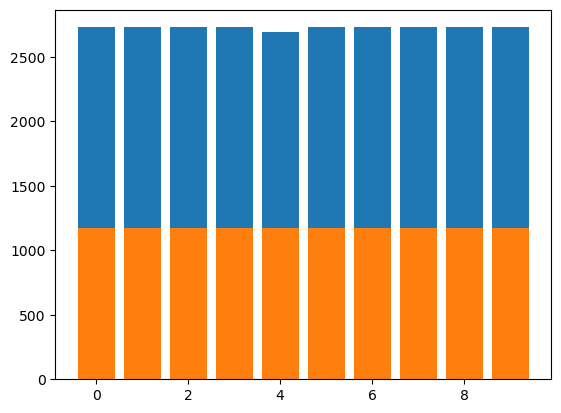

In [10]:
# Histogram for train and test 
values, count = np.unique(np.argmax(y_train, axis=1), return_counts=True)
plt.bar(values, count)

values, count = np.unique(np.argmax(y_test, axis=1), return_counts=True)
plt.bar(values, count)
plt.show()

# GTZAN Melspectrogram Generator

In [11]:
from tensorflow.keras.utils import Sequence

class GTZANGenerator(Sequence):
    def __init__(self, X, y, batch_size=64, is_test = False):
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.is_test = is_test
    
    def __len__(self):
        return int(np.ceil(len(self.X)/self.batch_size))
    
    def __getitem__(self, index):
        # Get batch indexes
        signals = self.X[index*self.batch_size:(index+1)*self.batch_size]

        # Apply data augmentation
        if not self.is_test:
            signals = self.__augment(signals)
        return signals, self.y[index*self.batch_size:(index+1)*self.batch_size]
    
    def __augment(self, signals, hor_flip = 0.5, random_cutout = 0.5):
        #data augmentation        
        spectrograms =  []
        for s in signals:
            signal = copy(s)
            
            # Perform horizontal flip
            if np.random.rand() < hor_flip:
                signal = np.flip(signal, 1)

            # Perform random cutoout of some frequency/time
            if np.random.rand() < random_cutout:
                lines = np.random.randint(signal.shape[0], size=3)
                cols = np.random.randint(signal.shape[0], size=4)
                signal[lines, :, :] = -80 # dB
                signal[:, cols, :] = -80 # dB

            spectrograms.append(signal)
        return np.array(spectrograms)
    
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.X))
        np.random.shuffle(self.indexes)
        return None

# Custom CNN (Melspectrogram version)

In [12]:
def conv_block(x, n_filters, pool_size=(2, 2)):
    x = Conv2D(n_filters, (3, 3), strides=(1, 1), padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=pool_size, strides=pool_size)(x)
    x = Dropout(0.25)(x)
    return x

In [13]:
# Original CNN Model Definition
def create_model(input_shape, num_genres):
    inpt = Input(shape=input_shape)
    x = conv_block(inpt, 16)
    x = conv_block(x, 32)
    x = conv_block(x, 64)
    x = conv_block(x, 128)
    x = conv_block(x, 256)
    
    # Global Pooling and MLP
    x = Flatten()(x)
    x = Dropout(0.5)(x)
    x = Dense(512, activation='relu', 
              kernel_regularizer=tf.keras.regularizers.l2(0.02))(x)
    x = Dropout(0.25)(x)
    predictions = Dense(num_genres, 
                        activation='softmax', 
                        kernel_regularizer=tf.keras.regularizers.l2(0.02))(x)
    
    model = Model(inputs=inpt, outputs=predictions)
    return model

In [14]:
model = create_model(X_train[0].shape, len(genres))

In [15]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 129, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 129, 16)      160       
                                                                 
 activation (Activation)     (None, 128, 129, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 64, 64, 16)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                             

### Loss function

In [16]:
model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

In [18]:
# Generators
batch_size = 128
train_generator = GTZANGenerator(X_train, y_train)
steps_per_epoch = np.ceil(len(X_train)/batch_size)

validation_generator = GTZANGenerator(X_test, y_test)
val_steps = np.ceil(len(X_test)/batch_size)

In [19]:
hist = model.fit_generator(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_generator,
    validation_steps=val_steps,
    epochs=150,
    verbose=1)

Epoch 1/150


C:\Users\Frank\AppData\Local\Temp\ipykernel_20632\994739274.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist = model.fit_generator(


213/213 [==============================] - 9s 15ms/step - loss: 12.1368 - accuracy: 0.1202 - val_loss: 6.0075 - val_accuracy: 0.1579 - lr: 0.0010
Epoch 2/150
213/213 [==============================] - 3s 14ms/step - loss: 4.3640 - accuracy: 0.1525 - val_loss: 3.3146 - val_accuracy: 0.1761 - lr: 0.0010
Epoch 3/150
213/213 [==============================] - 4s 17ms/step - loss: 2.8993 - accuracy: 0.1990 - val_loss: 2.6432 - val_accuracy: 0.1900 - lr: 0.0010
Epoch 4/150
213/213 [==============================] - 3s 15ms/step - loss: 2.4805 - accuracy: 0.1904 - val_loss: 2.3537 - val_accuracy: 0.1940 - lr: 0.0010
Epoch 5/150
213/213 [==============================] - 3s 14ms/step - loss: 2.3181 - accuracy: 0.1932 - val_loss: 2.2135 - val_accuracy: 0.1867 - lr: 0.0010
Epoch 6/150
213/213 [==============================] - 3s 15ms/step - loss: 2.2223 - accuracy: 0.2064 - val_loss: 2.1660 - val_accuracy: 0.2211 - lr: 0.0010
Epoch 7/150
213/213 [==============================] - 3s 15ms/step -

Epoch 92/150
213/213 [==============================] - 3s 15ms/step - loss: 1.1540 - accuracy: 0.6363 - val_loss: 1.3237 - val_accuracy: 0.5795 - lr: 5.6880e-04
Epoch 93/150
213/213 [==============================] - ETA: 0s - loss: 1.2032 - accuracy: 0.6217
Epoch 93: ReduceLROnPlateau reducing learning rate to 0.0005403600225690752.
213/213 [==============================] - 3s 15ms/step - loss: 1.2032 - accuracy: 0.6217 - val_loss: 1.1973 - val_accuracy: 0.6252 - lr: 5.6880e-04
Epoch 94/150
213/213 [==============================] - 3s 15ms/step - loss: 1.1093 - accuracy: 0.6576 - val_loss: 1.1726 - val_accuracy: 0.6354 - lr: 5.4036e-04
Epoch 95/150
213/213 [==============================] - 3s 16ms/step - loss: 1.1875 - accuracy: 0.6375 - val_loss: 1.3396 - val_accuracy: 0.5783 - lr: 5.4036e-04
Epoch 96/150
213/213 [==============================] - 3s 16ms/step - loss: 1.1405 - accuracy: 0.6483 - val_loss: 1.2010 - val_accuracy: 0.6384 - lr: 5.4036e-04
Epoch 97/150
210/213 [======

In [20]:
#accuracy score

score = model.evaluate(X_test, y_test, verbose=0)
print("val_loss = {:.3f} and val_acc = {:.3f}".format(score[0], score[1]))

val_loss = 1.102 and val_acc = 0.674


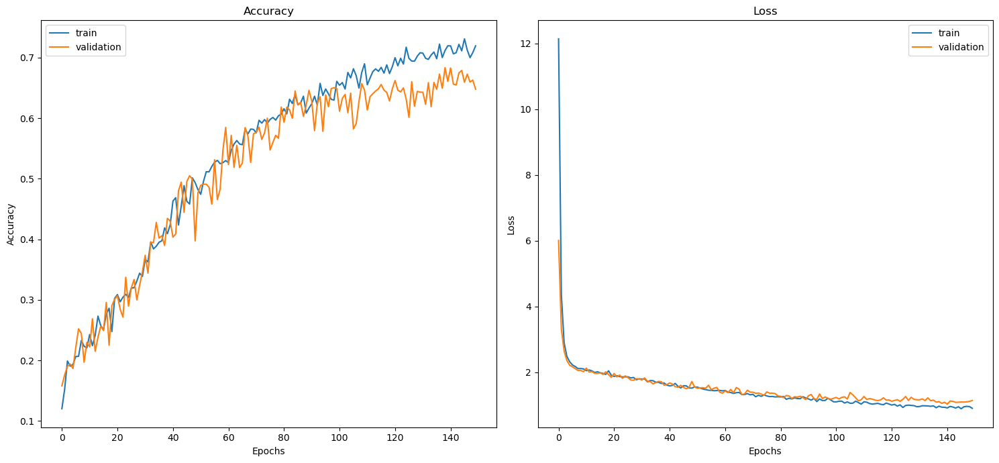

In [21]:
#plot figures

plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'], label='train')
plt.plot(hist.history['val_accuracy'], label='validation')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='validation')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [22]:
#http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [23]:
preds = np.argmax(model.predict(X_test), axis = 1)
y_orig = np.argmax(y_test, axis = 1)
cm = confusion_matrix(preds, y_orig)

366/366 [==============================] - 1s 3ms/step


Normalized confusion matrix


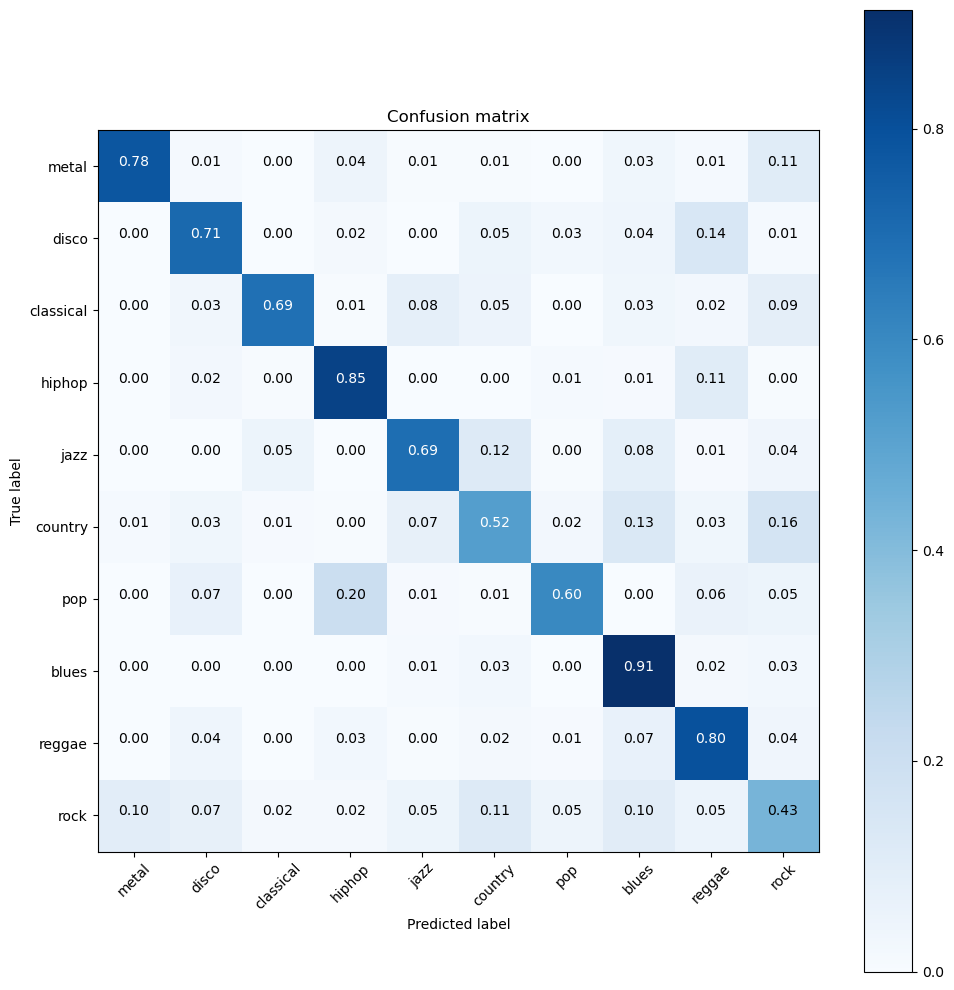

In [24]:
keys = OrderedDict(sorted(genres.items(), key=lambda t: t[1])).keys()

plt.figure(figsize=(10,10))
plot_confusion_matrix(cm, keys, normalize=True)

## Save the model

In [31]:
# Save the model
model.save('../models/custom_cnn_2d.h5')